In [1]:
#ZIYU WAN PLOS ONE CODE SUBMISSION

In [2]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
import seaborn.objects as so

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from statsmodels.formula.api import ols
import statsmodels.api as sm
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.multicomp import pairwise_tukeyhsd

In [3]:
#Combined two dataset from Donor metadata (demographic, clinical, cognitive, and neuropathological data) and the
#Measurements of Abeta, pTau, pTDP43, a-synuclein, Neun+ cells, IBA1+ cells, and GFAP+ cells from 
#quantitative analysis of stained neuropathology images from Middle Temporal Gyrus (MTG).

#read the excel for usage of coding later
donor_combined= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\donor_metadata_combined.xlsx')
donor_combined

,Donor ID,Primary Study Name,Secondary Study Name,Age at Death,Sex,Race (choice=White),Race (choice=Black/ African American),Race (choice=Asian),Race (choice=American Indian/ Alaska Native),Race (choice=Native Hawaiian or Pacific Islander),...,GFAP area analyzed_Layer4,GFAP area analyzed_Layer5-6,ripa abeta40_Grey matter,ripa abeta42_Grey matter,ripa tTau_Grey matter,ripa pTau_Grey matter,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,H19.33.004,ACT,NaN,80,Female,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,5149101.50,24960854,0.019621,0.971579,1552.414737,1.901053,1.409474,9.487368,93.387368,1.493684
1,H20.33.001,ACT,NaN,82,Male,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,10035712.00,39595568,0.215789,2.744211,756.090526,2.737895,1.015616,7.822105,76.413684,1.580000
2,H20.33.002,ACT,NaN,90+,Female,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,7088817.00,24013120,0.000598,0.147158,313.525263,2.615789,0.100708,0.610526,31.521053,1.068421
3,H20.33.004,ACT,NaN,86,Male,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,9473856.00,14944554,60.766316,80.266316,318.528421,7.412632,91.172000,226.900000,44.423158,2.397895
4,H20.33.005,ACT,NaN,90+,Female,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,4675924.00,24942594,5.136842,16.156842,107.348421,1.327368,28.778000,121.266000,10.516842,0.545263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,H21.33.043,ACT,NaN,90+,Female,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,9706169.00,38430856,1.593684,29.892632,611.000000,4.404211,3.465263,114.392632,48.078947,2.775789
80,H21.33.044,ACT,NaN,88,Female,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,9958693.00,41765288,7.130526,33.637895,417.894737,3.662105,10.273684,111.835790,59.477895,1.818947
81,H21.33.045,ADRC Clinical Core,NaN,90+,Female,Unchecked,Unchecked,Checked,Unchecked,Unchecked,...,8399442.00,36778840,21.423158,53.878947,147.565263,11.489474,46.231579,954.656984,14.405263,1.678947
82,H21.33.046,ACT,NaN,90+,Male,Checked,Unchecked,Unchecked,Unchecked,Unchecked,...,3684067.25,16472456,2.421053,19.195789,1124.777383,3.129474,26.908000,1694.563486,262.382105,1.815789


In [4]:
#Biomarkers and antibodies association with apoE4 and cognitive status of across all cortical layers

In [5]:
#AT8

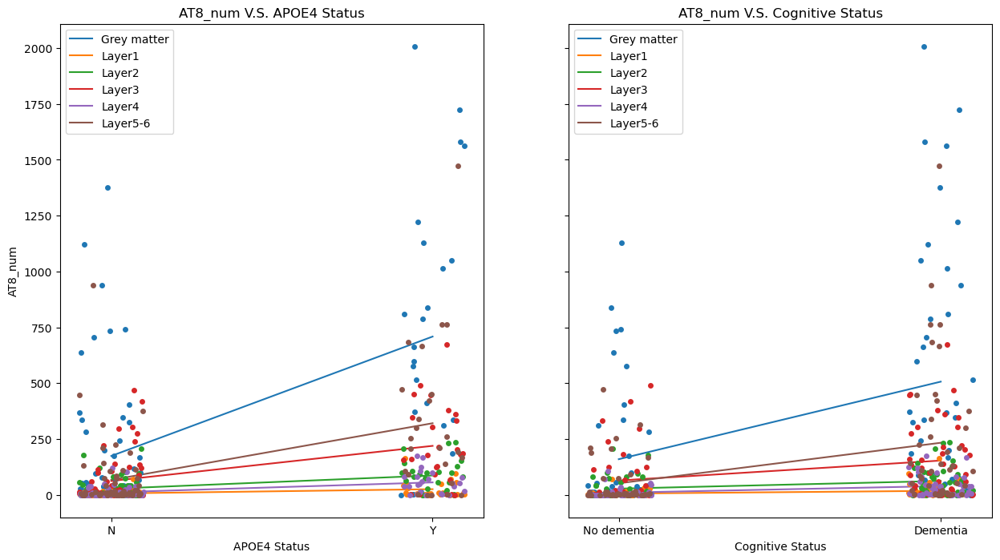

<Figure size 640x480 with 0 Axes>

In [6]:
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey=True)
Biomarker_list = ['AT8']#AT8
Anatomy_list = ['Grey matter','Layer1','Layer2','Layer3','Layer4', 'Layer5-6']#layers
#For loop to run through each layers
for B in Biomarker_list:
    plt.figure()
    for A in Anatomy_list:
        type1= 'number of '+ B + ' positive cells_'+ A
        sns.stripplot(ax=axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type1])
        sns.lineplot(ax= axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type1], label=A, errorbar=None)
        #AT8 numbers correlation with apoE4 status of all 6 cortical layers and Grey matter
        sns.stripplot(ax=axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type1])
        sns.lineplot(ax= axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type1], label=A,errorbar=None)
        #AT8 numbers correlation with cognitive status of all 6 cortical layers and Grey matter
        axes[0].set_title('AT8_num V.S. APOE4 Status')
        axes[0].set_ylabel('AT8_num')
        axes[1].set_title('AT8_num V.S. Cognitive Status')
        axes[1].set_ylabel('AT8_num')
        

In [7]:
#6e10

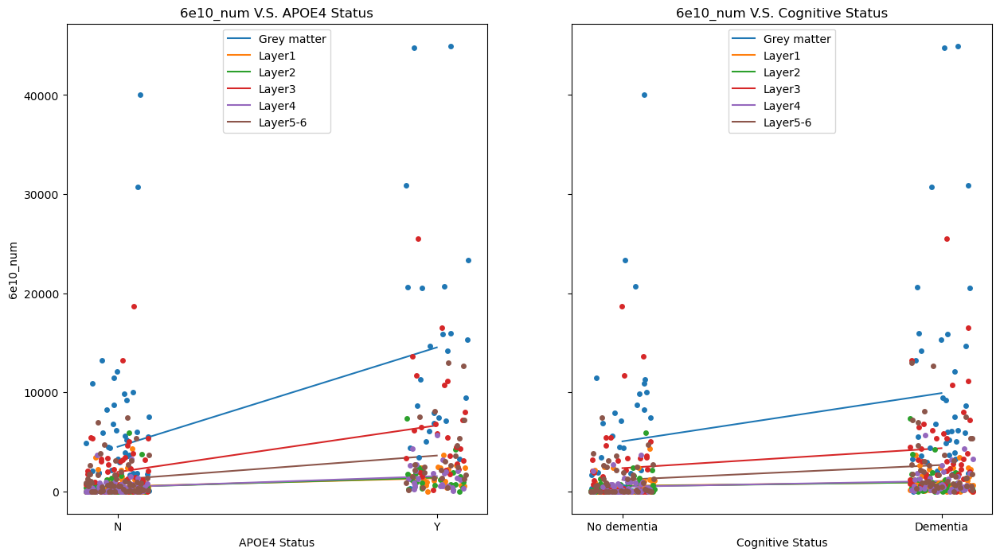

<Figure size 640x480 with 0 Axes>

In [8]:
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey=True)
Biomarker_list = ['6e10']
Anatomy_list = ['Grey matter','Layer1','Layer2','Layer3','Layer4', 'Layer5-6']# layers
#for loop to run through each layers
for B in Biomarker_list:
    plt.figure()
    for A in Anatomy_list:
        type2= 'number of '+ B + ' positive objects_'+ A
        sns.stripplot(ax=axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type2])
        sns.lineplot(ax= axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type2], label=A, errorbar=None)
        sns.stripplot(ax=axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type2])
        sns.lineplot(ax= axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type2], label=A, errorbar=None)
        axes[0].set_title('6e10_num V.S. APOE4 Status')
        axes[0].set_ylabel('6e10_num')
        axes[1].set_title('6e10_num V.S. Cognitive Status')
        axes[1].set_ylabel('6e10_num')


In [9]:
#Iba1

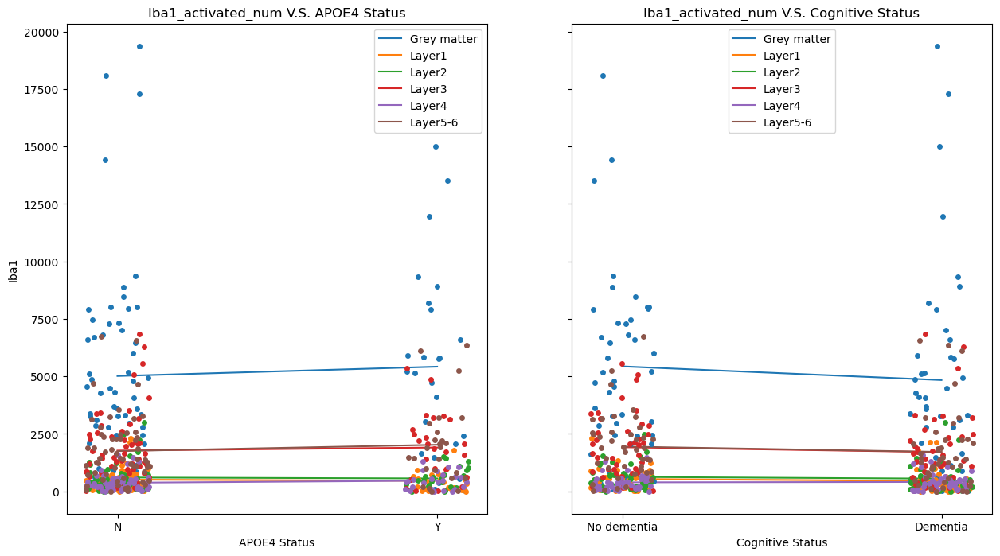

<Figure size 640x480 with 0 Axes>

In [10]:
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey=True)
Biomarker_list = ['Iba1']
Anatomy_list = ['Grey matter','Layer1','Layer2','Layer3','Layer4', 'Layer5-6']

for B in Biomarker_list:
    plt.figure()
    for A in Anatomy_list:
        type3= 'number of '+'activated '+ B + ' positive cells_'+ A
        sns.stripplot(ax=axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type3])
        sns.lineplot(ax= axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type3], label=A, errorbar=None)
        sns.stripplot(ax=axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type3])
        sns.lineplot(ax= axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type3], label=A, errorbar=None)
        axes[0].set_title('Iba1_activated_num V.S. APOE4 Status')
        axes[0].set_ylabel('Iba1')
        axes[1].set_title('Iba1_activated_num V.S. Cognitive Status')
        axes[1].set_ylabel('Iba1')


In [11]:
#GFAP

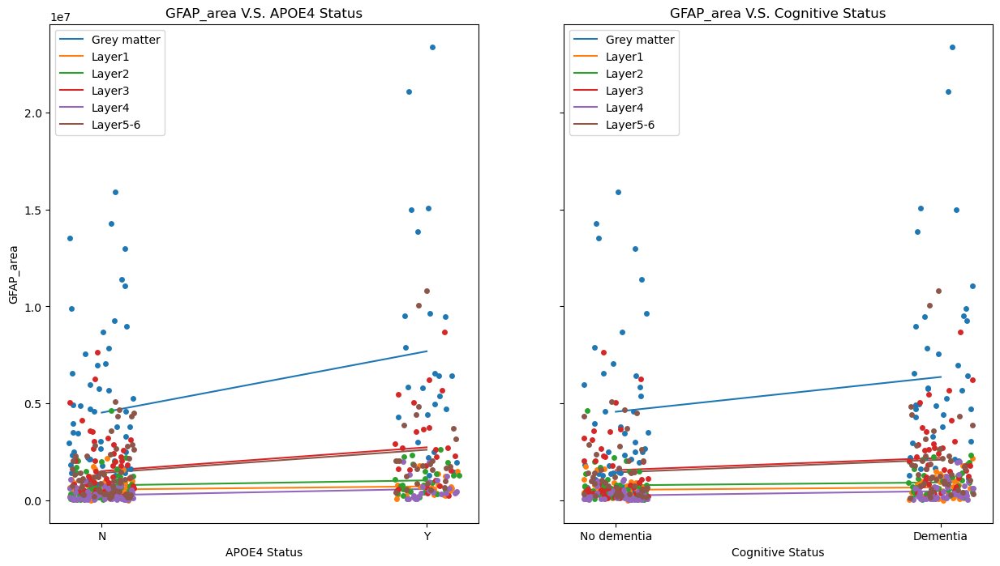

<Figure size 640x480 with 0 Axes>

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey=True)
Biomarker_list = ['GFAP']
Anatomy_list = ['Grey matter','Layer1','Layer2','Layer3','Layer4', 'Layer5-6']

for B in Biomarker_list:
    plt.figure()
    for A in Anatomy_list:
        type4= 'total '+ B + ' positive area_'+ A
        sns.stripplot(ax=axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type4])
        sns.lineplot(ax= axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type4], label=A, errorbar=None)
        sns.stripplot(ax=axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type4])
        sns.lineplot(ax= axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type4], label=A, errorbar=None)
        axes[0].set_title('GFAP_area V.S. APOE4 Status')
        axes[0].set_ylabel('GFAP_area')
        axes[1].set_title('GFAP_area V.S. Cognitive Status')
        axes[1].set_ylabel('GFAP_area')


In [13]:
#Neun

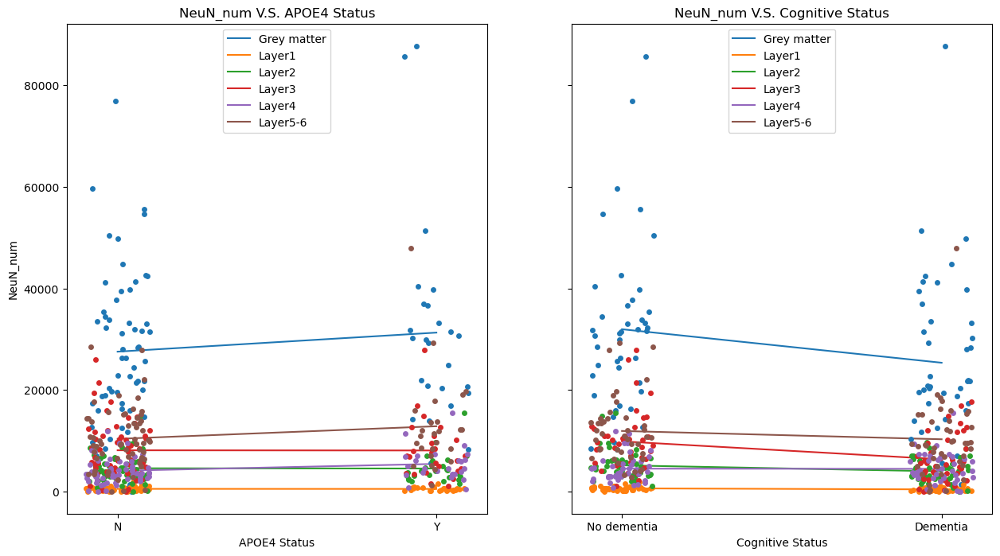

<Figure size 640x480 with 0 Axes>

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey=True)
Biomarker_list = ['NeuN']
Anatomy_list = ['Grey matter','Layer1','Layer2','Layer3','Layer4', 'Layer5-6']

for B in Biomarker_list:
    plt.figure()
    for A in Anatomy_list:
        type5= 'number of '+ B + ' positive cells_'+ A
        sns.stripplot(ax=axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type5])
        sns.lineplot(ax= axes[0], x=donor_combined['APOE4 Status'],y=donor_combined[type5], label=A, errorbar=None)
        sns.stripplot(ax=axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type5])
        sns.lineplot(ax= axes[1], x=donor_combined['Cognitive Status'],y=donor_combined[type5], label=A, errorbar=None)
        axes[0].set_title('NeuN_num V.S. APOE4 Status')
        axes[0].set_ylabel('NeuN_num')
        axes[1].set_title('NeuN_num V.S. Cognitive Status')
        axes[1].set_ylabel('NeuN_num')


In [15]:
#Biomarkers Trend with Alzheimer's Disease(AD) Pathological stages of Braak and Thal

Text(0, 0.5, 'AT8_num')

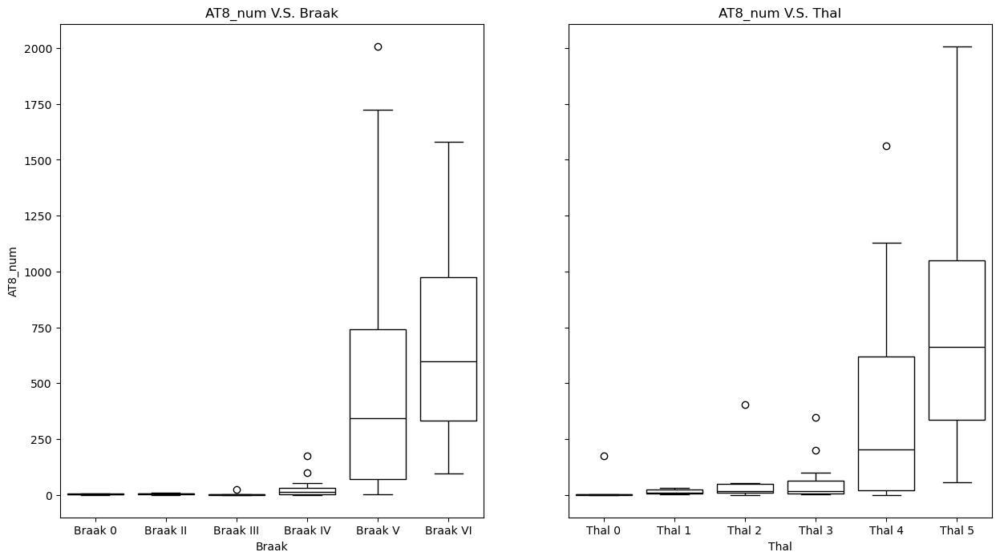

In [16]:
#Grey Matter AT8's cell number aggregation through stages of Braak 0-6 and Thal 0-6
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey= True)
order1=['Braak 0','Braak II','Braak III','Braak IV','Braak V', 'Braak VI']
order2=['Thal 0','Thal 1','Thal 2','Thal 3','Thal 4','Thal 5']

sns.boxplot(ax=axes[0], x=donor_combined['Braak'],y=donor_combined['number of AT8 positive cells_Grey matter'],order=order1,color= 'white', linecolor='black')
sns.boxplot(ax=axes[1], x=donor_combined['Thal'],y=donor_combined['number of AT8 positive cells_Grey matter'], order=order2,color= 'white', linecolor='black')


axes[0].set_ylabel('AT8_num')
axes[0].set_title('AT8_num V.S. Braak')
axes[1].set_title('AT8_num V.S. Thal')
axes[1].set_ylabel('AT8_num')


Text(0, 0.5, '6e10_num')

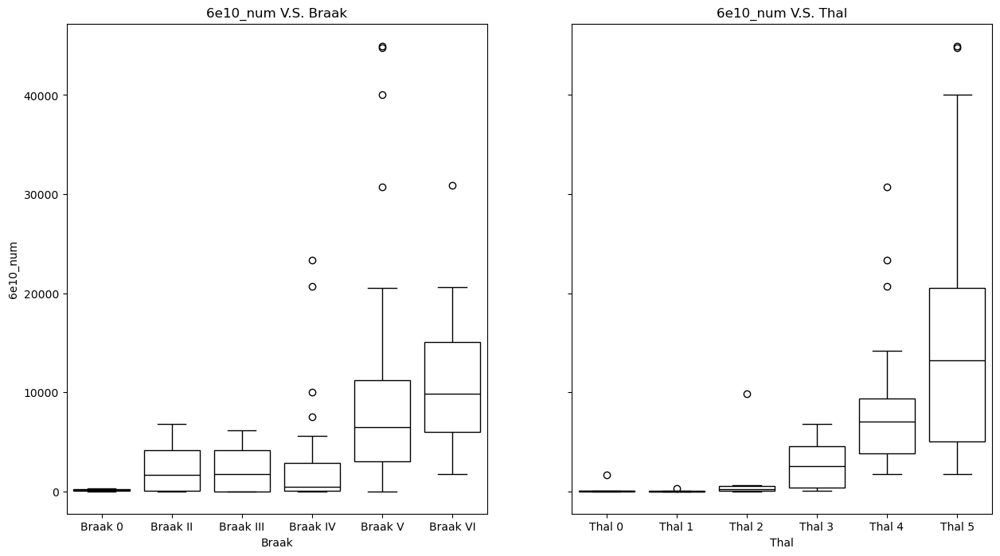

In [17]:
#Grey Matter 6e10's cell number aggregation through stages of Braak 0-6 and Thal 0-6
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey= True)
order1=['Braak 0','Braak II','Braak III','Braak IV','Braak V', 'Braak VI']
order2=['Thal 0','Thal 1','Thal 2','Thal 3','Thal 4','Thal 5']

sns.boxplot(ax=axes[0], x=donor_combined['Braak'],y=donor_combined['number of 6e10 positive objects_Grey matter'],order=order1,color= 'white', linecolor='black')
sns.boxplot(ax=axes[1], x=donor_combined['Thal'],y=donor_combined['number of 6e10 positive objects_Grey matter'], order=order2,color= 'white', linecolor='black')


axes[0].set_ylabel('6e10_num')
axes[0].set_title('6e10_num V.S. Braak')
axes[1].set_title('6e10_num V.S. Thal')
axes[1].set_ylabel('6e10_num')


Text(0, 0.5, 'Iba1_activated_num')

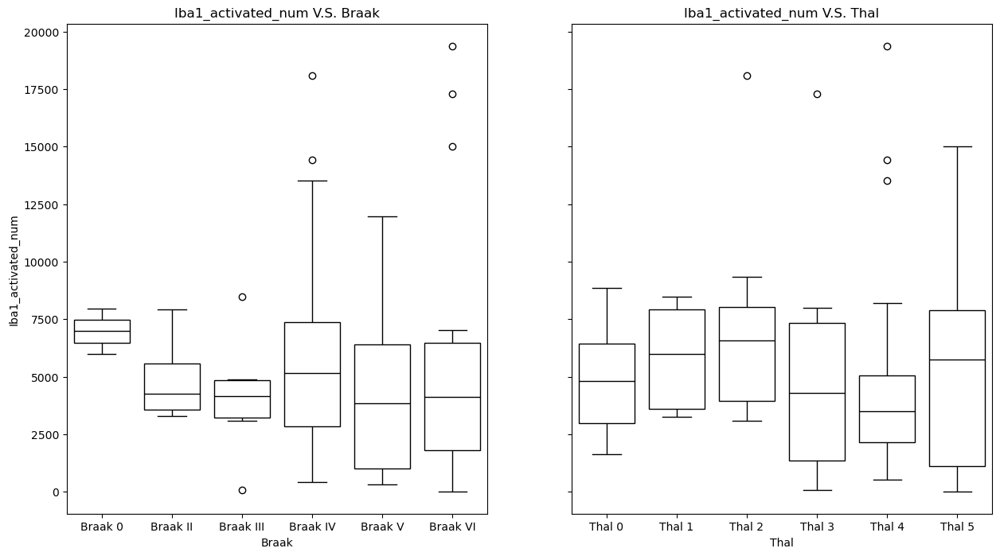

In [18]:
#Grey Matter Iba1's activation number aggregation through stages of Braak 0-6 and Thal 0-6
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey= True)
order1=['Braak 0','Braak II','Braak III','Braak IV','Braak V', 'Braak VI']
order2=['Thal 0','Thal 1','Thal 2','Thal 3','Thal 4','Thal 5']

sns.boxplot(ax=axes[0], x=donor_combined['Braak'],y=donor_combined['number of activated Iba1 positive cells_Grey matter'],order=order1,color= 'white', linecolor='black')
sns.boxplot(ax=axes[1], x=donor_combined['Thal'],y=donor_combined['number of activated Iba1 positive cells_Grey matter'], order=order2,color= 'white', linecolor='black')


axes[0].set_ylabel('Iba1_activated_num')
axes[0].set_title('Iba1_activated_num V.S. Braak')
axes[1].set_title('Iba1_activated_num V.S. Thal')
axes[1].set_ylabel('Iba1_activated_num')


Text(0, 0.5, 'GFAP_area')

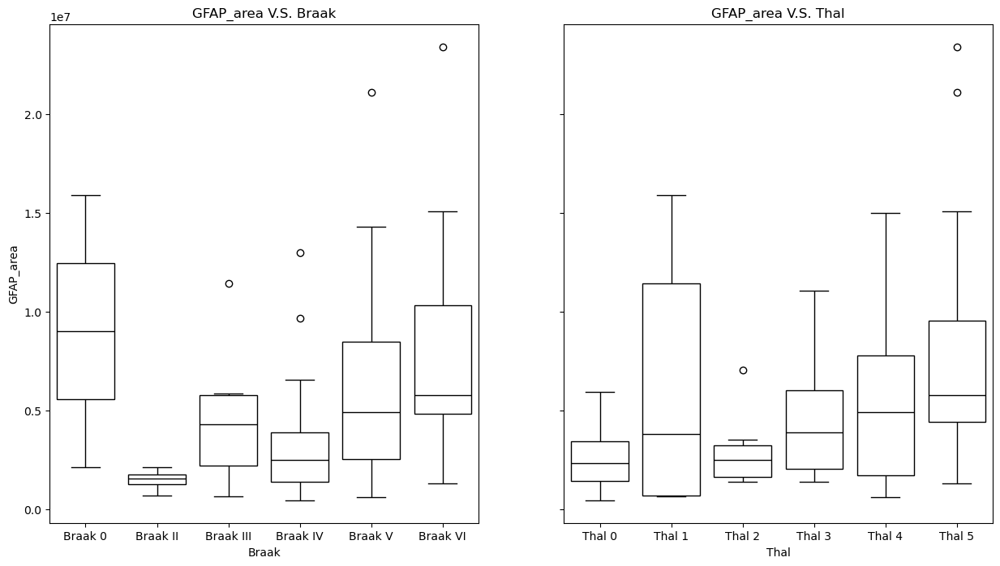

In [19]:
#Grey Matter GFAP's area aggregation through stages of Braak 0-6 and Thal 0-6
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey= True)
order1=['Braak 0','Braak II','Braak III','Braak IV','Braak V', 'Braak VI']
order2=['Thal 0','Thal 1','Thal 2','Thal 3','Thal 4','Thal 5']

sns.boxplot(ax=axes[0], x=donor_combined['Braak'],y=donor_combined['total GFAP positive area_Grey matter'],order=order1,color= 'white', linecolor='black')
sns.boxplot(ax=axes[1], x=donor_combined['Thal'],y=donor_combined['total GFAP positive area_Grey matter'], order=order2,color= 'white', linecolor='black')


axes[0].set_ylabel('GFAP_area')
axes[0].set_title('GFAP_area V.S. Braak')
axes[1].set_title('GFAP_area V.S. Thal')
axes[1].set_ylabel('GFAP_area')

Text(0, 0.5, 'NeuN_num')

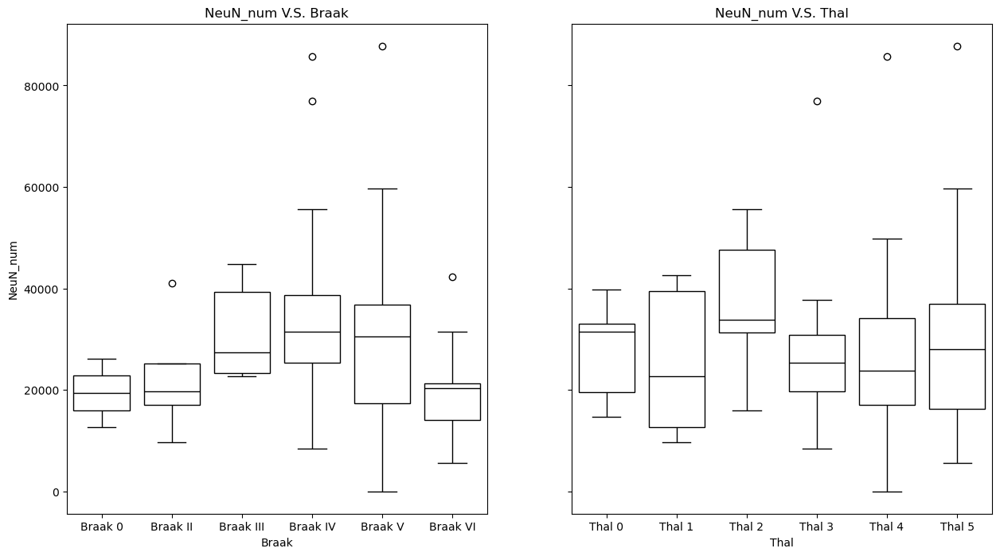

In [20]:
#Grey Matter NeuN through stages of Braak 0-6 and Thal 0-6
fig, axes = plt.subplots(1, 2, figsize=(15,8), sharey= True)
order1=['Braak 0','Braak II','Braak III','Braak IV','Braak V', 'Braak VI']
order2=['Thal 0','Thal 1','Thal 2','Thal 3','Thal 4','Thal 5']

sns.boxplot(ax=axes[0], x=donor_combined['Braak'],y=donor_combined['number of NeuN positive cells_Grey matter'],order=order1,color= 'white', linecolor='black')
sns.boxplot(ax=axes[1], x=donor_combined['Thal'],y=donor_combined['number of NeuN positive cells_Grey matter'], order=order2,color= 'white', linecolor='black')


axes[0].set_ylabel('NeuN_num')
axes[0].set_title('NeuN_num V.S. Braak')
axes[1].set_title('NeuN_num V.S. Thal')
axes[1].set_ylabel('NeuN_num')

In [21]:
#Group data for data analysis

In [22]:
#Used Excel to group female only dataset
female= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\Female.xlsx')
female

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ptauratio,abeta42/40ratio,ttau/abeta42ratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,H19.33.004,Female,N,No dementia,2862,24,0,18890,1.092193e+06,0.019621,...,1552.414737,1.901053,1.956663,0.001225,49.517166,1597.826653,1.409474,9.487368,93.387368,1.493684
1,H20.33.002,Female,N,No dementia,1621,16,1,31548,2.491895e+06,0.000598,...,313.525263,2.615789,17.775393,0.008343,246.126653,2130.536477,0.100708,0.610526,31.521053,1.068421
2,H20.33.005,Female,N,No dementia,2449,421,1,8444,1.384955e+06,5.136842,...,107.348421,1.327368,0.082155,0.012365,3.145287,6.644146,28.778000,121.266000,10.516842,0.545263
3,H20.33.008,Female,Y,No dementia,3036,6906,311,16897,1.458294e+06,3.991579,...,125.933684,2.569474,0.025233,0.020403,25.511340,1.236699,0.000805,0.073579,0.009000,0.302105
4,H20.33.011,Female,Y,Dementia,9331,20554,411,51335,4.428756e+06,11.845263,...,1141.492355,8.536842,0.141078,0.007479,5.108504,18.864032,37.761053,1252.322206,161.782105,3.581053
5,H20.33.012,Female,N,No dementia,3609,7,24,42547,1.140424e+07,2.529474,...,950.741053,4.545263,0.095270,0.004781,18.861423,19.927720,16.144000,1509.758216,65.470526,1.940000
6,H20.33.014,Female,N,No dementia,444,399,100,21387,1.408618e+06,0.526168,...,258.624211,3.398947,0.210619,0.013142,30.670606,16.025895,1.675758,97.642105,83.395789,1.680000
7,H20.33.016,Female,N,Dementia,2801,3612,3,12458,8.506124e+05,2.671579,...,488.898947,2.282105,0.107274,0.004668,7.962963,22.981395,6.853684,94.607368,91.485263,1.683158
8,H20.33.018,Female,Y,Dementia,15023,15881,1581,20404,2.339568e+07,196.732000,...,177.566316,5.110526,0.003618,0.028781,7.180159,0.125705,30.794737,135.515790,0.011000,0.310526
9,H20.33.019,Female,Y,No dementia,4714,3462,0,24857,1.952573e+06,1.718947,...,312.744211,2.884211,0.100099,0.009222,16.762400,10.854017,12.010000,262.532000,62.141053,1.493684


In [23]:
#select only apoE4 negative carrier in female group
female_n=female.loc[(female['APOE4 Status']=='N')]
female_n

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ptauratio,abeta42/40ratio,ttau/abeta42ratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,H19.33.004,Female,N,No dementia,2862,24,0,18890,1.092193e+06,0.019621,...,1552.414737,1.901053,1.956663,0.001225,49.517166,1597.826653,1.409474,9.487368,93.387368,1.493684
1,H20.33.002,Female,N,No dementia,1621,16,1,31548,2.491895e+06,0.000598,...,313.525263,2.615789,17.775393,0.008343,246.126653,2130.536477,0.100708,0.610526,31.521053,1.068421
2,H20.33.005,Female,N,No dementia,2449,421,1,8444,1.384955e+06,5.136842,...,107.348421,1.327368,0.082155,0.012365,3.145287,6.644146,28.778000,121.266000,10.516842,0.545263
5,H20.33.012,Female,N,No dementia,3609,7,24,42547,1.140424e+07,2.529474,...,950.741053,4.545263,0.095270,0.004781,18.861423,19.927720,16.144000,1509.758216,65.470526,1.940000
6,H20.33.014,Female,N,No dementia,444,399,100,21387,1.408618e+06,0.526168,...,258.624211,3.398947,0.210619,0.013142,30.670606,16.025895,1.675758,97.642105,83.395789,1.680000
7,H20.33.016,Female,N,Dementia,2801,3612,3,12458,8.506124e+05,2.671579,...,488.898947,2.282105,0.107274,0.004668,7.962963,22.981395,6.853684,94.607368,91.485263,1.683158
11,H20.33.027,Female,N,No dementia,6797,1820,38,24336,1.802215e+06,1.843158,...,224.243158,3.365263,0.112341,0.015007,16.252427,7.485804,13.010000,191.708000,24.386316,1.477895
12,H20.33.028,Female,N,Dementia,5121,1772,369,778,8.980397e+06,1.127368,...,192.028421,2.927368,0.154500,0.015244,16.806723,10.134833,14.100000,285.604000,5.903158,0.778947
13,H20.33.029,Female,N,Dementia,625,1721,9,21783,2.059531e+06,1.633684,...,302.231579,3.191579,0.110608,0.010560,17.662371,10.474245,5.431579,156.420000,30.756842,1.486316
15,H20.33.031,Female,N,Dementia,7029,5890,327,20403,4.940594e+06,2.004211,...,335.745263,7.827368,0.184114,0.023313,21.212185,7.897346,7.198947,719.453186,21.289474,2.173684


In [24]:
#select only apoE4 positive carrier in female group
female_y=female.loc[(female['APOE4 Status']=='Y')]
female_y

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ptauratio,abeta42/40ratio,ttau/abeta42ratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
3,H20.33.008,Female,Y,No dementia,3036,6906,311,16897,1.458294e+06,3.991579,...,125.933684,2.569474,0.025233,0.020403,25.511340,1.236699,0.000805,0.073579,0.009000,0.302105
4,H20.33.011,Female,Y,Dementia,9331,20554,411,51335,4.428756e+06,11.845263,...,1141.492355,8.536842,0.141078,0.007479,5.108504,18.864032,37.761053,1252.322206,161.782105,3.581053
8,H20.33.018,Female,Y,Dementia,15023,15881,1581,20404,2.339568e+07,196.732000,...,177.566316,5.110526,0.003618,0.028781,7.180159,0.125705,30.794737,135.515790,0.011000,0.310526
9,H20.33.019,Female,Y,No dementia,4714,3462,0,24857,1.952573e+06,1.718947,...,312.744211,2.884211,0.100099,0.009222,16.762400,10.854017,12.010000,262.532000,62.141053,1.493684
10,H20.33.026,Female,Y,Dementia,4119,8662,515,14237,6.433153e+06,31.565263,...,191.050526,12.567368,0.198302,0.065780,2.007737,3.014616,95.740000,985.188000,21.597895,3.241053
14,H20.33.030,Female,Y,No dementia,534,7114,1129,30743,5.380258e+06,17.221053,...,114.623158,6.560000,0.112586,0.057231,3.383435,1.967229,84.251579,1376.791661,11.987368,2.206316
23,H20.33.045,Female,Y,Dementia,380,30918,1222,31495,1.506225e+07,981.444000,...,1122.432229,5.415789,0.037932,0.004825,0.145477,7.861381,2179.336000,1737.483712,27.065263,2.638947
24,H21.33.002,Female,Y,Dementia,5918,5075,1013,20751,1.312358e+06,93.676842,...,200.384210,7.317895,0.097863,0.036519,0.798243,2.679763,391.798000,1679.158824,22.983158,2.968421
27,H21.33.009,Female,Y,Dementia,5759,6108,661,13865,5.784777e+06,189.290526,...,130.414737,4.948421,0.123098,0.037944,0.212366,3.244233,456.780000,1484.877660,23.758947,2.420000
30,H21.33.012,Female,Y,Dementia,1647,317,8,29333,4.291397e+06,0.215789,...,238.670526,3.669474,1.047791,0.015375,16.229268,68.150586,0.507808,6.552632,72.318947,2.246316


In [25]:
#Used Excel to group female only dataset
male= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\Male.xlsx')
male

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ttau/abeta42ratio,abeta42/40ratio,ptauratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,H20.33.001,Male,N,No dementia,6715,444,42,31147,1.393363e+06,0.215789,...,756.090526,2.737895,0.997699,275.522056,12.717073,0.003621,1.015616,7.822105,76.413684,1.580000
1,H20.33.004,Male,Y,Dementia,8907,3257,371,30277,6.546220e+06,60.766316,...,318.528421,7.412632,0.092350,3.968395,1.320901,0.023271,91.172000,226.900000,44.423158,2.397895
2,H20.33.013,Male,N,No dementia,7323,5611,11,37781,6.539739e+06,1.127368,...,272.508421,3.106316,0.125350,10.996644,21.981326,0.011399,2.033684,88.211579,24.208421,1.218947
3,H20.33.015,Male,N,Dementia,433,5218,50,17410,9.879430e+06,1.944211,...,393.183158,1.827368,0.066186,14.240878,14.200866,0.004648,2.257895,89.140000,11.596842,0.661053
4,H20.33.017,Male,N,Dementia,19375,9193,937,42372,7.547972e+06,52.642105,...,239.377895,5.881053,0.028081,1.142971,3.978464,0.024568,102.536000,1871.362386,16.289474,1.844211
5,H20.33.020,Male,Y,Dementia,5140,20615,598,21879,4.707251e+06,145.254737,...,21.718947,3.873684,0.084711,0.474955,0.314815,0.178355,104.388421,576.181296,0.080000,0.325263
6,H20.33.024,Male,N,No dementia,2431,8241,42,33231,4.612416e+06,5.095789,...,309.080000,5.222105,0.049685,2.940700,20.625697,0.016896,20.524000,1704.242073,48.455789,3.671579
7,H20.33.025,Male,N,No dementia,2073,8725,284,34452,8.682245e+06,3.532632,...,384.840000,3.691579,0.038537,4.017428,27.116508,0.009593,17.426000,1493.390763,67.778947,1.935789
8,H20.33.032,Male,N,No dementia,336,4462,735,16223,1.289686e+06,91.748421,...,156.628421,12.470526,0.281776,3.539078,0.482372,0.079619,216.264210,1042.428353,35.022105,2.873684
9,H20.33.033,Male,N,Dementia,2113,13237,95,7025,5.764281e+06,20.211579,...,92.802105,3.712632,0.030094,0.752235,6.103849,0.040006,82.576000,1973.114232,31.860000,2.009474


In [26]:
#select only apoE4 negative carrier in male group
male_n=male.loc[(male['APOE4 Status']=='N')]
male_n

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ttau/abeta42ratio,abeta42/40ratio,ptauratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,H20.33.001,Male,N,No dementia,6715,444,42,31147,1.393363e+06,0.215789,...,756.090526,2.737895,0.997699,275.522056,12.717073,0.003621,1.015616,7.822105,76.413684,1.580000
2,H20.33.013,Male,N,No dementia,7323,5611,11,37781,6.539739e+06,1.127368,...,272.508421,3.106316,0.125350,10.996644,21.981326,0.011399,2.033684,88.211579,24.208421,1.218947
3,H20.33.015,Male,N,Dementia,433,5218,50,17410,9.879430e+06,1.944211,...,393.183158,1.827368,0.066186,14.240878,14.200866,0.004648,2.257895,89.140000,11.596842,0.661053
4,H20.33.017,Male,N,Dementia,19375,9193,937,42372,7.547972e+06,52.642105,...,239.377895,5.881053,0.028081,1.142971,3.978464,0.024568,102.536000,1871.362386,16.289474,1.844211
6,H20.33.024,Male,N,No dementia,2431,8241,42,33231,4.612416e+06,5.095789,...,309.080000,5.222105,0.049685,2.940700,20.625697,0.016896,20.524000,1704.242073,48.455789,3.671579
7,H20.33.025,Male,N,No dementia,2073,8725,284,34452,8.682245e+06,3.532632,...,384.840000,3.691579,0.038537,4.017428,27.116508,0.009593,17.426000,1493.390763,67.778947,1.935789
8,H20.33.032,Male,N,No dementia,336,4462,735,16223,1.289686e+06,91.748421,...,156.628421,12.470526,0.281776,3.539078,0.482372,0.079619,216.264210,1042.428353,35.022105,2.873684
9,H20.33.033,Male,N,Dementia,2113,13237,95,7025,5.764281e+06,20.211579,...,92.802105,3.712632,0.030094,0.752235,6.103849,0.040006,82.576000,1973.114232,31.860000,2.009474
10,H20.33.040,Male,N,Dementia,3576,7533,29,49842,1.123875e+06,1.412632,...,401.930526,1.809474,0.142502,31.653320,8.988823,0.004502,12.010000,201.988000,102.587368,1.506316
12,H20.33.044,Male,N,No dementia,2981,14,2,33060,4.604752e+06,0.007088,...,7005.543158,5.630526,22.957082,28563.373379,34.600535,0.000804,0.203116,0.311579,109.728421,1.957895


In [27]:
#select only apoE4 positive carrier in male group
male_y=male.loc[(male['APOE4 Status']=='Y')]
male_y

,Donor ID,Sex,APOE4 Status,Cognitive Status,iba1_GMnumber,6e10_GMnumber,at8_GMnumber,Neun_GMnumber,GFAP_GMnumber,ripa abeta40_Grey matter,...,ripa tTau_Grey matter,ripa pTau_Grey matter,ptau/abeta42ratio,ttau/abeta42ratio,abeta42/40ratio,ptauratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
1,H20.33.004,Male,Y,Dementia,8907,3257,371,30277,6.546220e+06,60.766316,...,318.528421,7.412632,0.092350,3.968395,1.320901,0.023271,91.172000,226.900000,44.423158,2.397895
5,H20.33.020,Male,Y,Dementia,5140,20615,598,21879,4.707251e+06,145.254737,...,21.718947,3.873684,0.084711,0.474955,0.314815,0.178355,104.388421,576.181296,0.080000,0.325263
11,H20.33.043,Male,Y,No dementia,13521,23316,14,85740,9.652443e+06,97.800000,...,709.813684,5.782105,0.094861,11.645132,0.623248,0.008146,157.734737,891.475467,81.836842,2.961053
18,H21.33.006,Male,Y,No dementia,2397,20720,4,31848,3.013907e+06,12.876842,...,160.583158,3.169474,0.038199,1.935375,6.443554,0.019737,27.790000,248.982000,37.712632,1.666316
25,H21.33.027,Male,Y,Dementia,6584,14637,186,39836,2.213426e+06,31.711579,...,222.818947,2.709474,0.068012,5.593141,1.256257,0.012160,63.285263,264.749474,49.425263,2.098947
27,H21.33.029,Male,Y,Dementia,7898,44954,1050,33153,4.962443e+06,17.827368,...,953.132632,2.040000,0.013891,6.489983,8.238014,0.002140,32.774737,651.761053,98.103158,1.561053
28,H21.33.030,Male,Y,No dementia,84,4358,2,29877,5.834612e+06,1.827368,...,948.136842,5.212632,0.281044,51.119750,10.149770,0.005498,4.728421,137.805263,147.302105,2.397895
29,H21.33.031,Male,Y,Dementia,11953,44792,2008,87785,2.110722e+07,34.429474,...,860.377895,4.793684,0.038524,6.914290,3.614192,0.005572,52.375789,635.781053,67.924211,2.140000
30,H21.33.040,Male,Y,No dementia,5807,7958,839,36571,7.878514e+06,5.010526,...,740.583158,3.327368,0.037738,8.399542,17.596849,0.004493,6.568421,340.077895,110.118947,1.825263


In [28]:
#Correlation of each biomarker and antibody with Tau tanglements (hyperphosphorylated Tau/p-Tau level ) and Amyloid plaques (amyloid-beta 42 level)

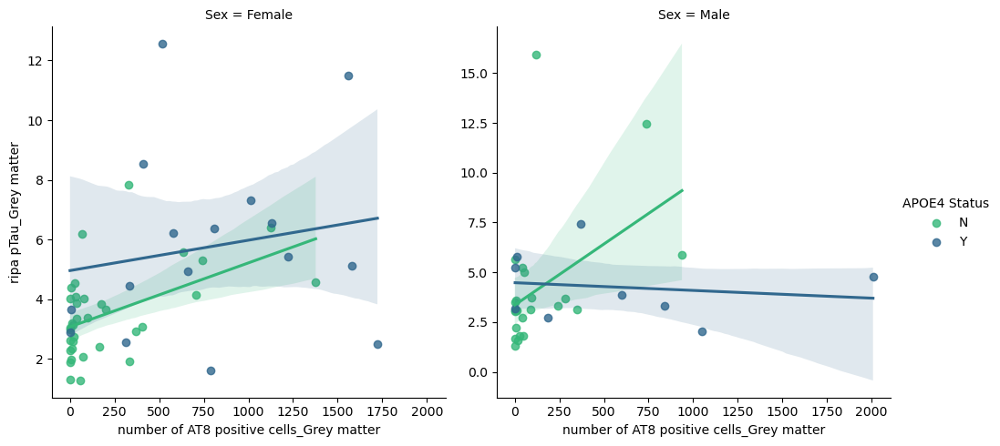

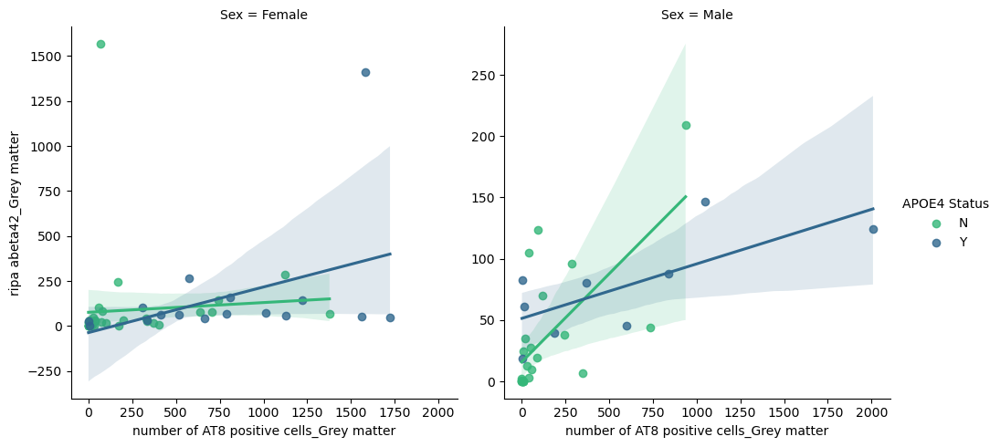

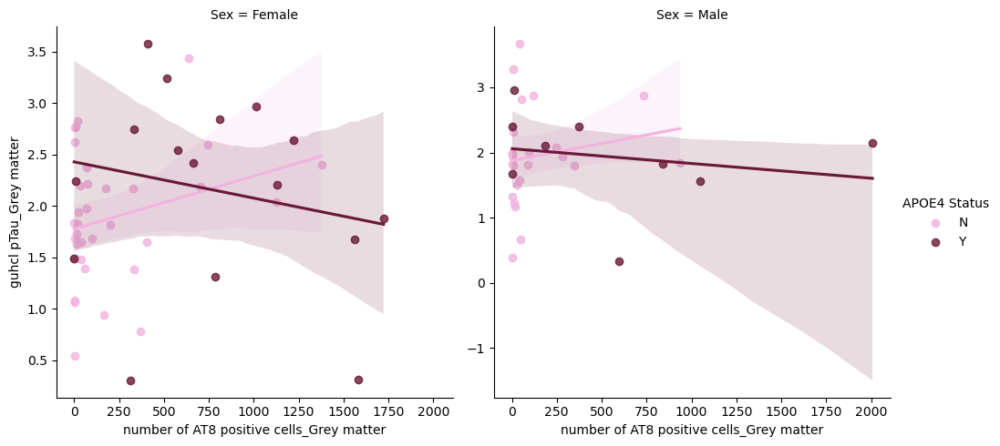

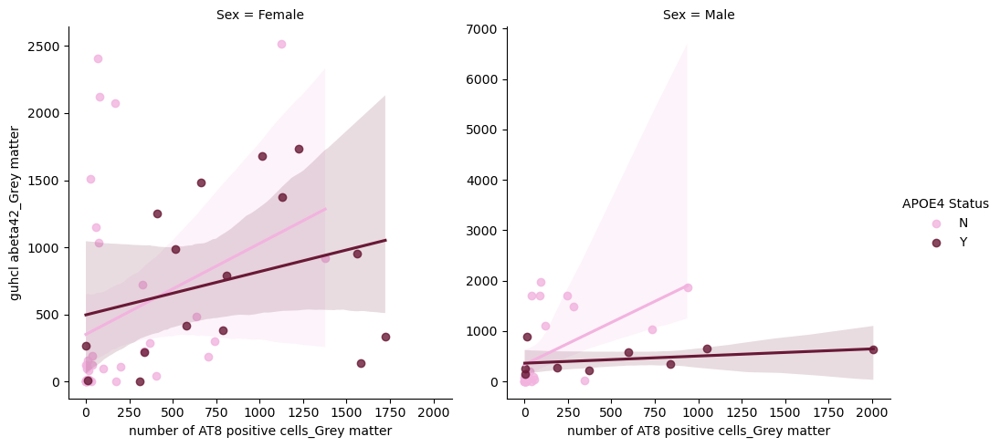

In [29]:
#Regression of AT8 numbers's association with the phosphorylated Tau level and amyloid-beta 42 levels, Sex and apoE4 status was considered

#Pearson's correlation is also performed

#define Variables 
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]

facet_kws = {'sharey': False}  # Set shared y-axis to False
# Loop through each variable and plot regression fit between at8 number with ptau, and abeta42 in ripa and guhcl
for var in variables:
    if 'ripa' in var:
        #Female and Male groups & apoE4 negative and positive groups are compared
        sns.lmplot(x='number of AT8 positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette='viridis_r')
    else:
        sns.lmplot(x='number of AT8 positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette=['#f2b3df','#691936'])

In [30]:
#Female group: Pearson's R correlation and p-value 
#AT8 number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Female_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(female_n[var], female_n['at8_GMnumber']) #used at8_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Female_apoE4 Negative group to run the analysis of pearson R for Female_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(female_y[var], female_y['at8_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter       0.488333  0.002918
ripa abeta42_Grey matter    0.068106  0.697470
guhcl pTau_Grey matter      0.273914  0.111325
guhcl abeta42_Grey matter   0.301095  0.078806
                           Pearson r   p-value
ripa pTau_Grey matter       0.177795  0.510044
ripa abeta42_Grey matter    0.404411  0.120263
guhcl pTau_Grey matter     -0.201511  0.454225
guhcl abeta42_Grey matter   0.286870  0.281370


In [31]:
#Male group: Pearson's R correlation and p-value 
#AT8 number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Male_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(male_n[var], male_n['at8_GMnumber']) #used at8_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Male_apoE4 Negative group to run the analysis of pearson R for Male_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(male_y[var], male_y['at8_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter       0.435481  0.033421
ripa abeta42_Grey matter    0.660623  0.000442
guhcl pTau_Grey matter      0.163996  0.443835
guhcl abeta42_Grey matter   0.524272  0.008542
                           Pearson r   p-value
ripa pTau_Grey matter      -0.151629  0.696961
ripa abeta42_Grey matter    0.722066  0.028039
guhcl pTau_Grey matter     -0.203339  0.599770
guhcl abeta42_Grey matter   0.369281  0.328037


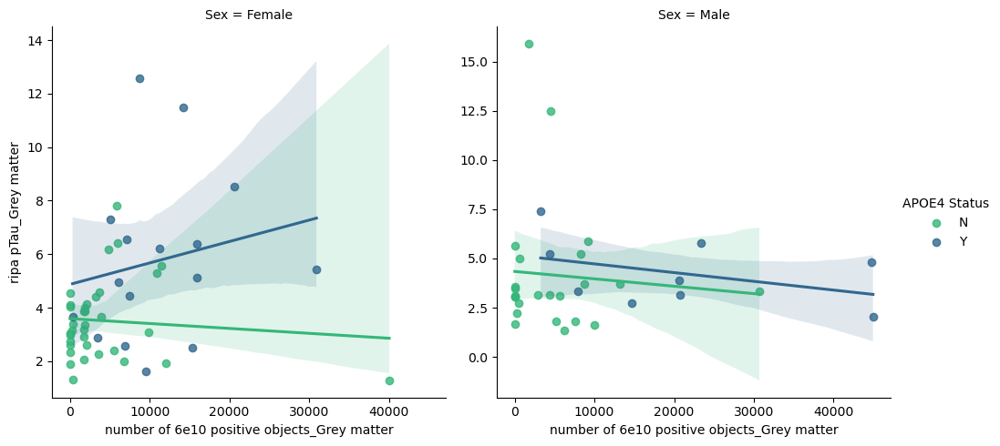

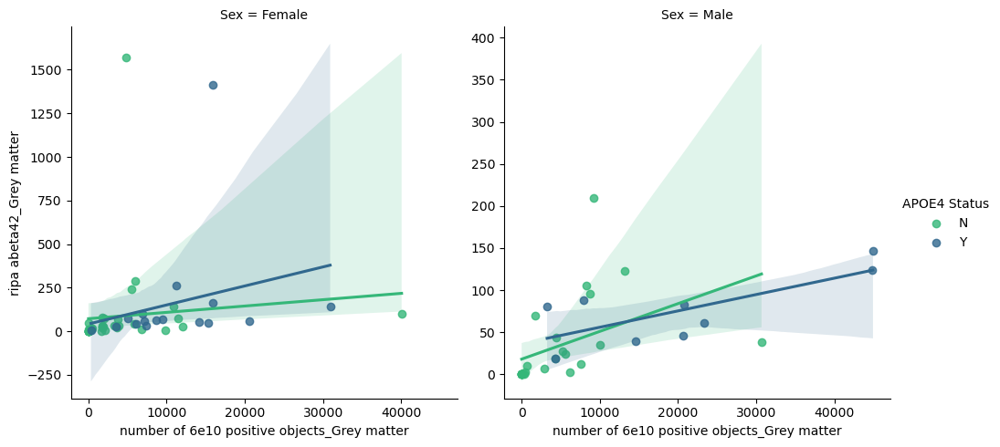

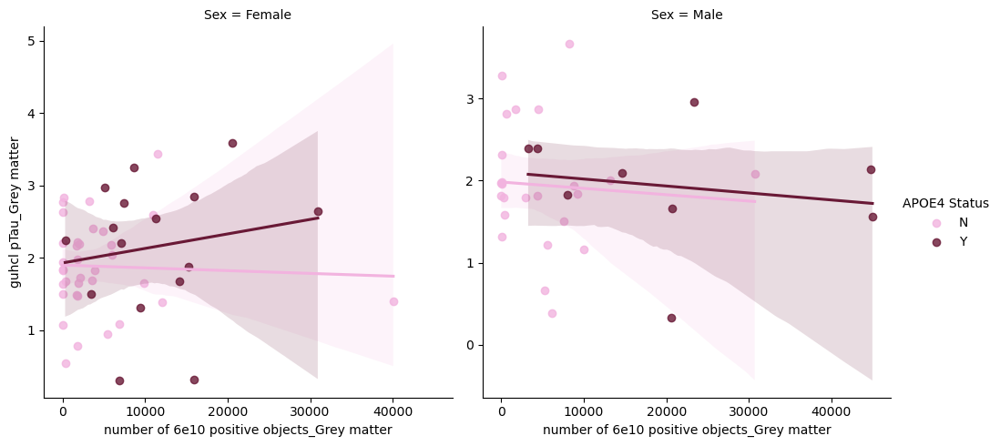

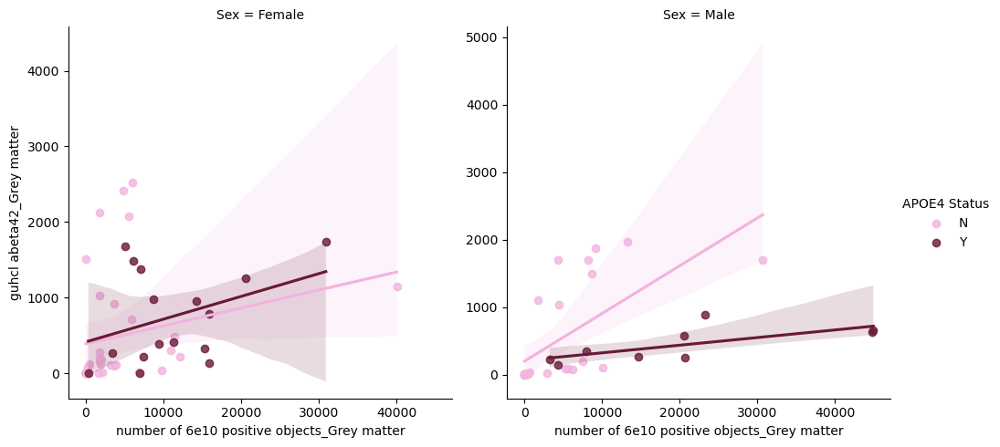

In [32]:
#Regression of 6E10 numbers's association with the phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl), Sex and apoE4 status was considered

#define Variables 
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]

facet_kws = {'sharey': False}  # Set shared y-axis to False
for var in variables:
    if 'ripa' in var:
        #Female and Male groups & apoE4 negative and positive groups are compared
        #y_label is not shared
        sns.lmplot(x='number of 6e10 positive objects_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette='viridis_r')
    else:
        sns.lmplot(x='number of 6e10 positive objects_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette=['#f2b3df','#691936'])

In [33]:
#Female group: Pearson's R correlation and p-value 
#6E10 number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Female_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(female_n[var], female_n['6e10_GMnumber']) #used 6e10_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Female_apoE4 Negative group to run the analysis of pearson R for Female_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(female_y[var], female_y['6e10_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.089591  0.608785
ripa abeta42_Grey matter    0.097872  0.575932
guhcl pTau_Grey matter     -0.043842  0.802533
guhcl abeta42_Grey matter   0.225570  0.192611
                           Pearson r   p-value
ripa pTau_Grey matter       0.194144  0.471228
ripa abeta42_Grey matter    0.241707  0.367121
guhcl pTau_Grey matter      0.158993  0.556434
guhcl abeta42_Grey matter   0.371302  0.156790


In [34]:
#Male group: Pearson's R correlation and p-value 
#6E10 number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Male_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(male_n[var], male_n['6e10_GMnumber']) #used 6e10_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Male_apoE4 Negative group to run the analysis of pearson R for Male_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(male_y[var], male_y['6e10_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.075541  0.725723
ripa abeta42_Grey matter    0.428841  0.036530
guhcl pTau_Grey matter     -0.068494  0.750476
guhcl abeta42_Grey matter   0.628070  0.001016
                           Pearson r   p-value
ripa pTau_Grey matter      -0.407922  0.275767
ripa abeta42_Grey matter    0.741852  0.022118
guhcl pTau_Grey matter     -0.179662  0.643698
guhcl abeta42_Grey matter   0.692411  0.038716


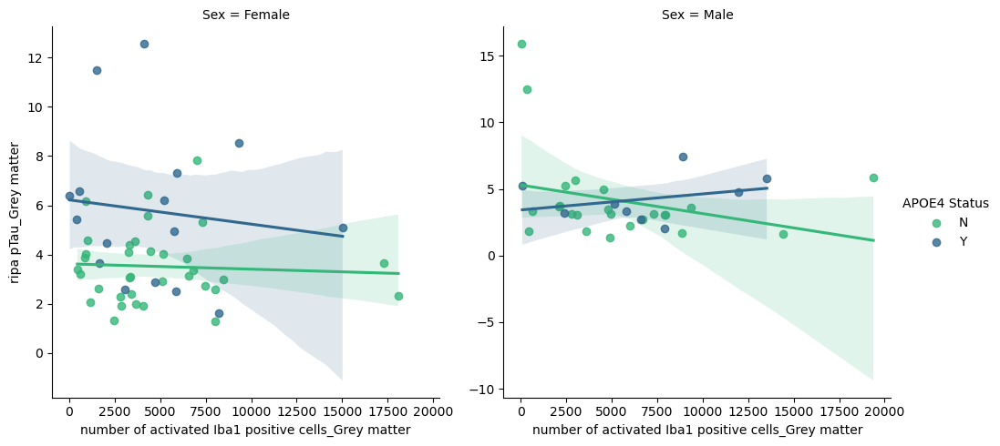

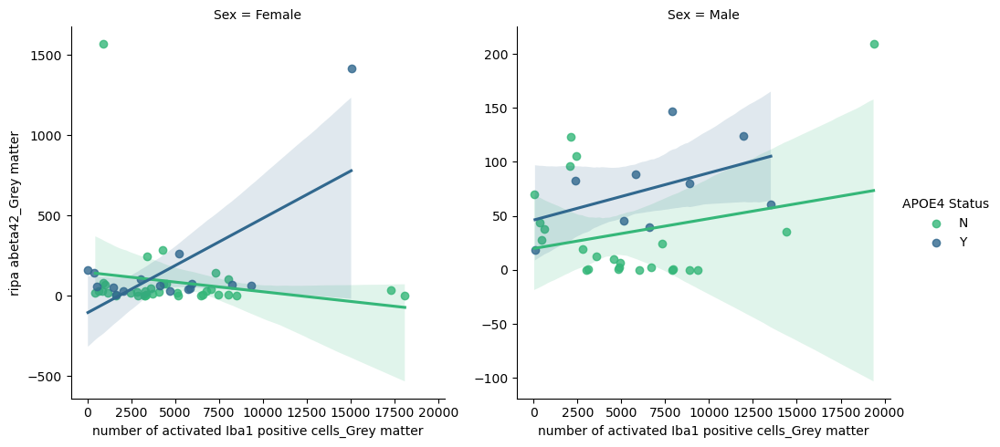

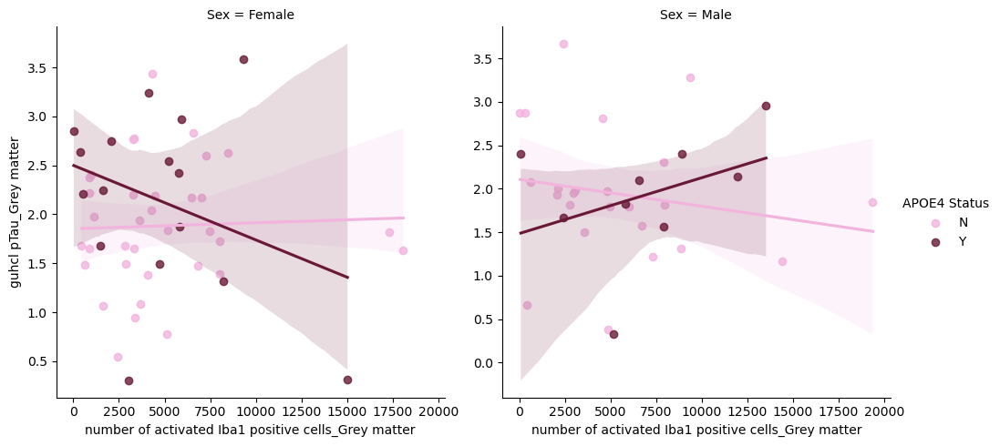

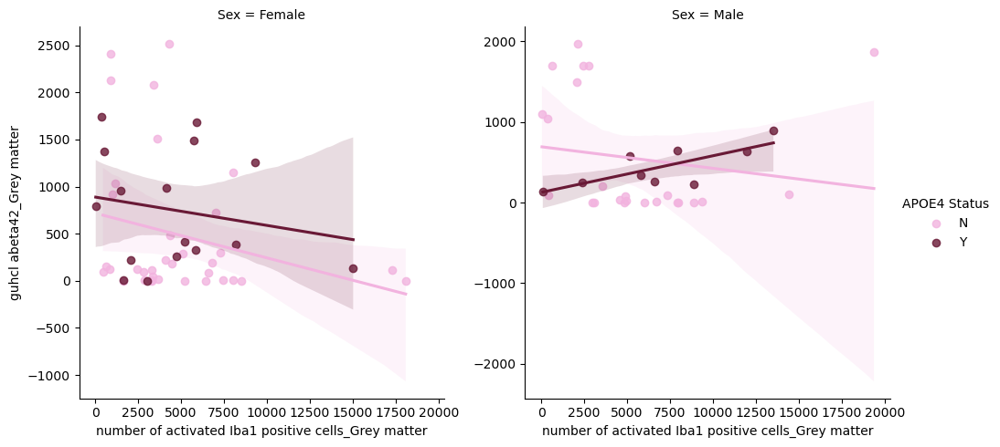

In [35]:
#Regression of Iba1 activated numbers's association with the phosphorylated Tau level and amyloid-beta 42 levels, Sex and apoE4 status was considered

#Pearson's correlation is also performed

#define Variables 
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]

facet_kws = {'sharey': False}  # Set shared y-axis to False
for var in variables:
    if 'ripa' in var:
        #Female and Male groups & apoE4 negative and positive groups are compared
        #y_label is not shared
        sns.lmplot(x='number of activated Iba1 positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette='viridis_r')
    else:
        sns.lmplot(x='number of activated Iba1 positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette=['#f2b3df','#691936'])

In [36]:
#Female group: Pearson's R correlation and p-value 
#Iba1 activated number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Female_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(female_n[var], female_n['iba1_GMnumber']) #used iba1_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Female_apoE4 Negative group to run the analysis of pearson R for Female_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(female_y[var], female_y['iba1_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.059053  0.736139
ripa abeta42_Grey matter   -0.181442  0.296887
guhcl pTau_Grey matter      0.038756  0.825061
guhcl abeta42_Grey matter  -0.252097  0.144022
                           Pearson r   p-value
ripa pTau_Grey matter      -0.125071  0.644423
ripa abeta42_Grey matter    0.682627  0.003569
guhcl pTau_Grey matter     -0.316146  0.232906
guhcl abeta42_Grey matter  -0.194371  0.470699


In [37]:
#Male group: Pearson's R correlation and p-value 
#Iba1 activated number's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Male_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(male_n[var], male_n['iba1_GMnumber']) #used iba1_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Male_apoE4 Negative group to run the analysis of pearson R for Male_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(male_y[var], male_y['iba1_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.290524  0.168447
ripa abeta42_Grey matter    0.242600  0.253365
guhcl pTau_Grey matter     -0.184212  0.388861
guhcl abeta42_Grey matter  -0.159792  0.455763
                           Pearson r   p-value
ripa pTau_Grey matter       0.302454  0.428905
ripa abeta42_Grey matter    0.456564  0.216692
guhcl pTau_Grey matter      0.370662  0.326090
guhcl abeta42_Grey matter   0.759899  0.017496


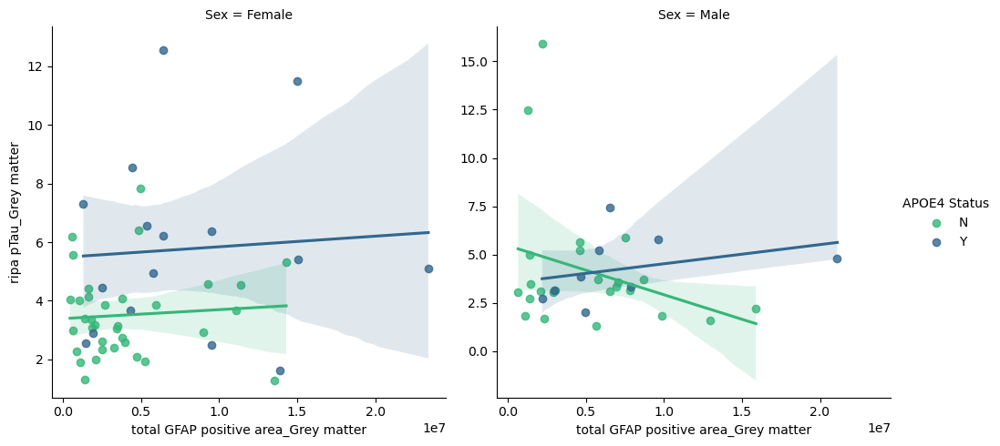

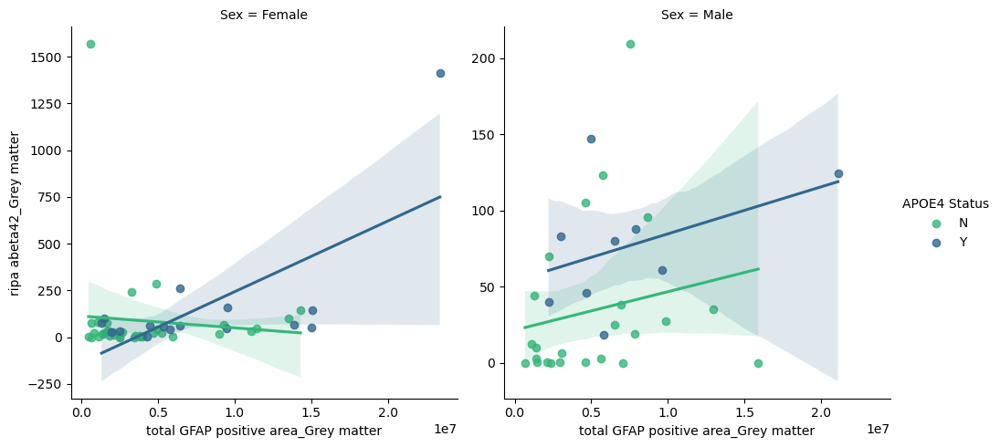

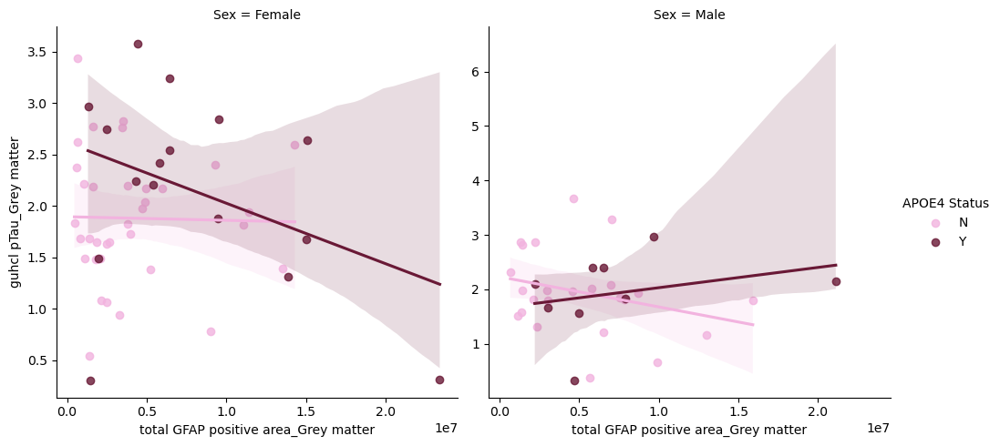

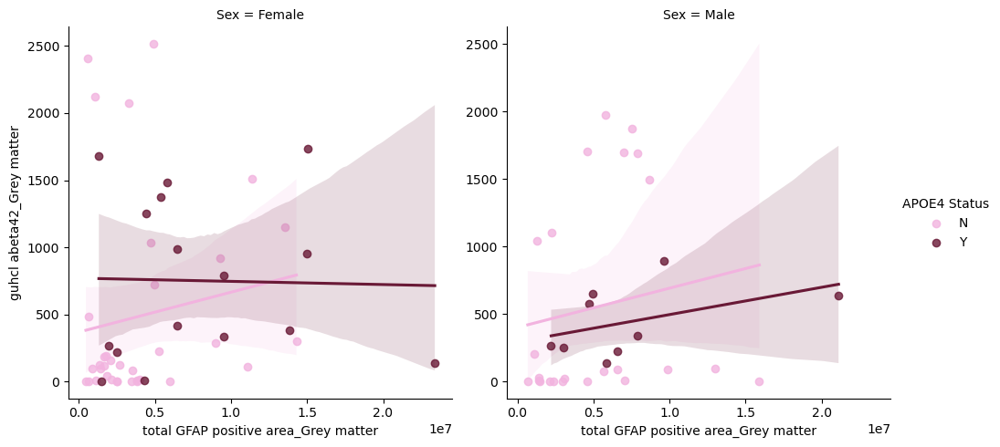

In [38]:
#Regression of GFAP positive area's association with the phosphorylated Tau level and amyloid-beta 42 levels, Sex and apoE4 status was considered

#Pearson's correlation is also performed

#define Variables 
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]

facet_kws = {'sharey': False}  # Set shared y-axis to False
for var in variables:
    if 'ripa' in var:
        #Female and Male groups & apoE4 negative and positive groups are compared
        #y_label is not shared
        sns.lmplot(x='total GFAP positive area_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette='viridis_r')
    else:
        sns.lmplot(x='total GFAP positive area_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette=['#f2b3df','#691936'])

In [39]:
#Female group: Pearson's R correlation and p-value 
#GFAP total positive area's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Female_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(female_n[var], female_n['GFAP_GMnumber']) #used GFAP_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Female_apoE4 Negative group to run the analysis of pearson R for Female_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(female_y[var], female_y['GFAP_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter       0.078673  0.653265
ripa abeta42_Grey matter   -0.089324  0.609857
guhcl pTau_Grey matter     -0.021012  0.904634
guhcl abeta42_Grey matter   0.149171  0.392408
                           Pearson r   p-value
ripa pTau_Grey matter       0.072155  0.790584
ripa abeta42_Grey matter    0.688479  0.003189
guhcl pTau_Grey matter     -0.383751  0.142277
guhcl abeta42_Grey matter  -0.024123  0.929338


In [40]:
#Male group: Pearson's R correlation and p-value 
#GFAP total positive area's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Male_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(male_n[var], male_n['GFAP_GMnumber']) #used GFAP_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Male_apoE4 Negative group to run the analysis of pearson R for Male_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(male_y[var], male_y['GFAP_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.299733  0.154748
ripa abeta42_Grey matter    0.192137  0.368414
guhcl pTau_Grey matter     -0.287956  0.172414
guhcl abeta42_Grey matter   0.151599  0.479483
                           Pearson r   p-value
ripa pTau_Grey matter       0.331191  0.383971
ripa abeta42_Grey matter    0.426928  0.251777
guhcl pTau_Grey matter      0.284971  0.457327
guhcl abeta42_Grey matter   0.448870  0.225525


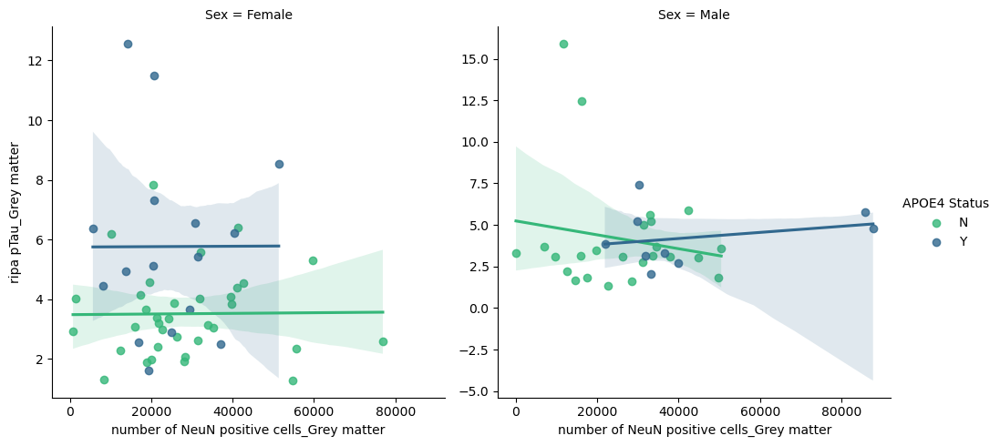

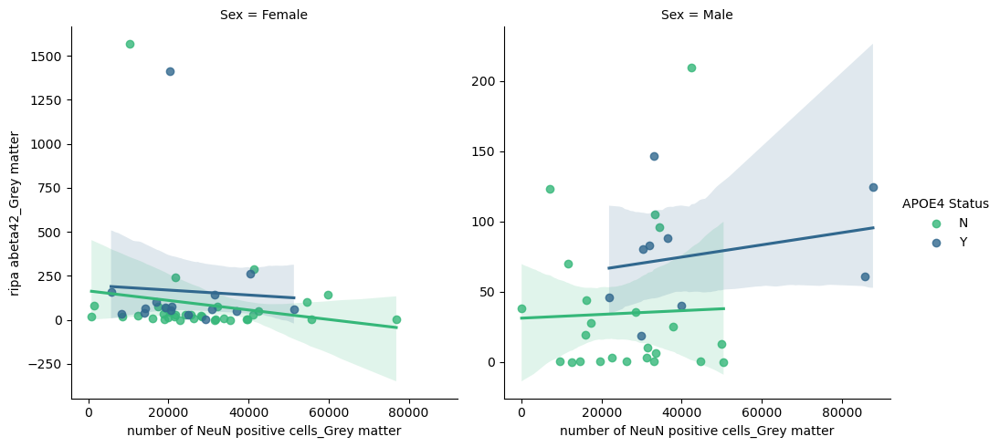

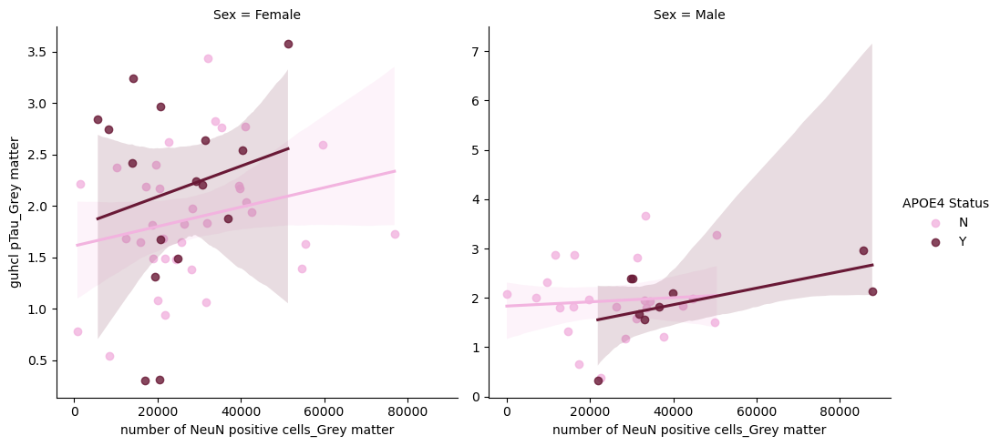

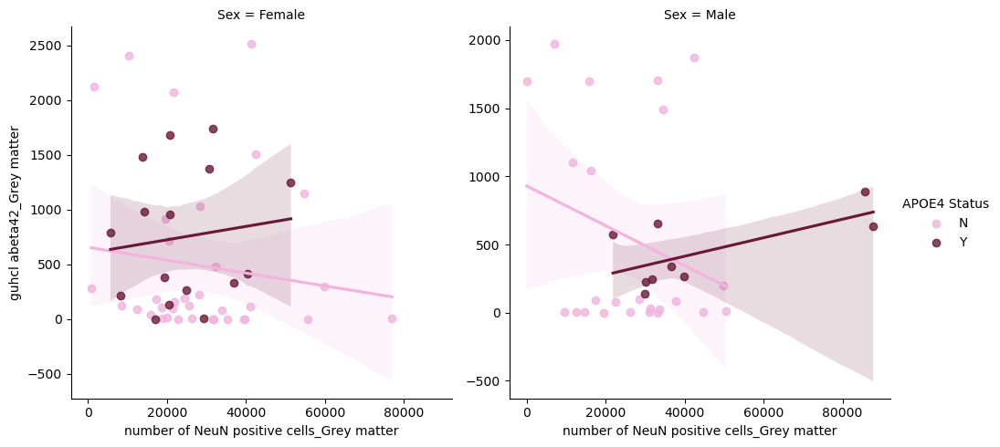

In [41]:
#Regression of NeuN's association with the phosphorylated Tau level and amyloid-beta 42 levels, Sex and apoE4 status was considered

#Pearson's correlation is also performed

#define Variables 
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]

facet_kws = {'sharey': False}  # Set shared y-axis to False
for var in variables:
    if 'ripa' in var:
        #Female and Male groups & apoE4 negative and positive groups are compared
        #y_label is not shared
        sns.lmplot(x='number of NeuN positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette='viridis_r')
    else:
        sns.lmplot(x='number of NeuN positive cells_Grey matter', y=var, data=donor_combined,col='Sex',facet_kws=facet_kws,
               hue='APOE4 Status', aspect=1,height=5,palette=['#f2b3df','#691936'])

In [42]:
#Female group: Pearson's R correlation and p-value 
#NeuN's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Female_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(female_n[var], female_n['Neun_GMnumber']) #used Neun_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Female_apoE4 Negative group to run the analysis of pearson R for Female_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(female_y[var], female_y['Neun_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter       0.011903  0.945895
ripa abeta42_Grey matter   -0.165526  0.341972
guhcl pTau_Grey matter      0.244603  0.156731
guhcl abeta42_Grey matter  -0.127333  0.466044
                           Pearson r   p-value
ripa pTau_Grey matter       0.002590  0.992404
ripa abeta42_Grey matter   -0.050265  0.853333
guhcl pTau_Grey matter      0.190912  0.478785
guhcl abeta42_Grey matter   0.121947  0.652779


In [43]:
#Male group: Pearson's R correlation and p-value 
#NeuN's correlation between phosphorylated Tau level and amyloid-beta 42 levels (in both Ripa and Guhcl)
variables=['ripa pTau_Grey matter','ripa abeta42_Grey matter','guhcl pTau_Grey matter','guhcl abeta42_Grey matter' ]
# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Pearson's correlation with ptau, and abeta42 in ripa and guhcl
#Run analysis of Pearson R for Male_apoE4 Negative group 
for var in variables:
    correlation, p_value = pearsonr(male_n[var], male_n['Neun_GMnumber']) #used Neun_GMnumber for short in naming in excel
    results[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)



#Repeart the same step for Male_apoE4 Negative group to run the analysis of pearson R for Male_apoE4 Positive Group
# Create an another dictionary to store the results
results2 = {}
for var in variables:
    correlation, p_value = pearsonr(male_y[var], male_y['Neun_GMnumber']) 
    results2[var] = {'Pearson r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results2_df = pd.DataFrame(results2).T

# Display the results
print(results2_df)

                           Pearson r   p-value
ripa pTau_Grey matter      -0.170944  0.424494
ripa abeta42_Grey matter    0.035325  0.869836
guhcl pTau_Grey matter      0.076831  0.721219
guhcl abeta42_Grey matter  -0.263193  0.214017
                           Pearson r   p-value
ripa pTau_Grey matter       0.267212  0.486999
ripa abeta42_Grey matter    0.263183  0.493839
guhcl pTau_Grey matter      0.562017  0.115265
guhcl abeta42_Grey matter   0.657649  0.054209


In [44]:
#Bar graph to represent 2 Way ANOVA Analysis

In [45]:
#AT8 number 

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\520204961.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='at8_GMnumber', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\520204961.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='at8_GMnumber', hue ='Cognitive Status',


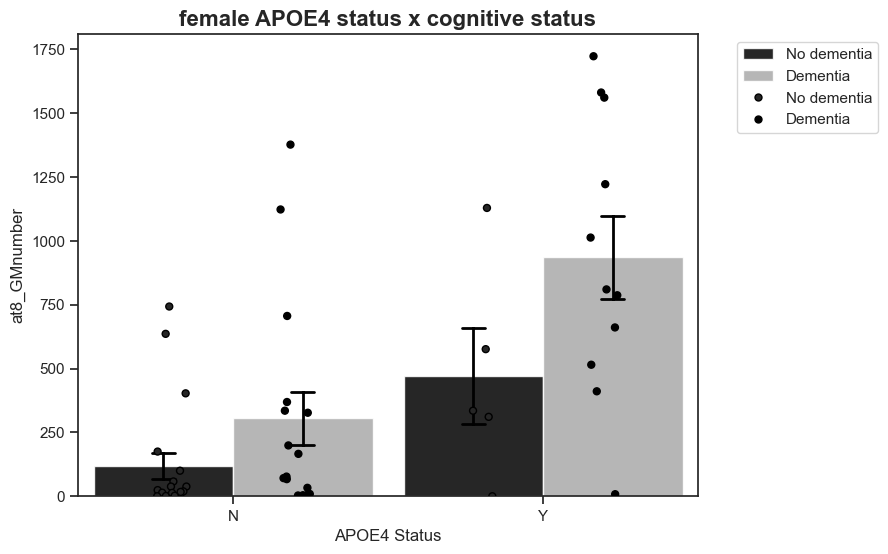

In [46]:
#Female Group
#AT8 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='at8_GMnumber', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='at8_GMnumber', hue ='Cognitive Status',
              data=female, dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4239134474.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='at8_GMnumber', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4239134474.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='at8_GMnumber', hue ='Cognitive Status',data=male,


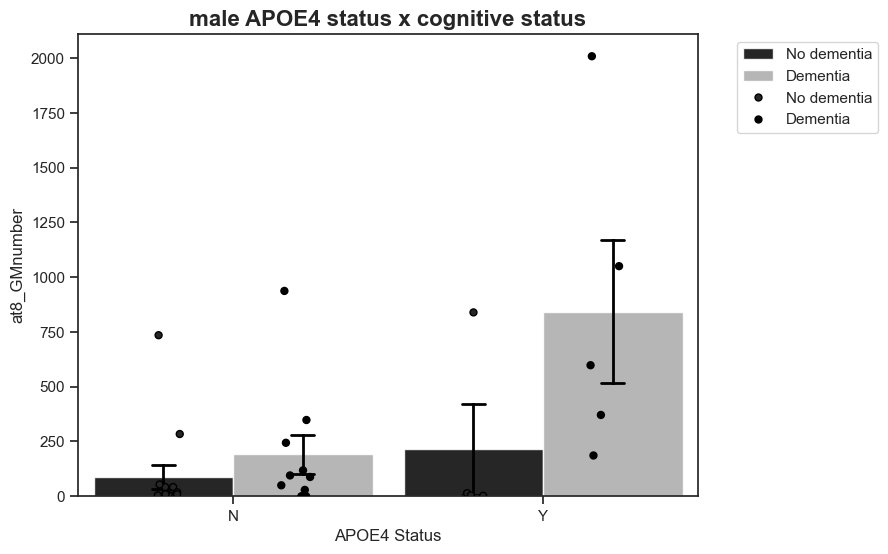

In [47]:
#Male Group
#AT8 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='at8_GMnumber', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='at8_GMnumber', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [48]:
#6e10 Number

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2839345065.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='6e10_GMnumber', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2839345065.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='6e10_GMnumber', hue ='Cognitive Status',data=female,


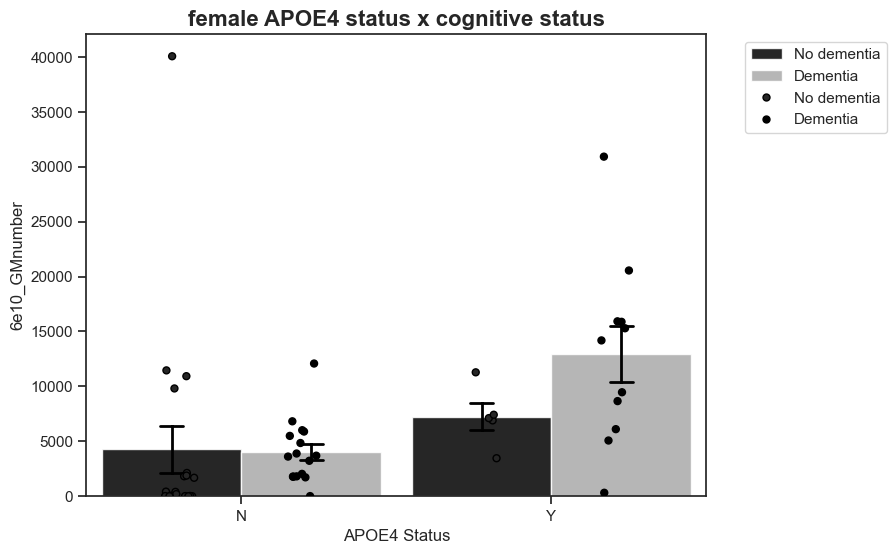

In [49]:
#Female Group
#6e10 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='6e10_GMnumber', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='6e10_GMnumber', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2048747116.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='6e10_GMnumber', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2048747116.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='6e10_GMnumber', hue ='Cognitive Status',data=male,


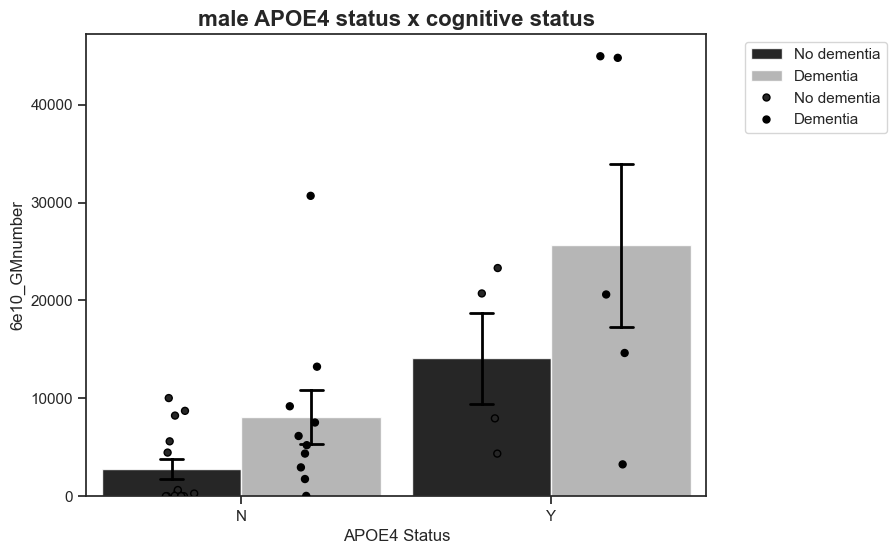

In [50]:
#Male Group
#6e10 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='6e10_GMnumber', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='6e10_GMnumber', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [51]:
#Iba1 activated number

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2586218713.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='iba1_GMnumber', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2586218713.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='iba1_GMnumber', hue ='Cognitive Status',data=female,


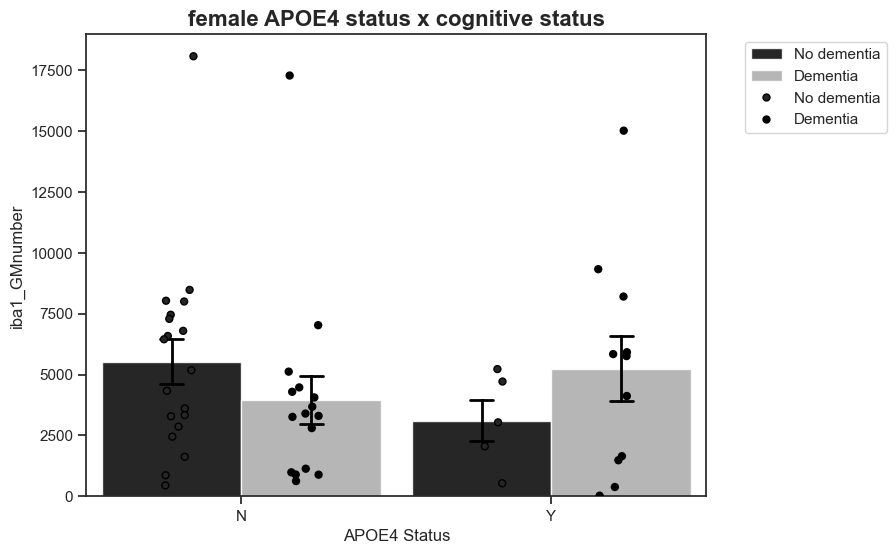

In [52]:
#Female Group
#Iba1 activated aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='iba1_GMnumber', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='iba1_GMnumber', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1656579106.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='iba1_GMnumber', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1656579106.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='iba1_GMnumber', hue ='Cognitive Status',data=male,


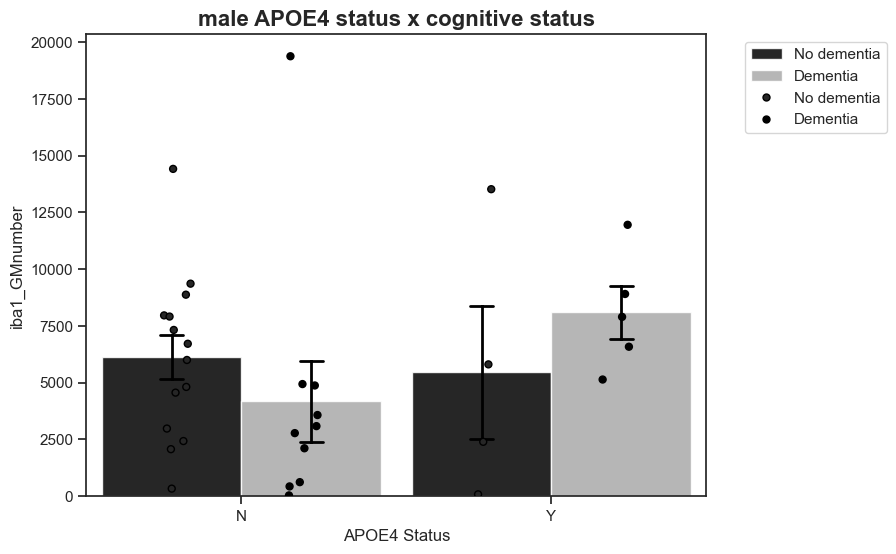

In [53]:
#Male Group
#Iba1 activated aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='iba1_GMnumber', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='iba1_GMnumber', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [54]:
#GFAP Total Area

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\888211007.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='GFAP_GMnumber', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\888211007.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='GFAP_GMnumber', hue ='Cognitive Status',data=female,


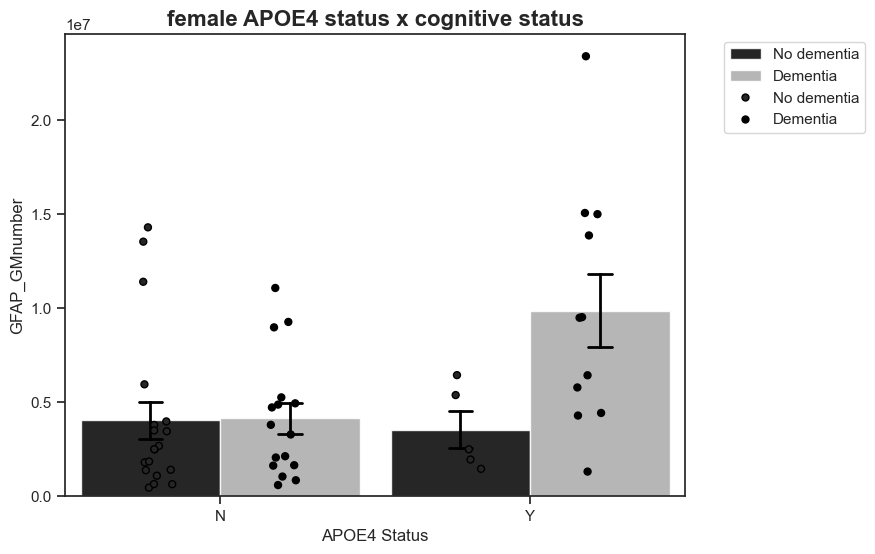

In [55]:
#Female Group
#GFAP total area aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='GFAP_GMnumber', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='GFAP_GMnumber', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\99763777.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='GFAP_GMnumber', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\99763777.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='GFAP_GMnumber', hue ='Cognitive Status',data=male,


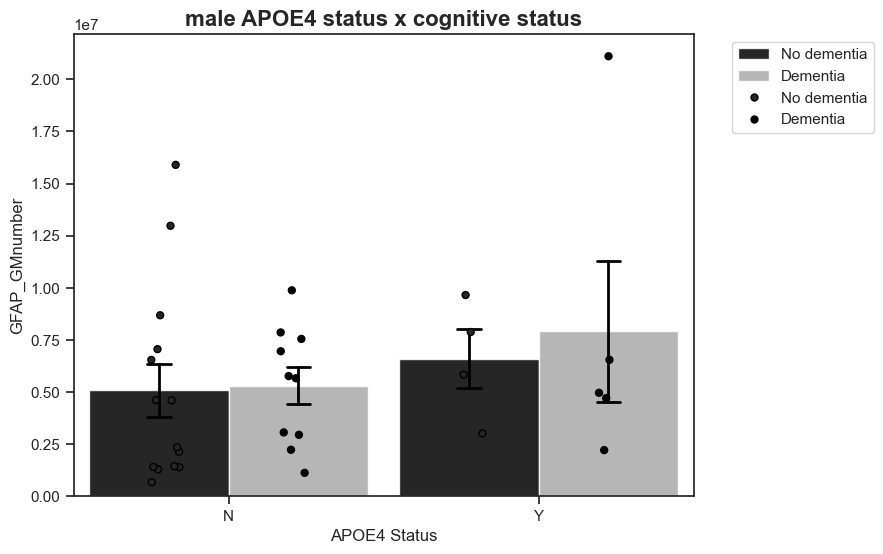

In [56]:
#Male Group
#GFAP total area aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='GFAP_GMnumber', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='GFAP_GMnumber', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [57]:
#NeuN 

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\777510230.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='Neun_GMnumber', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\777510230.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='Neun_GMnumber', hue ='Cognitive Status',data=female,


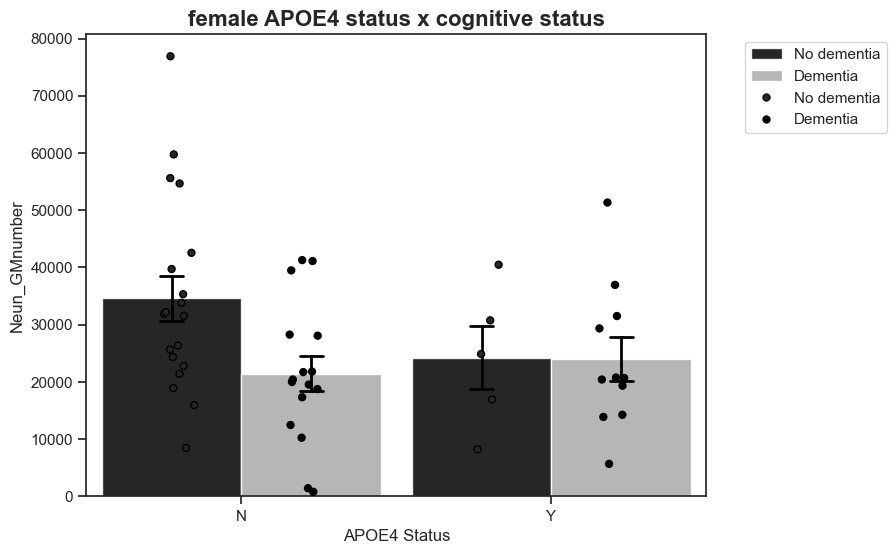

In [58]:
#Female Group
#NeuN aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='Neun_GMnumber', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='Neun_GMnumber', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\576656795.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='Neun_GMnumber', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\576656795.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='Neun_GMnumber', hue ='Cognitive Status',data=male,


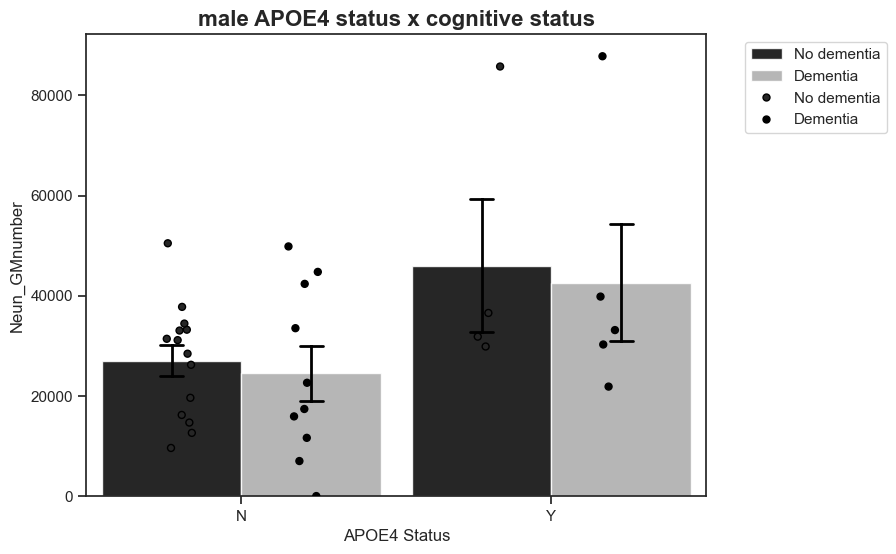

In [59]:
#Male Group
#NeuN aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='Neun_GMnumber', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='Neun_GMnumber', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [60]:
#ripa-pTau

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\3190842521.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='ripa pTau_Grey matter', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\3190842521.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='ripa pTau_Grey matter', hue ='Cognitive Status',data=female,


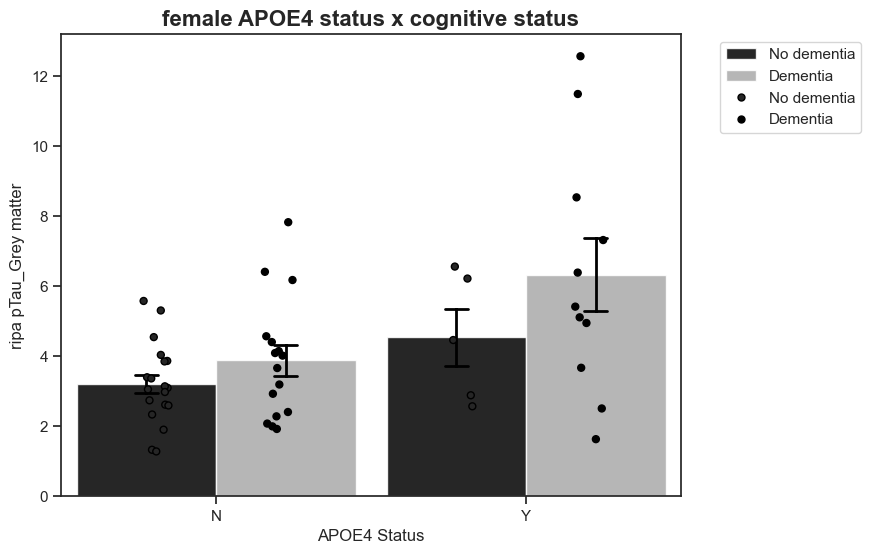

In [61]:
#Female Group
#ripa-pTau aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='ripa pTau_Grey matter', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='ripa pTau_Grey matter', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2513386377.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='ripa pTau_Grey matter', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2513386377.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='ripa pTau_Grey matter', hue ='Cognitive Status',data=male,


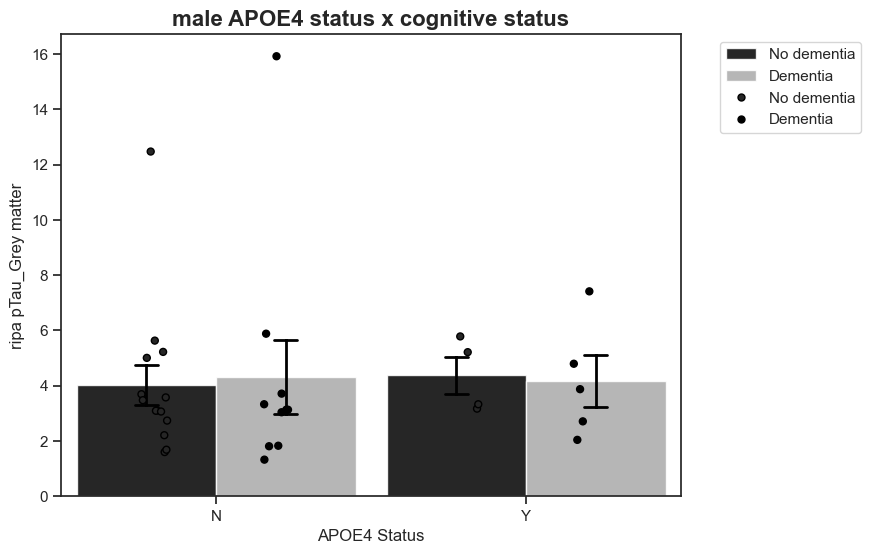

In [62]:
#Male Group
#ripa-pTau aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='ripa pTau_Grey matter', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='ripa pTau_Grey matter', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [63]:
#guhcl-pTau

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\613468263.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='guhcl pTau_Grey matter', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\613468263.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='guhcl pTau_Grey matter', hue ='Cognitive Status',data=female,


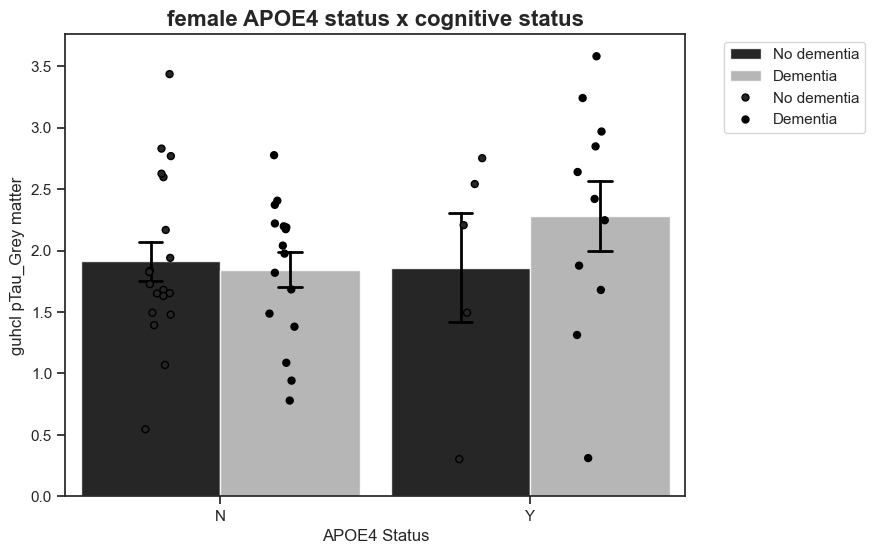

In [64]:
#Female Group
#guhcl-pTau aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='guhcl pTau_Grey matter', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='guhcl pTau_Grey matter', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1059117343.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='guhcl pTau_Grey matter', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1059117343.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='guhcl pTau_Grey matter', hue ='Cognitive Status',data=male,


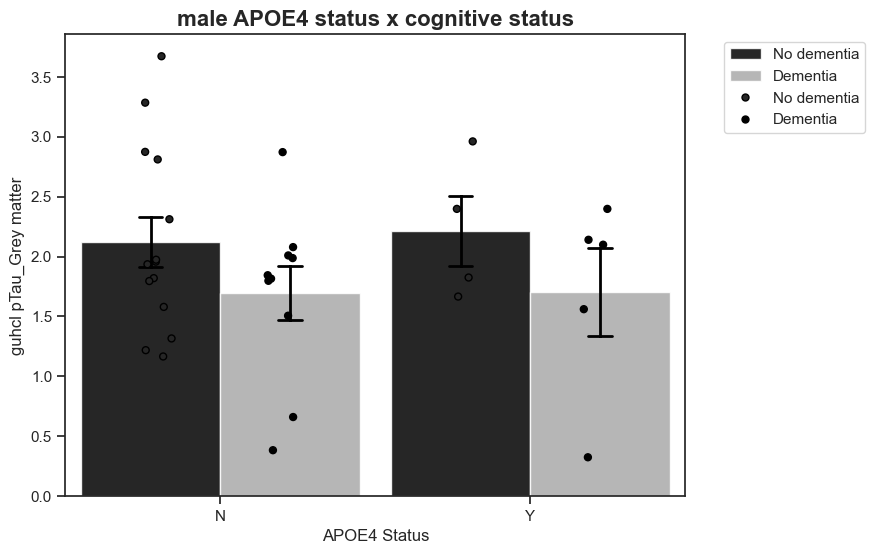

In [65]:
#Male Group
#guhcl-pTau aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='guhcl pTau_Grey matter', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='guhcl pTau_Grey matter', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [66]:
#ripa-abeta42

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2857481950.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='ripa abeta42_Grey matter', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\2857481950.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='ripa abeta42_Grey matter', hue ='Cognitive Status',data=female,


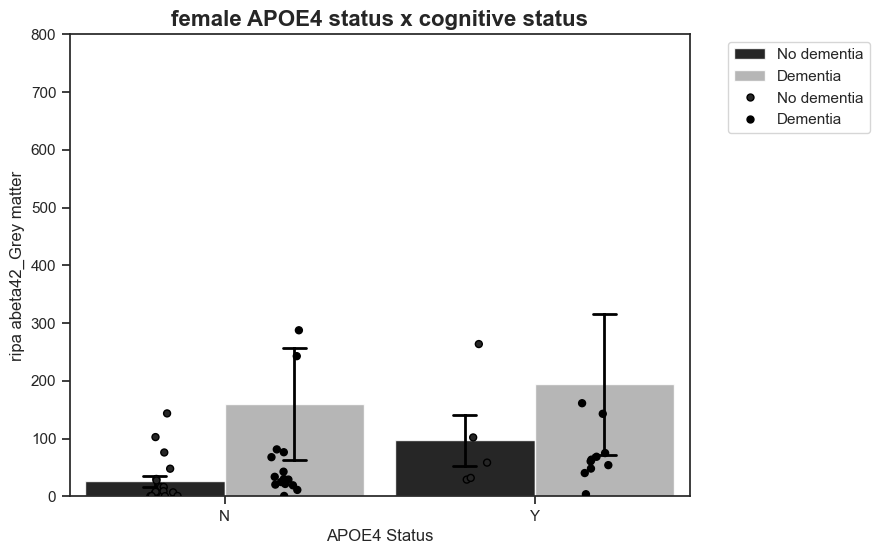

In [67]:
#Female Group
#ripa-abeta42 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='ripa abeta42_Grey matter', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='ripa abeta42_Grey matter', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)
plt.ylim(0,800) #set y axis to have a better visualization on each categories
plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4065227389.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='ripa abeta42_Grey matter', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4065227389.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='ripa abeta42_Grey matter', hue ='Cognitive Status',data=male,


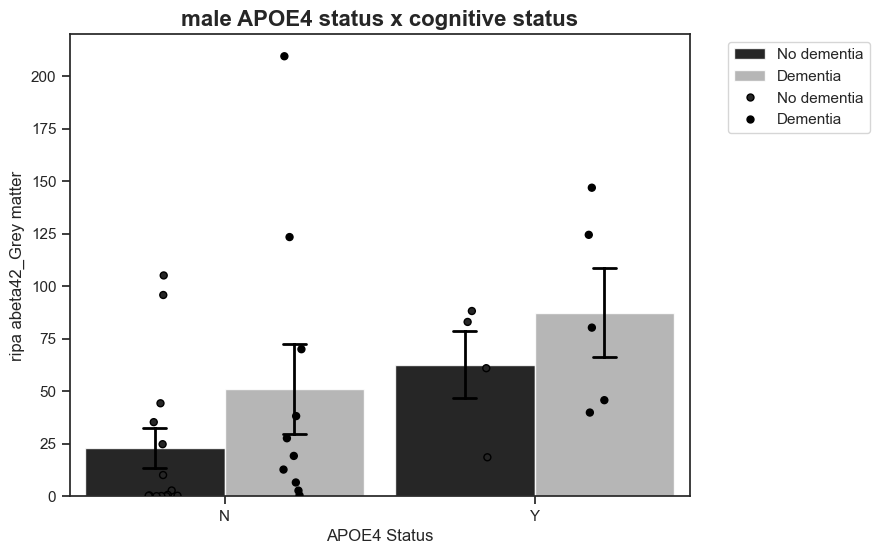

In [68]:
#Male Group
#ripa-abeta42 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='ripa abeta42_Grey matter', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='ripa abeta42_Grey matter', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [69]:
#guhcl-abeta42

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4026332050.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', data=female, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\4026332050.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', hue ='Cognitive Status',data=female,


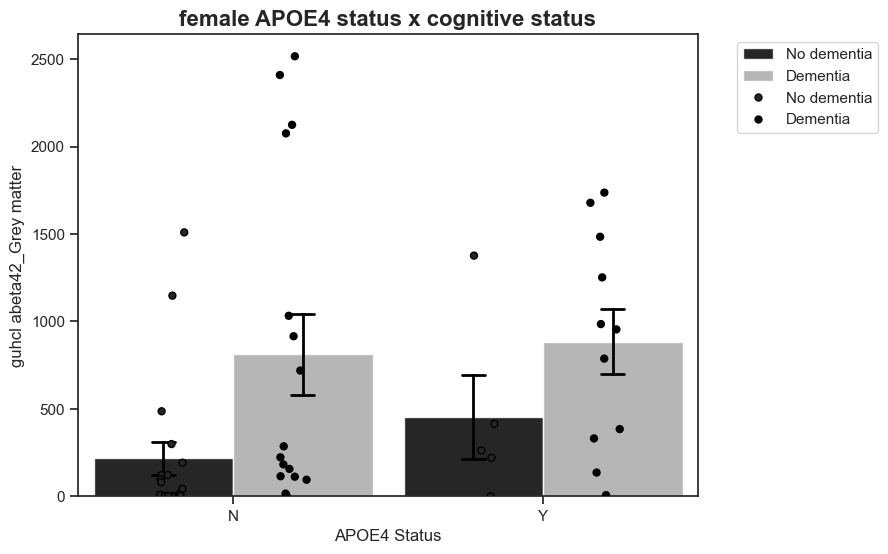

In [70]:
#Female Group
#guhcl-abeta42 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', data=female, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', hue ='Cognitive Status',data=female, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('female APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1525905296.py:7: FutureWarning: 

The `errwidth` parameter is deprecated. And will be removed in v0.15.0. Pass `err_kws={'linewidth': 2}` instead.

  sns.barplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', data=male, hue= 'Cognitive Status',
C:\Users\GGTHELEGEND\AppData\Local\Temp\ipykernel_41396\1525905296.py:11: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:#000000'` for the same effect.

  sns.stripplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', hue ='Cognitive Status',data=male,


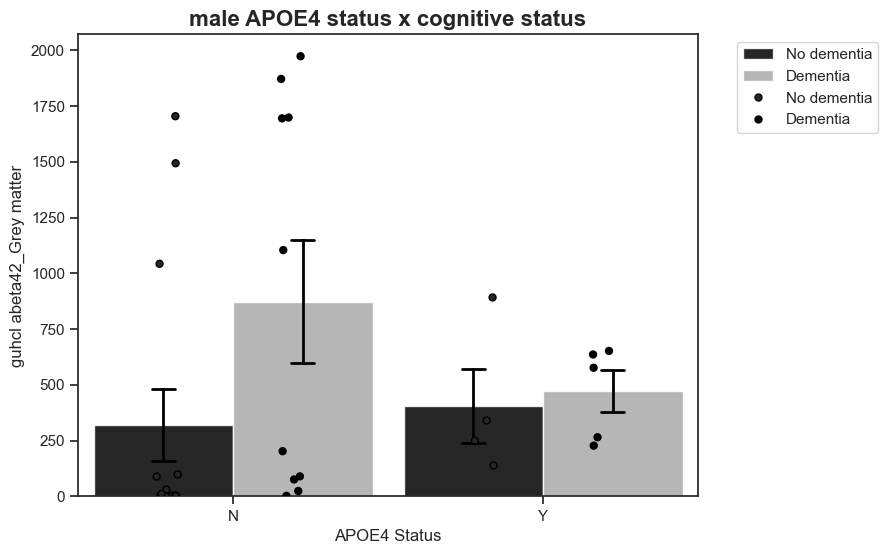

In [71]:
#Male Group
#guhcl-abeta42 aggregation influenced by the effect of apoE4 and Dementia status is examined
plt.figure(figsize=(8, 6))
sns.set(style="ticks") 

#Bar plot to compare the central tendency of this dataset across the two independent variables (apoE4 and Dementia status).
sns.barplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', data=male, hue= 'Cognitive Status', 
            errorbar='se', palette=['#000000', '#A9A9A9'],  alpha=0.85,capsize=0.15,errwidth=2,err_kws={'color': 'black'},
            width=0.9)
#Scatter plot added on the bar plot to reveal individual differences across these variables to showcase the distribution of the dataset
sns.stripplot(x='APOE4 Status', y='guhcl abeta42_Grey matter', hue ='Cognitive Status',data=male, 
              dodge=True, color='#000000', linewidth=1, jitter=True)

plt.title('male APOE4 status x cognitive status', fontsize=16, weight='bold')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')

In [72]:
#2 Way ANOVA analysis: ApoE4 Status(Negative/Positive) and Cognitive Status(No dementia/ Dementia) with the antibodies and biomarkers
#Each 2 Way ANOVA is under either Female or Male category
#Tukey's HSD post-hoc used for follow up. 

#rename dataset so it can fit the analysis model
female.rename(columns={'APOE4 Status': 'APOE4_Status', 'Cognitive Status': 'Cognitive_Status'}, inplace=True)
male.rename(columns={'APOE4 Status': 'APOE4_Status', 'Cognitive Status': 'Cognitive_Status'}, inplace=True)

#create dataset column for interaction effect of apoE4 and dementia status
female['apoe4_cog']= female['APOE4_Status'] + "_" + female['Cognitive_Status']
male['apoe4_cog']= male['APOE4_Status'] + "_" + male['Cognitive_Status']



In [73]:
#AT8 2 Way-ANOVA Analysis & Tukey's HSD post-hoc

In [74]:
#Female Group---AT8 Numberse

#Run 2 WAY ANOVA
model =ols('at8_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:AT8")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['at8_GMnumber'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['at8_GMnumber'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['at8_GMnumber'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:AT8
                                           sum_sq    df          F    PR(>F)
C(APOE4_Status)                      2.886958e+06   1.0  18.961672  0.000072
C(Cognitive_Status)                  8.452309e+05   1.0   5.551515  0.022686
C(APOE4_Status):C(Cognitive_Status)  1.945962e+05   1.0   1.278117  0.263986
Residual                             7.155858e+06  47.0        NaN       NaN

Tukey's HSD for APOE4_Status:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
     N      Y 585.7589   0.0 337.7371 833.7808   True
-----------------------------------------------------
Tukey's HSD for Cognitive Status:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1     group2    meandiff p-adj   lower     upper   reject
---------------------------------------------------------------
Dementia No dementia -368.5463 0.006 -626.2371 -110.8555   True
------

In [75]:
#Male Group---AT8 Number

#Run 2 WAY ANOVA
model =ols('at8_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:AT8")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['at8_GMnumber'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['at8_GMnumber'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['at8_GMnumber'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:AT8
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.024898e+06   1.0  7.651208  0.009769
C(Cognitive_Status)                  4.974073e+05   1.0  3.713311  0.063829
C(APOE4_Status):C(Cognitive_Status)  4.416417e+05   1.0  3.297003  0.079760
Residual                             3.884622e+06  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj   lower    upper  reject
-----------------------------------------------------
     N      Y 433.3056 0.0085 118.8461 747.765   True
-----------------------------------------------------
Tukey's HSD for Cognitive Status:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
 group1     group2   meandiff p-adj    lower   upper  reject
------------------------------------------------------------
Dementia No dementia   -292.8 0.0526 -589.0408 3.4408  False
-----------------------

In [76]:
#6e10 2 Way-ANOVA Analysis & Tukey's HSD post-hoc

In [77]:
#rename 6e10 column name due to restriction of the 2 way anova analysis model

female['num_6e10']=female['6e10_GMnumber']
male['num_6e10']=male['6e10_GMnumber']

In [78]:
#Female Group---6e10 Number

#Run 2 WAY ANOVA
model =ols('num_6e10 ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:6e10")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['num_6e10'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['num_6e10'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['num_6e10'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:6e10
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      4.649950e+08   1.0  8.809859  0.004702
C(Cognitive_Status)                  2.601656e+07   1.0  0.492913  0.486093
C(APOE4_Status):C(Cognitive_Status)  8.635759e+07   1.0  1.636143  0.207135
Residual                             2.480717e+09  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff p-adj    lower     upper    reject
----------------------------------------------------------
     N      Y 6999.5196 0.0025 2587.8174 11411.2219   True
----------------------------------------------------------
Tukey's HSD for Cognitive Status:
       Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1     group2    meandiff  p-adj    lower      upper   reject
------------------------------------------------------------------
Dementia No dementia -2791.1713 0.2119 -

In [79]:
#Male Group---6e10 Number

#Run 2 WAY ANOVA
model =ols('num_6e10 ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:6e10")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['num_6e10'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['num_6e10'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['num_6e10'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)



ANOVA Results:6e10
                                           sum_sq    df          F    PR(>F)
C(APOE4_Status)                      1.363096e+09   1.0  15.590895  0.000460
C(Cognitive_Status)                  4.028416e+08   1.0   4.607643  0.040326
C(APOE4_Status):C(Cognitive_Status)  6.190480e+07   1.0   0.708058  0.406975
Residual                             2.535440e+09  29.0        NaN       NaN

Tukey's HSD for APOE4_Status:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj    lower     upper    reject
-----------------------------------------------------------
     N      Y 15525.7222 0.0003 7683.3046 23368.1398   True
-----------------------------------------------------------
Tukey's HSD for Cognitive Status:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
 group1     group2    meandiff  p-adj     lower      upper   reject
-------------------------------------------------------------------
Dementia No dementia -8687.

In [80]:
#Iba1 2 Way-ANOVA Analysis & Tukey's HSD post-hoc

In [81]:
#Female Group---Iba1 Number

#Run 2 WAY ANOVA
model =ols('iba1_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:Iba1")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['iba1_GMnumber'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['iba1_GMnumber'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['iba1_GMnumber'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:Iba1
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.234773e+05   1.0  0.007861  0.929725
C(Cognitive_Status)                  3.389713e+06   1.0  0.215813  0.644394
C(APOE4_Status):C(Cognitive_Status)  3.405502e+07   1.0  2.168179  0.147558
Residual                             7.382165e+08  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff p-adj    lower      upper   reject
----------------------------------------------------------
     N      Y -230.3696 0.8486 -2643.2364 2182.4972  False
----------------------------------------------------------
Tukey's HSD for Cognitive Status:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1     group2   meandiff p-adj    lower      upper   reject
----------------------------------------------------------------
Dementia No dementia 550.3889 0.6234 -1687.938

In [82]:
#Male Group---Iba1 Number

#Run 2 WAY ANOVA
model =ols('iba1_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:Iba1")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['iba1_GMnumber'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['iba1_GMnumber'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['iba1_GMnumber'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:Iba1
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.858669e+07   1.0  0.919261  0.345595
C(Cognitive_Status)                  3.690854e+06   1.0  0.182542  0.672353
C(APOE4_Status):C(Cognitive_Status)  3.384647e+07   1.0  1.673980  0.205936
Residual                             5.863555e+08  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff p-adj    lower      upper   reject
----------------------------------------------------------
     N      Y 1604.2639 0.3673 -1972.0105 5180.5383  False
----------------------------------------------------------
Tukey's HSD for Cognitive Status:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1     group2   meandiff p-adj    lower      upper   reject
----------------------------------------------------------------
Dementia No dementia 488.1889 0.7604 -2748.488

In [83]:
#GFAP 2 Way-ANOVA Analysis & Tukey's HSD post-hoc

In [84]:
#Female Group---GFAP Number

#Run 2 WAY ANOVA
model =ols('GFAP_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:GFAP")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['GFAP_GMnumber'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['GFAP_GMnumber'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['GFAP_GMnumber'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:GFAP
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.197281e+14   1.0  6.123585  0.017004
C(Cognitive_Status)                  4.182977e+13   1.0  2.139416  0.150212
C(APOE4_Status):C(Cognitive_Status)  9.581169e+13   1.0  4.900364  0.031740
Residual                             9.189418e+14  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
group1 group2   meandiff   p-adj     lower       upper     reject
-----------------------------------------------------------------
     N      Y 3808405.9557 0.0091 992298.7956 6624513.1157   True
-----------------------------------------------------------------
Tukey's HSD for Cognitive Status:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
 group1     group2      meandiff   p-adj      lower        upper    reject
--------------------------------------------------------

In [85]:
#Male Group---GFAP Number

#Run 2 WAY ANOVA
model =ols('GFAP_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:GFAP")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['GFAP_GMnumber'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['GFAP_GMnumber'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['GFAP_GMnumber'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:GFAP
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      2.789116e+13   1.0  1.317493  0.260423
C(Cognitive_Status)                  2.235428e+12   1.0  0.105595  0.747549
C(APOE4_Status):C(Cognitive_Status)  1.894236e+12   1.0  0.089478  0.766975
Residual                             6.139265e+14  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
        Multiple Comparison of Means - Tukey HSD, FWER=0.05        
group1 group2   meandiff   p-adj      lower        upper     reject
-------------------------------------------------------------------
     N      Y 2153534.3428 0.2265 -1405972.2073 5713040.8928  False
-------------------------------------------------------------------
Tukey's HSD for Cognitive Status:
           Multiple Comparison of Means - Tukey HSD, FWER=0.05            
 group1     group2     meandiff   p-adj      lower        upper     reject
----------------------------------------------

In [86]:
#NeuN 2 Way-ANOVA Analysis & Tukey's HSD post-hoc

In [87]:
#Female Group---NeuN Number

#Run 2 WAY ANOVA
model =ols('Neun_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:NeuN")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['Neun_GMnumber'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['Neun_GMnumber'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['Neun_GMnumber'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:NeuN
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      5.565044e+07   1.0  0.269757  0.605932
C(Cognitive_Status)                  1.100681e+09   1.0  5.335386  0.025337
C(APOE4_Status):C(Cognitive_Status)  4.145752e+08   1.0  2.009591  0.162903
Residual                             9.696017e+09  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05     
group1 group2  meandiff  p-adj     lower      upper   reject
------------------------------------------------------------
     N      Y -4499.6679 0.3291 -13672.9502 4673.6145  False
------------------------------------------------------------
Tukey's HSD for Cognitive Status:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1     group2   meandiff p-adj   lower     upper    reject
---------------------------------------------------------------
Dementia No dementia  9987.25 0.017 186

In [88]:
#Male Group---NeuN Number

#Run 2 WAY ANOVA
model =ols('Neun_GMnumber ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:NeuN")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['Neun_GMnumber'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['Neun_GMnumber'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['Neun_GMnumber'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:NeuN
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      2.201855e+09   1.0  6.967342  0.013220
C(Cognitive_Status)                  6.295893e+07   1.0  0.199221  0.658665
C(APOE4_Status):C(Cognitive_Status)  1.207821e+06   1.0  0.003822  0.951129
Residual                             9.164729e+09  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
group1 group2  meandiff  p-adj    lower     upper    reject
-----------------------------------------------------------
     N      Y 18095.9583 0.0116 4341.2722 31850.6445   True
-----------------------------------------------------------
Tukey's HSD for Cognitive Status:
       Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1     group2   meandiff p-adj     lower      upper   reject
-----------------------------------------------------------------
Dementia No dementia 741.8333 0.9125 -

In [89]:
#female and male ripa_abeta42 naming for 2 way ANOVA analysis and Tukey's HSD post hoc
female['ripa_ab42']=female['ripa abeta42_Grey matter']
male['ripa_ab42']=male['ripa abeta42_Grey matter']
#female and male ripa_pTau naming for 2 way ANOVA analysis and Tukey's HSD post hoc
female['ripa_ptau']=female['ripa pTau_Grey matter']
male['ripa_ptau']=male['ripa pTau_Grey matter']
#female and male guhcl_abeta42 naming for 2 way ANOVA analysis and Tukey's HSD post hoc
female['guhcl_ab42']=female['guhcl abeta42_Grey matter']
male['guhcl_ab42']=male['guhcl abeta42_Grey matter']
#female and male guhcl_pTau naming for 2 way ANOVA analysis and Tukey's HSD post hoc
female['guhcl_ptau']=female['guhcl pTau_Grey matter']
male['guhcl_ptau']=male['guhcl pTau_Grey matter']

In [90]:
#ripa_ptau 2 Way ANOVA Analysis and Tukey's HSD post-hoc

In [91]:
#Female Group---ripa-pTau Number

#Run 2 WAY ANOVA
model =ols('ripa_ptau ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:ripa_ptau")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['ripa_ptau'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['ripa_ptau'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['ripa_ptau'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:ripa_ptau
                                         sum_sq    df         F    PR(>F)
C(APOE4_Status)                       42.851969   1.0  9.970136  0.002778
C(Cognitive_Status)                   11.814958   1.0  2.748923  0.103981
C(APOE4_Status):C(Cognitive_Status)    3.068414   1.0  0.713911  0.402429
Residual                             202.007529  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
     N      Y   2.2498 0.0009 0.9739 3.5257   True
--------------------------------------------------
Tukey's HSD for Cognitive Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1     group2   meandiff p-adj  lower   upper  reject
----------------------------------------------------------
Dementia No dementia  -1.3898 0.0324 -2.658 -0.1217   True
-------------------------------------------------

In [92]:
#Male Group---ripa-pTau Number

#Run 2 WAY ANOVA
model =ols('ripa_ptau ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:ripa_ptau")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['ripa_ptau'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['ripa_ptau'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['ripa_ptau'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:ripa_ptau
                                         sum_sq    df         F    PR(>F)
C(APOE4_Status)                        0.047591   1.0  0.004876  0.944808
C(Cognitive_Status)                    0.153895   1.0  0.015769  0.900936
C(APOE4_Status):C(Cognitive_Status)    0.365723   1.0  0.037473  0.847854
Residual                             283.027368  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     N      Y   0.1051 0.9297 -2.3058 2.5161  False
---------------------------------------------------
Tukey's HSD for Cognitive Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1     group2   meandiff p-adj   lower  upper  reject
----------------------------------------------------------
Dementia No dementia  -0.1478 0.8897 -2.3038 2.0082  False
---------------------------------------------

In [93]:
#guhcl_ptau 2 Way ANOVA Analysis and Tukey's HSD post-hoc

In [94]:
#Female Group---guhcl_ptau Number

#Run 2 WAY ANOVA
model =ols('guhcl_ptau ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:guhcl_ptau")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['guhcl_ptau'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['guhcl_ptau'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['guhcl_ptau'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:guhcl_ptau
                                        sum_sq    df         F    PR(>F)
C(APOE4_Status)                       0.668841   1.0  1.199196  0.279063
C(Cognitive_Status)                   0.062823   1.0  0.112638  0.738654
C(APOE4_Status):C(Cognitive_Status)   0.597508   1.0  1.071299  0.305949
Residual                             26.213836  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     N      Y   0.2692 0.2341 -0.1799 0.7184  False
---------------------------------------------------
Tukey's HSD for Cognitive Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1     group2   meandiff p-adj   lower  upper  reject
----------------------------------------------------------
Dementia No dementia  -0.1223 0.5632 -0.5445 0.2999  False
-------------------------------------------------

In [95]:
#Male Group---guhcl_ptau Number

#Run 2 WAY ANOVA
model =ols('guhcl_ptau ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:guhcl_ptau")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['guhcl_ptau'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['guhcl_ptau'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['guhcl_ptau'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:guhcl_ptau
                                        sum_sq    df         F    PR(>F)
C(APOE4_Status)                       0.014895   1.0  0.026735  0.871253
C(Cognitive_Status)                   1.626228   1.0  2.918836  0.098235
C(APOE4_Status):C(Cognitive_Status)   0.010572   1.0  0.018975  0.891391
Residual                             16.157329  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
     N      Y  -0.0143 0.9617 -0.6183 0.5896  False
---------------------------------------------------
Tukey's HSD for Cognitive Status:
   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1     group2   meandiff p-adj   lower  upper  reject
----------------------------------------------------------
Dementia No dementia    0.444 0.0887 -0.0712 0.9591  False
-------------------------------------------------

In [96]:
#ripa_abeta42 2 Way ANOVA Analysis and Tukey's HSD post-hoc 

In [97]:
#Female Group---ripa_ab42 Number

#Run 2 WAY ANOVA
model =ols('ripa_ab42 ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:ripa_ab42")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['ripa_ab42'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['ripa_ab42'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['ripa_ab42'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:ripa_ab42
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      2.402192e+04   1.0  0.286522  0.594982
C(Cognitive_Status)                  1.845329e+05   1.0  2.201023  0.144595
C(APOE4_Status):C(Cognitive_Status)  3.413628e+03   1.0  0.040716  0.840958
Residual                             3.940460e+06  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
 Multiple Comparison of Means - Tukey HSD, FWER=0.05 
group1 group2 meandiff p-adj  lower    upper   reject
-----------------------------------------------------
     N      Y  76.3042 0.388 -99.7266 252.3349  False
-----------------------------------------------------
Tukey's HSD for Cognitive Status:
     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1     group2    meandiff p-adj    lower    upper  reject
--------------------------------------------------------------
Dementia No dementia -132.9077 0.1023 -293.3371 27.5217  False
---------

In [98]:
#Male Group---ripa_ab42 Number

#Run 2 WAY ANOVA
model =ols('ripa_ab42 ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:ripa_ab42")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['ripa_ab42'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['ripa_ab42'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['ripa_ab42'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:ripa_ab42
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                       9335.367367   1.0  3.891031  0.058146
C(Cognitive_Status)                   5972.870884   1.0  2.489525  0.125454
C(APOE4_Status):C(Cognitive_Status)     18.641394   1.0  0.007770  0.930366
Residual                             69576.842349  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower   upper  reject
---------------------------------------------------
     N      Y  41.8423 0.0379 2.4831 81.2014   True
---------------------------------------------------
Tukey's HSD for Cognitive Status:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
 group1     group2   meandiff p-adj   lower   upper  reject
-----------------------------------------------------------
Dementia No dementia -31.4587 0.0843 -67.4373 4.5199  False
-------------------------------

In [99]:
#guhcl_ab42 2 Way ANOVA Analysis and Tukey's HSD post-hoc

In [100]:
#Female Group---guhcl_ab42 Number

#Run 2 WAY ANOVA
model =ols('guhcl_ab42 ~ C(APOE4_Status) * C(Cognitive_Status)', data=female).fit()
anova_result_FEMALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:guhcl_ab42")
print(anova_result_FEMALE)

#Tukey for apoE4 Status
tukey_apoe4_female = pairwise_tukeyhsd(female['guhcl_ab42'], female['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_female)

#Tukey for cognitive Status
tukey_cog_female = pairwise_tukeyhsd(female['guhcl_ab42'], female['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_female)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(female['guhcl_ab42'], female['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:guhcl_ab42
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.924617e+05   1.0  0.428406  0.515962
C(Cognitive_Status)                  3.634067e+06   1.0  8.089181  0.006574
C(APOE4_Status):C(Cognitive_Status)  6.551233e+04   1.0  0.145826  0.704278
Residual                             2.111477e+07  47.0       NaN       NaN

Tukey's HSD for APOE4_Status:
  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj    lower    upper   reject
-------------------------------------------------------
     N      Y 261.6582 0.2289 -169.9093 693.2257  False
-------------------------------------------------------
Tukey's HSD for Cognitive Status:
      Multiple Comparison of Means - Tukey HSD, FWER=0.05       
 group1     group2    meandiff p-adj    lower     upper   reject
----------------------------------------------------------------
Dementia No dementia -574.4862 0.0032 -946.8213 -202.15

In [101]:
#Male Group---guhcl_ab42 Number

#Run 2 WAY ANOVA
model =ols('guhcl_ab42 ~ C(APOE4_Status) * C(Cognitive_Status)', data=male).fit()
anova_result_MALE=sm.stats.anova_lm(model, typ=2)
print("ANOVA Results:guhcl_ab42")
print(anova_result_MALE)

#Tukey for apoE4 Status
tukey_apoe4_male = pairwise_tukeyhsd(male['guhcl_ab42'], male['APOE4_Status'])
print("\nTukey's HSD for APOE4_Status:")
print(tukey_apoe4_male)

#Tukey for cognitive Status
tukey_cog_male = pairwise_tukeyhsd(male['guhcl_ab42'], male['Cognitive_Status'])
print("Tukey's HSD for Cognitive Status:")
print(tukey_cog_male)

#Tukey for interactive effect of apoE4 and cognitive status
tukey_interactive = pairwise_tukeyhsd(male['guhcl_ab42'], male['apoe4_cog'])
print("Tukey's HSD for ApoE4 Status:")
print(tukey_interactive)

ANOVA Results:guhcl_ab42
                                           sum_sq    df         F    PR(>F)
C(APOE4_Status)                      1.806165e+05   1.0  0.432511  0.515946
C(Cognitive_Status)                  1.412402e+06   1.0  3.382195  0.076164
C(APOE4_Status):C(Cognitive_Status)  3.807490e+05   1.0  0.911757  0.347541
Residual                             1.211038e+07  29.0       NaN       NaN

Tukey's HSD for APOE4_Status:
  Multiple Comparison of Means - Tukey HSD, FWER=0.05   
group1 group2  meandiff p-adj    lower    upper   reject
--------------------------------------------------------
     N      Y -109.2552 0.6793 -643.1287 424.6184  False
--------------------------------------------------------
Tukey's HSD for Cognitive Status:
     Multiple Comparison of Means - Tukey HSD, FWER=0.05      
 group1     group2    meandiff p-adj    lower    upper  reject
--------------------------------------------------------------
Dementia No dementia -400.1262 0.0832 -855.9942 55.7418 

In [102]:
#Receiver Operating Curve (ROC) to test whether ptau/abetaratio and other ratio predict AD Dementia

In [103]:
#specific dataset created for ratio 
ratio= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\ratioall.xlsx')
ratio

,Donor ID,Sex,APOE4 Status,Cognitive Status,number of activated Iba1 positive cells_Grey matter,number of 6e10 positive objects_Grey matter,number of AT8 positive cells_Grey matter,number of NeuN positive cells_Grey matter,total GFAP positive area_Grey matter,ripa abeta40_Grey matter,...,p/ttauratio,abeta42/40ratio,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter,guhclptau/abeta42,guhclttau/abeta42,guhclp/ttau,guhclabeta
0,H19.33.004,Female,N,No dementia,2862,24,0,18890,1.092193e+06,0.019621,...,0.001225,49.517166,1.409474,9.487368,93.387368,1.493684,0.157439,9.843337,0.015994,6.731143
1,H20.33.001,Male,N,No dementia,6715,444,42,31147,1.393363e+06,0.215789,...,0.003621,12.717073,1.015616,7.822105,76.413684,1.580000,0.201992,9.768941,0.020677,7.701834
2,H20.33.002,Female,N,No dementia,1621,16,1,31548,2.491895e+06,0.000598,...,0.008343,246.126653,0.100708,0.610526,31.521053,1.068421,1.750000,51.629310,0.033895,6.062316
3,H20.33.004,Male,Y,Dementia,8907,3257,371,30277,6.546220e+06,60.766316,...,0.023271,1.320901,91.172000,226.900000,44.423158,2.397895,0.010568,0.195783,0.053978,2.488703
4,H20.33.005,Female,N,No dementia,2449,421,1,8444,1.384955e+06,5.136842,...,0.012365,3.145287,28.778000,121.266000,10.516842,0.545263,0.004496,0.086725,0.051847,4.213844
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,H21.33.043,Female,N,Dementia,3302,3229,6,41110,1.649817e+06,1.593684,...,0.007208,18.756935,3.465263,114.392632,48.078947,2.775789,0.024265,0.420298,0.057734,33.011239
80,H21.33.044,Female,N,Dementia,17289,3891,199,18727,1.107429e+07,7.130526,...,0.008763,4.717449,10.273684,111.835790,59.477895,1.818947,0.016264,0.531832,0.030582,10.885656
81,H21.33.045,Female,Y,Dementia,1480,14188,1561,20673,1.499963e+07,21.423158,...,0.077860,2.514986,46.231579,954.656984,14.405263,1.678947,0.001759,0.015089,0.116551,20.649457
82,H21.33.046,Male,N,Dementia,2780,4359,88,15930,7.858908e+06,2.421053,...,0.002782,7.928696,26.908000,1694.563486,262.382105,1.815789,0.001072,0.154838,0.006920,62.976196


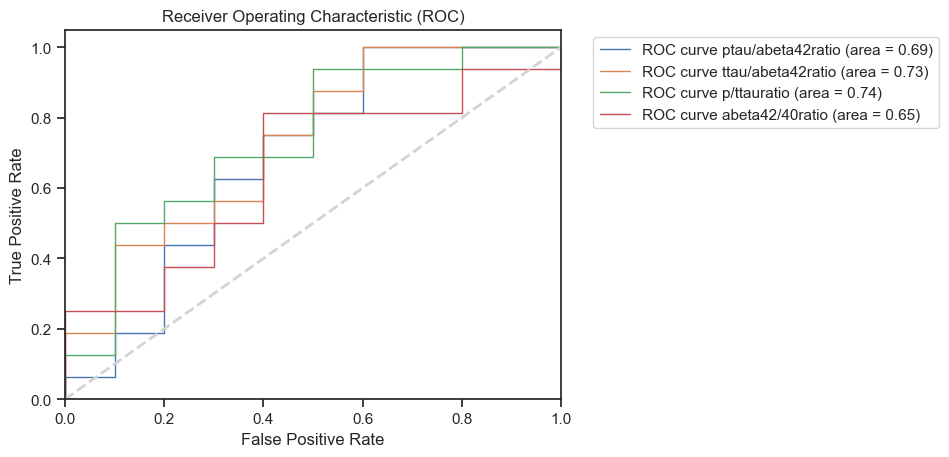

In [104]:
#Ripa Ratios

# Encode cognitive state
ratio['cognitive_state_encoded'] = ratio['Cognitive Status'].map({'No dementia': 0, 'Dementia': 1})

# Features and target
X1 = ratio[['ptau/abeta42ratio']]
X2 = ratio[['ttau/abeta42ratio']]
X3 = ratio[['p/ttauratio']]
X4 = ratio[['abeta42/40ratio']]

y = ratio['cognitive_state_encoded']

# Split the data
X1_train, X1_test, y_train, y_test = train_test_split(X1, y, test_size=0.3, random_state=42)
X2_train, X2_test, _, _ = train_test_split(X2, y, test_size=0.3, random_state=42)
X3_train, X3_test, _, _ = train_test_split(X3, y, test_size=0.3, random_state=42)
X4_train, X4_test, _, _ = train_test_split(X4, y, test_size=0.3, random_state=42)

# Initialize and train the models
model1 = LogisticRegression()
model1.fit(X1_train, y_train)

model2 = LogisticRegression()
model2.fit(X2_train, y_train)

model3 = LogisticRegression()
model3.fit(X3_train, y_train)

model4 = LogisticRegression()
model4.fit(X4_train, y_train)
# Predict probabilities
y_scores1 = model1.predict_proba(X1_test)[:, 1]
y_scores2 = model2.predict_proba(X2_test)[:, 1]
y_scores3 = model3.predict_proba(X3_test)[:, 1]
y_scores4 = model4.predict_proba(X4_test)[:, 1]
# Calculate ROC curves and AUCs
fpr1, tpr1, _ = roc_curve(y_test, y_scores1)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(y_test, y_scores2)
roc_auc2 = auc(fpr2, tpr2)

fpr3, tpr3, _ = roc_curve(y_test, y_scores3)
roc_auc3 = auc(fpr3, tpr3)

fpr4, tpr4, _ = roc_curve(y_test, y_scores4)
roc_auc4 = auc(fpr4, tpr4)

# Plot ROC Curves
plt.figure()
plt.plot(fpr1, tpr1, lw=1, label='ROC curve ptau/abeta42ratio (area = %0.2f)' % roc_auc1)  
plt.plot(fpr2, tpr2, lw=1, label='ROC curve ttau/abeta42ratio (area = %0.2f)' % roc_auc2) 
plt.plot(fpr3, tpr3, lw=1, label='ROC curve p/ttauratio (area = %0.2f)' % roc_auc3)
plt.plot(fpr4, tpr4, lw=1, label='ROC curve abeta42/40ratio (area = %0.2f)' % roc_auc4)

plt.plot([0, 1], [0, 1], color='#d3d3d3', lw=2, linestyle='--') 


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

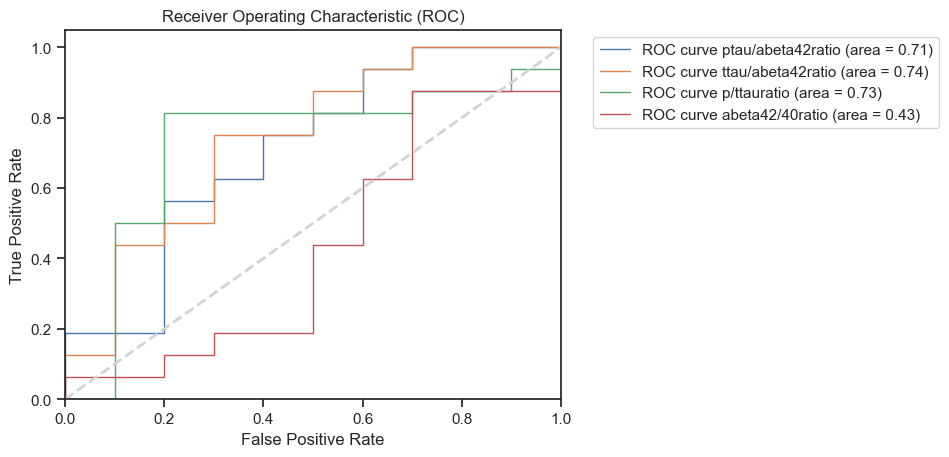

In [105]:
#Guchl Ratios
# Encode cognitive state
ratio['cognitive_state_encoded'] = ratio['Cognitive Status'].map({'No dementia': 0, 'Dementia': 1})

# Features and target
X1 = ratio[['guhclptau/abeta42']]
X2 = ratio[['guhclttau/abeta42']]
X3 = ratio[['guhclp/ttau']]
X4 = ratio[['guhclabeta']]

y = ratio['cognitive_state_encoded']

# Split the data
X1_train, X1_test, y_train, y_test = train_test_split(X1, y, test_size=0.3, random_state=42)
X2_train, X2_test, _, _ = train_test_split(X2, y, test_size=0.3, random_state=42)
X3_train, X3_test, _, _ = train_test_split(X3, y, test_size=0.3, random_state=42)
X4_train, X4_test, _, _ = train_test_split(X4, y, test_size=0.3, random_state=42)

# Initialize and train the models
model1 = LogisticRegression()
model1.fit(X1_train, y_train)

model2 = LogisticRegression()
model2.fit(X2_train, y_train)

model3 = LogisticRegression()
model3.fit(X3_train, y_train)

model4 = LogisticRegression()
model4.fit(X4_train, y_train)
# Predict probabilities
y_scores1 = model1.predict_proba(X1_test)[:, 1]
y_scores2 = model2.predict_proba(X2_test)[:, 1]
y_scores3 = model3.predict_proba(X3_test)[:, 1]
y_scores4 = model4.predict_proba(X4_test)[:, 1]
# Calculate ROC curves and AUCs
fpr1, tpr1, _ = roc_curve(y_test, y_scores1)
roc_auc1 = auc(fpr1, tpr1)

fpr2, tpr2, _ = roc_curve(y_test, y_scores2)
roc_auc2 = auc(fpr2, tpr2)

fpr3, tpr3, _ = roc_curve(y_test, y_scores3)
roc_auc3 = auc(fpr3, tpr3)

fpr4, tpr4, _ = roc_curve(y_test, y_scores4)
roc_auc4 = auc(fpr4, tpr4)

# Plot ROC Curves
plt.figure()
plt.plot(fpr1, tpr1, lw=1, label='ROC curve ptau/abeta42ratio (area = %0.2f)' % roc_auc1)  
plt.plot(fpr2, tpr2, lw=1, label='ROC curve ttau/abeta42ratio (area = %0.2f)' % roc_auc2) 
plt.plot(fpr3, tpr3, lw=1, label='ROC curve p/ttauratio (area = %0.2f)' % roc_auc3)
plt.plot(fpr4, tpr4, lw=1, label='ROC curve abeta42/40ratio (area = %0.2f)' % roc_auc4)

plt.plot([0, 1], [0, 1], color='#d3d3d3', lw=2, linestyle='--')  # Light grey dashed line


plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [106]:
#Ranked correlation between Cognitive exams(MMSE, CASI) and the ratios above, and the individual biomarkers pTau, tTau
#abeta42, and abeta40

In [107]:
#specific dataset for MMSE scores
mmse= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\MMSE.xlsx')
#specific dataset for CASI scores
casi= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\CASI.xlsx')

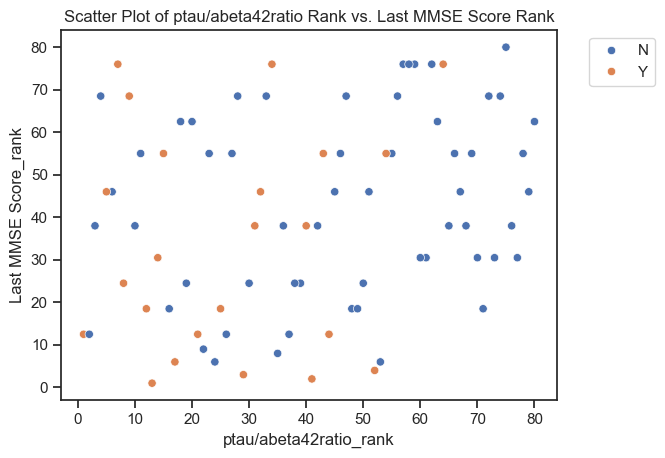

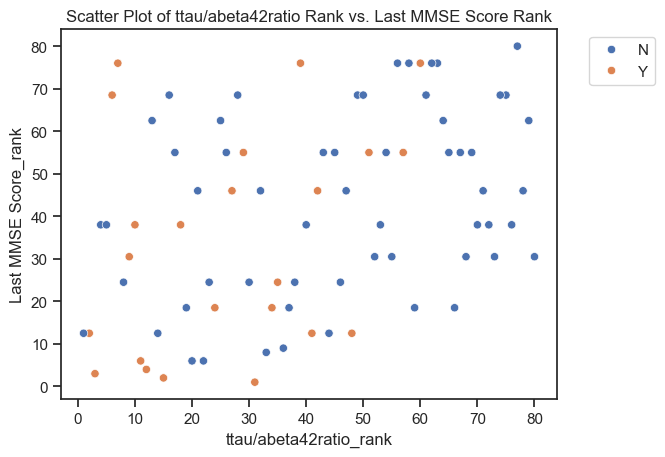

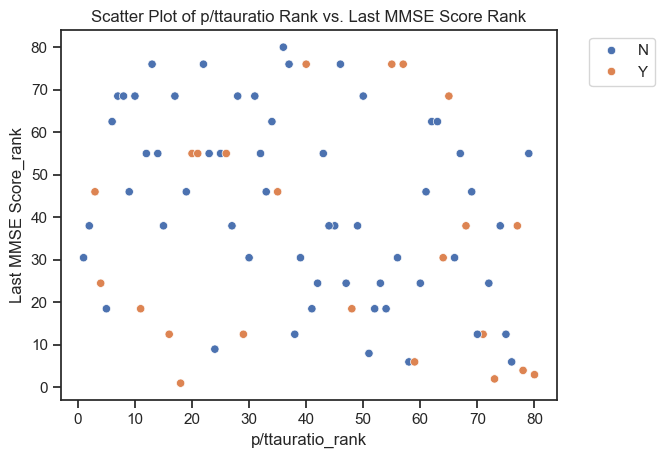

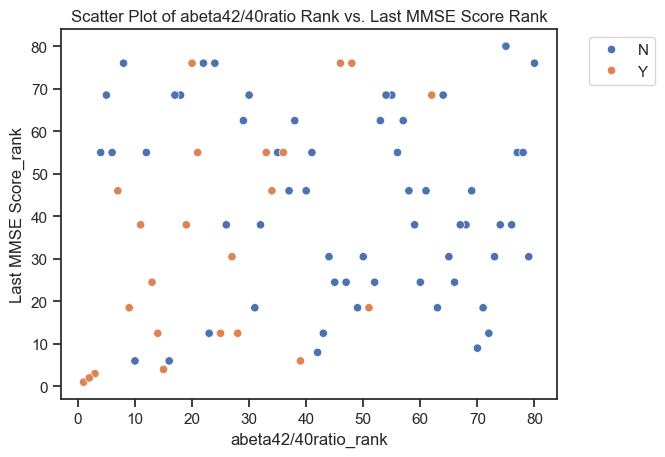

In [108]:
#Ranked correlation between MMSE score and Ripa Ratios

mmse['Last MMSE Score_rank']= mmse['Last MMSE Score'].rank()

variables = ['ptau/abeta42ratio', 'ttau/abeta42ratio', 'p/ttauratio', 'abeta42/40ratio']


# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    mmse[f'{var}_rank'] = mmse[var].rank()
    
    # Create the scatter plot
    sns.scatterplot(data=mmse, x=f'{var}_rank', y='Last MMSE Score_rank', hue='APOE4 Status')
    plt.title(f'Scatter Plot of {var} Rank vs. Last MMSE Score Rank')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [109]:
#MMSE-ripa test spearman correlation 

# Define your variables
variables = ['ptau/abeta42ratio', 'ttau/abeta42ratio', 'p/ttauratio', 'abeta42/40ratio']

# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(mmse[var], mmse['Last MMSE Score'])
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                   Spearman r   p-value
ptau/abeta42ratio    0.249970  0.025336
ttau/abeta42ratio    0.369288  0.000749
p/ttauratio         -0.288829  0.009368
abeta42/40ratio      0.101772  0.369034


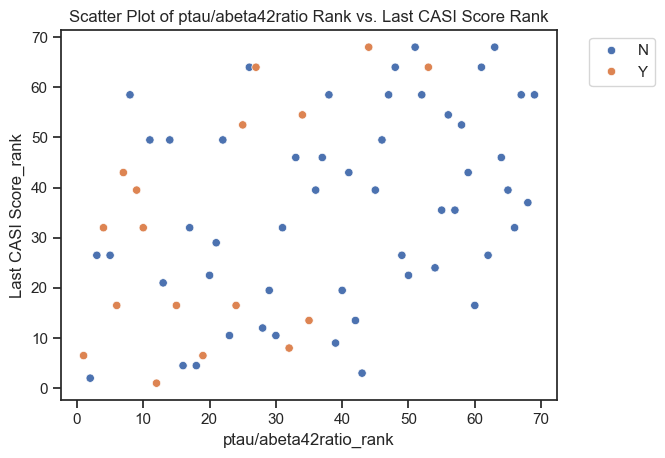

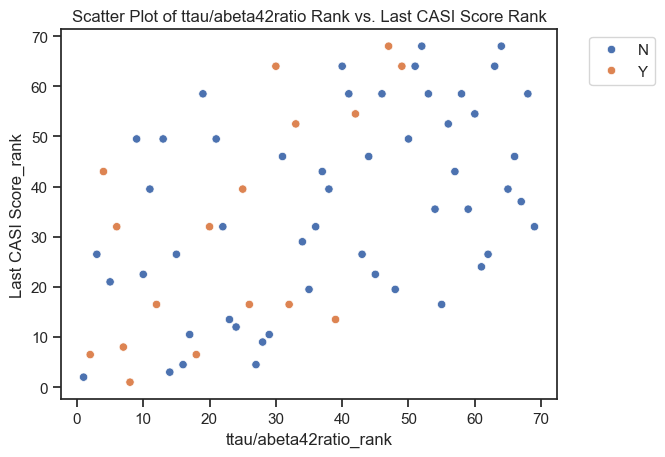

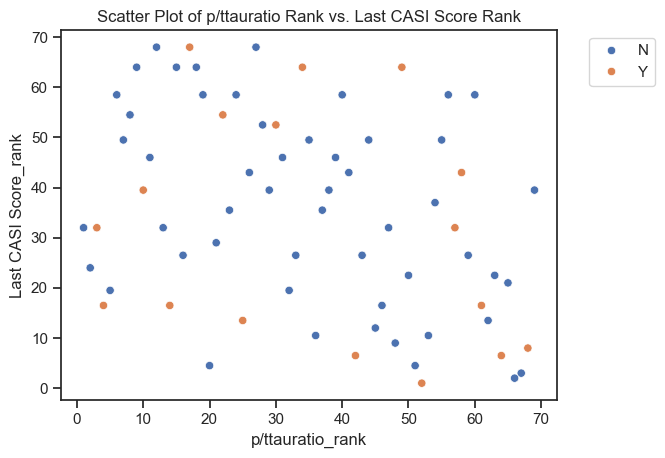

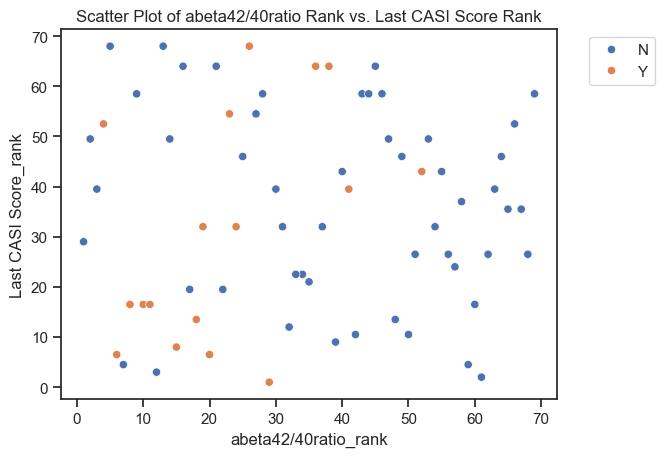

In [110]:
#Ranked correlation between CASI score and Ripa Ratios
casi['Last CASI Score_rank']= casi['Last CASI Score'].rank()

variables = ['ptau/abeta42ratio', 'ttau/abeta42ratio', 'p/ttauratio', 'abeta42/40ratio']


# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    casi[f'{var}_rank'] = casi[var].rank()
    
    sns.scatterplot(data=casi, x=f'{var}_rank', y='Last CASI Score_rank', hue='APOE4 Status')
    plt.title(f'Scatter Plot of {var} Rank vs. Last CASI Score Rank')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [111]:
#CASI-ripa test spearman correlation 

# Define your variables
variables = ['ptau/abeta42ratio', 'ttau/abeta42ratio', 'p/ttauratio', 'abeta42/40ratio']

# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(casi[var], casi['Last CASI Score'])
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                   Spearman r   p-value
ptau/abeta42ratio    0.391810  0.000871
ttau/abeta42ratio    0.496781  0.000014
p/ttauratio         -0.359544  0.002412
abeta42/40ratio      0.010279  0.933191


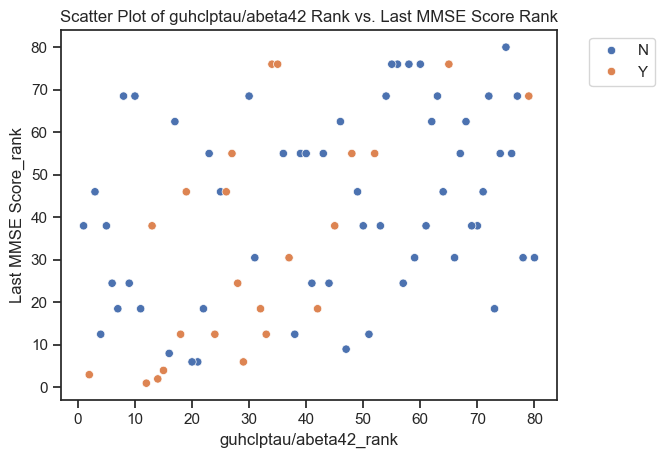

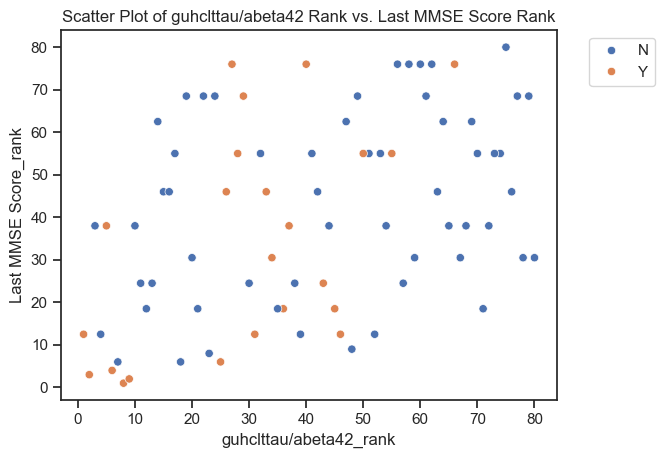

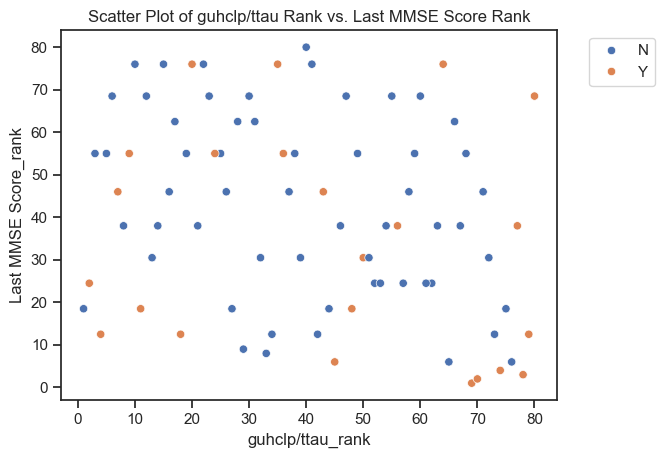

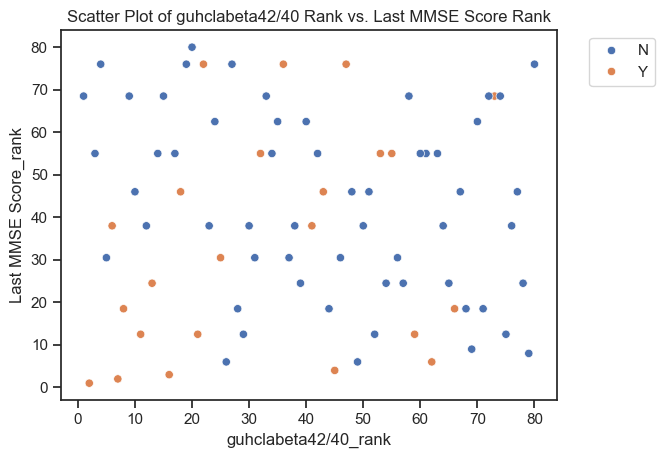

In [112]:
#Ranked correlation between MMSE score and Guhcl Ratios
mmse['Last MMSE Score_rank']= mmse['Last MMSE Score'].rank()

variables = ['guhclptau/abeta42', 'guhclttau/abeta42', 'guhclp/ttau', 'guhclabeta42/40']


# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    mmse[f'{var}_rank'] = mmse[var].rank()

    sns.scatterplot(data=mmse, x=f'{var}_rank', y='Last MMSE Score_rank', hue='APOE4 Status')
    plt.title(f'Scatter Plot of {var} Rank vs. Last MMSE Score Rank')

    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [113]:
#MMSE-GUHCL test spearman correlation 

# Define your variables
variables = ['guhclptau/abeta42', 'guhclttau/abeta42', 'guhclp/ttau', 'guhclabeta42/40']

# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(mmse[var], mmse['Last MMSE Score'])
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                   Spearman r   p-value
guhclptau/abeta42    0.420562  0.000103
guhclttau/abeta42    0.419339  0.000108
guhclp/ttau         -0.283980  0.010686
guhclabeta42/40     -0.064490  0.569810


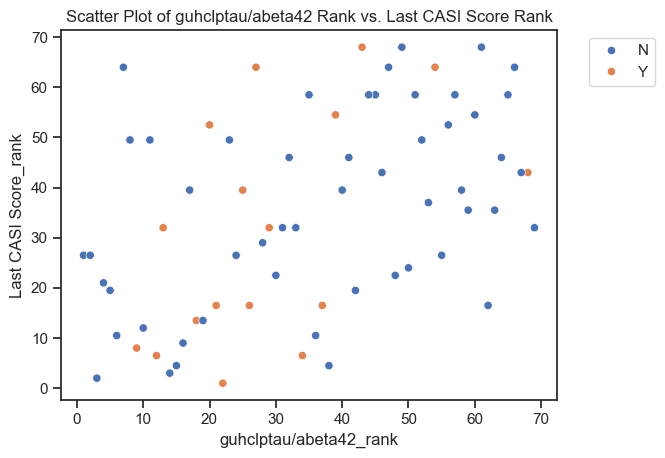

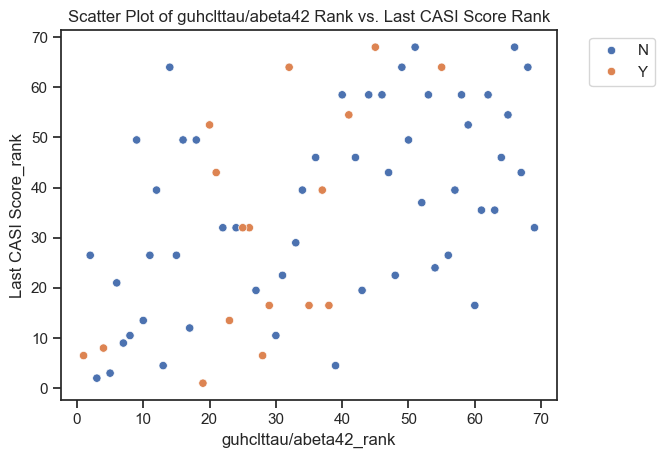

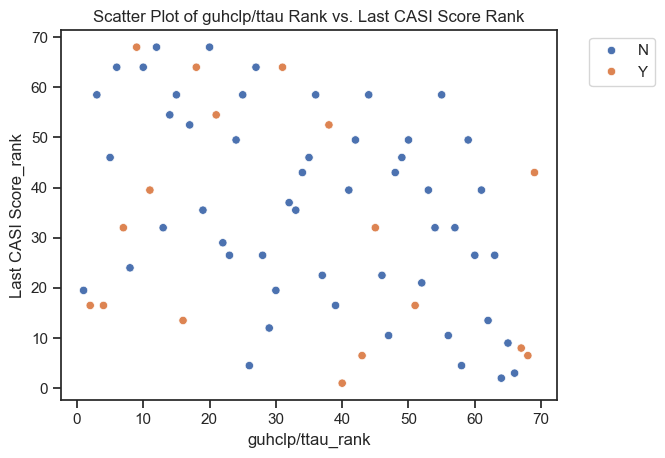

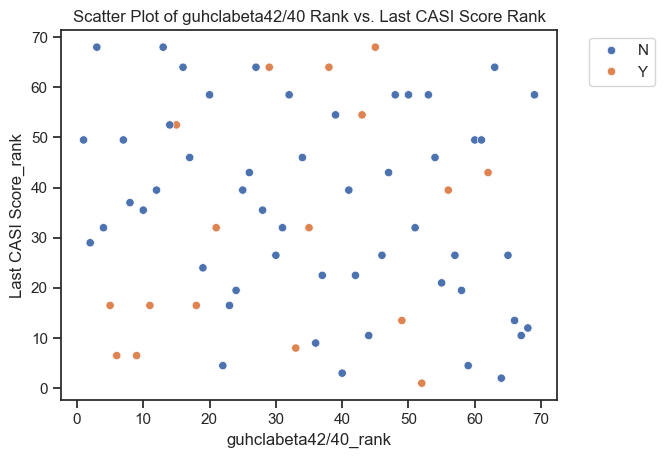

In [114]:
#Ranked correlation between CASI score and Guhcl Ratios
casi['Last CASI Score_rank']= casi['Last CASI Score'].rank()

variables = ['guhclptau/abeta42', 'guhclttau/abeta42', 'guhclp/ttau', 'guhclabeta42/40']


# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    casi[f'{var}_rank'] = casi[var].rank()
    sns.scatterplot(data=casi, x=f'{var}_rank', y='Last CASI Score_rank', hue='APOE4 Status')

    plt.title(f'Scatter Plot of {var} Rank vs. Last CASI Score Rank')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

In [115]:
#CASI-GUHCL test spearman correlation 

# Define your variables
variables = ['guhclptau/abeta42', 'guhclttau/abeta42', 'guhclp/ttau', 'guhclabeta42/40']

# Create a dictionary to store the results
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(casi[var], casi['Last CASI Score'])
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                   Spearman r   p-value
guhclptau/abeta42    0.471778  0.000043
guhclttau/abeta42    0.520486  0.000005
guhclp/ttau         -0.384640  0.001102
guhclabeta42/40     -0.101771  0.405358


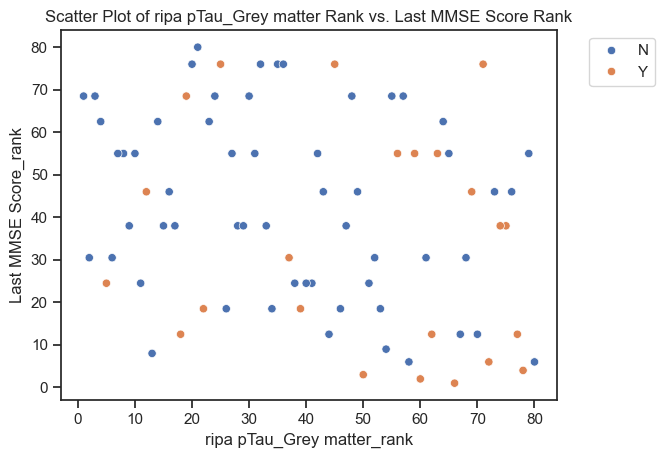

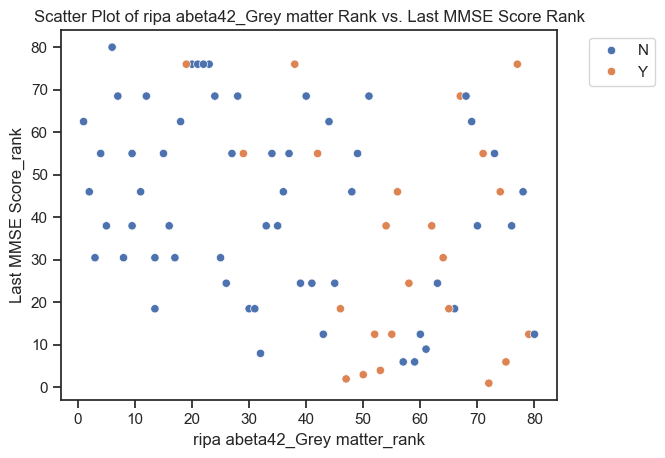

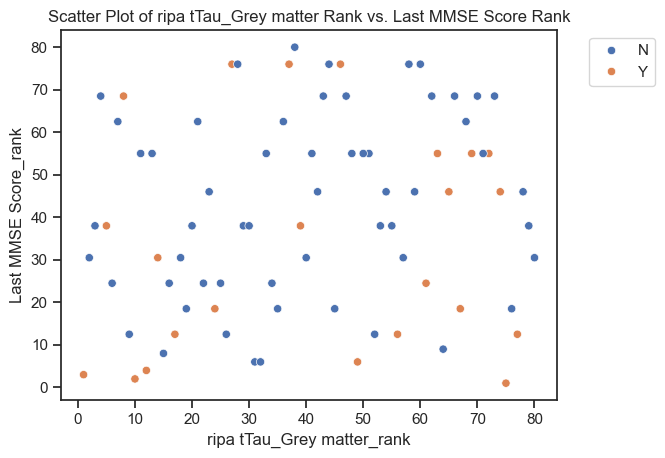

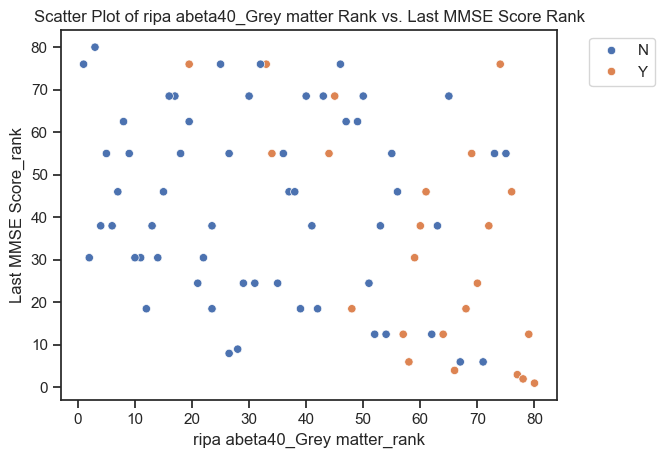

In [116]:
#Ranked correlation between MMSE score and Individual Ripa biomarker

mmse['Last MMSE Score_rank']= mmse['Last MMSE Score'].rank()

variables = ['ripa pTau_Grey matter', 'ripa abeta42_Grey matter', 'ripa tTau_Grey matter', 'ripa abeta40_Grey matter']

# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    mmse[f'{var}_rank'] = mmse[var].rank()
    
    # Create the scatter plot
    sns.scatterplot(data=mmse, x=f'{var}_rank', y='Last MMSE Score_rank', hue='APOE4 Status')
    
    # Add a title to each plot
    plt.title(f'Scatter Plot of {var} Rank vs. Last MMSE Score Rank')
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Show the plot
    plt.show()

In [117]:
#Individual biomarker RIPA-MMSE sparman test
variables = ['ripa pTau_Grey matter', 'ripa abeta42_Grey matter', 'ripa tTau_Grey matter', 'ripa abeta40_Grey matter']

results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(mmse[var], mmse['Last MMSE Score'])
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                          Spearman r   p-value
ripa pTau_Grey matter      -0.279543  0.012031
ripa abeta42_Grey matter   -0.325526  0.003214
ripa tTau_Grey matter       0.165827  0.141547
ripa abeta40_Grey matter   -0.319349  0.003884


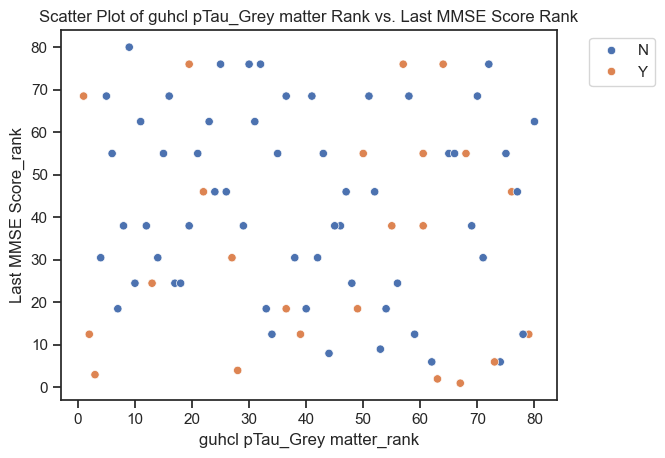

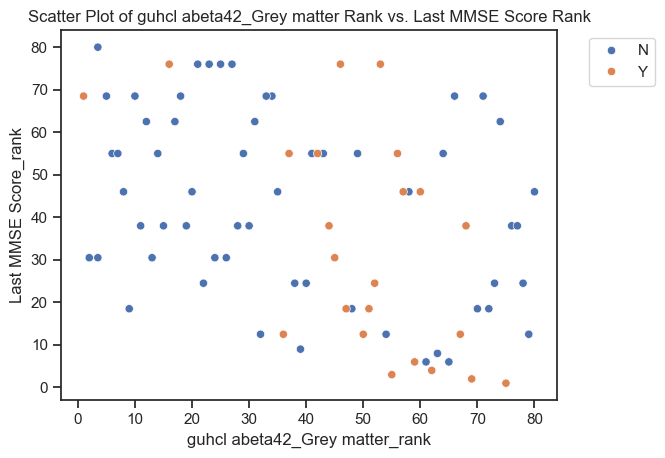

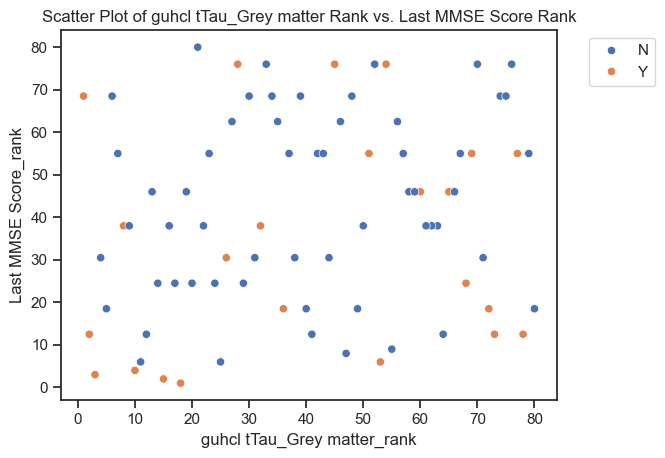

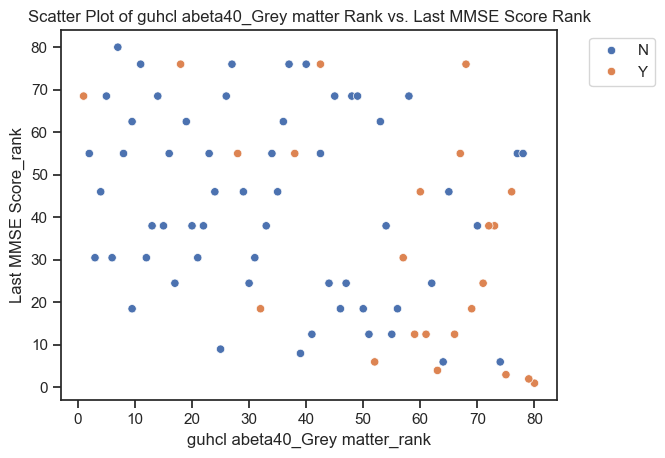

In [118]:
#Ranked correlation between MMSE score and Individual Guhcl biomarker

mmse['Last MMSE Score_rank']= mmse['Last MMSE Score'].rank()

variables = ['guhcl pTau_Grey matter', 'guhcl abeta42_Grey matter', 'guhcl tTau_Grey matter', 'guhcl abeta40_Grey matter']

# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    mmse[f'{var}_rank'] = mmse[var].rank()
    
    # Create the scatter plot
    sns.scatterplot(data=mmse, x=f'{var}_rank', y='Last MMSE Score_rank', hue='APOE4 Status')
    
    # Add a title to each plot
    plt.title(f'Scatter Plot of {var} Rank vs. Last MMSE Score Rank')
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Show the plot
    plt.show()

In [119]:
#Individual biomarker GUHCL-MMSE spearman test
variables = ['guhcl pTau_Grey matter', 'guhcl abeta42_Grey matter', 'guhcl tTau_Grey matter', 'guhcl abeta40_Grey matter']

results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(mmse[var].rank(), mmse['Last MMSE Score'].rank())
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                           Spearman r   p-value
guhcl pTau_Grey matter      -0.090205  0.426179
guhcl abeta42_Grey matter   -0.407849  0.000173
guhcl tTau_Grey matter       0.189622  0.092054
guhcl abeta40_Grey matter   -0.366880  0.000816


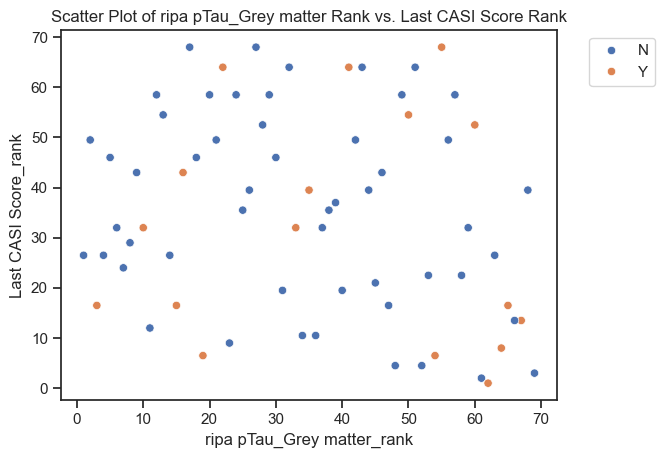

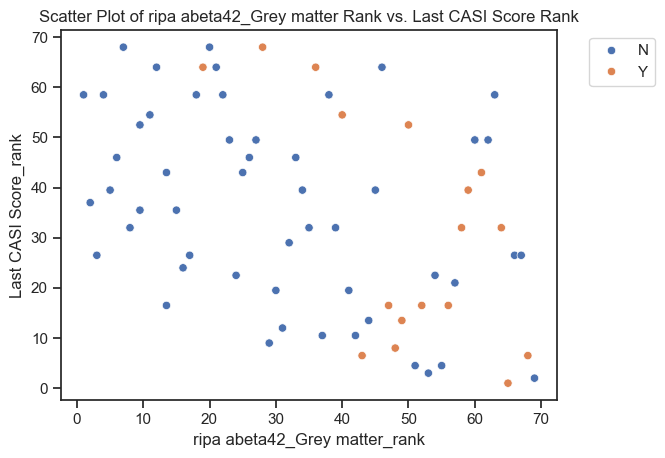

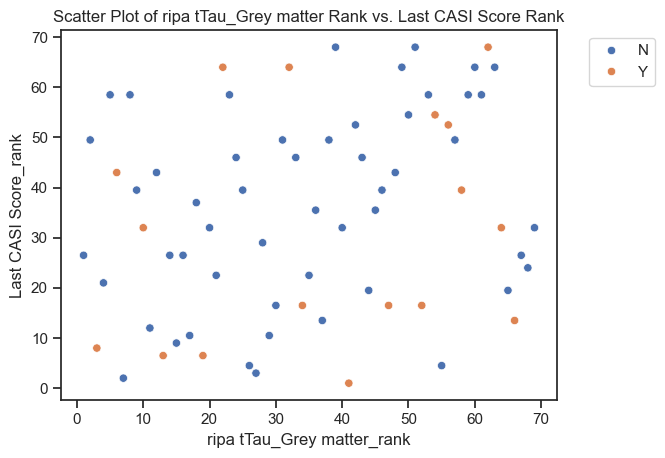

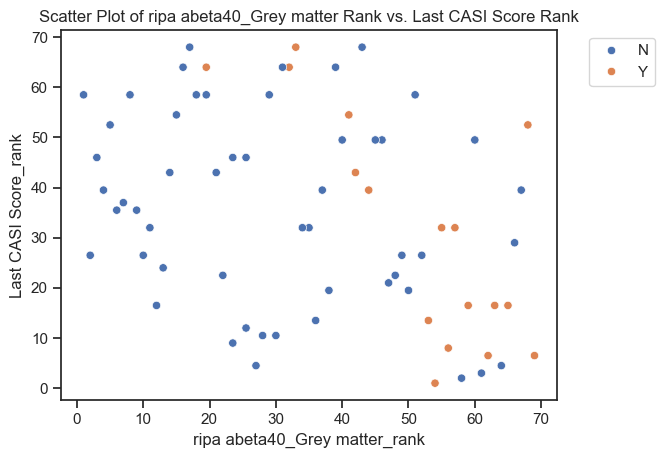

In [120]:
#Ranked correlation between CASI score and Individual Ripa biomarker

casi['Last CASI Score_rank']= casi['Last CASI Score'].rank()

variables = ['ripa pTau_Grey matter', 'ripa abeta42_Grey matter', 'ripa tTau_Grey matter', 'ripa abeta40_Grey matter']

# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    casi[f'{var}_rank'] = casi[var].rank()
    
    # Create the scatter plot
    sns.scatterplot(data=casi, x=f'{var}_rank', y='Last CASI Score_rank', hue='APOE4 Status')
    
    # Add a title to each plot
    plt.title(f'Scatter Plot of {var} Rank vs. Last CASI Score Rank')
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Show the plot
    plt.show()

In [121]:
#Individual biomarker RIPA-CASI spearman test
variables =['ripa pTau_Grey matter', 'ripa abeta42_Grey matter', 'ripa tTau_Grey matter', 'ripa abeta40_Grey matter']
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(casi[var].rank(), casi['Last CASI Score'].rank())
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                          Spearman r   p-value
ripa pTau_Grey matter      -0.204657  0.091631
ripa abeta42_Grey matter   -0.428610  0.000239
ripa tTau_Grey matter       0.243269  0.043989
ripa abeta40_Grey matter   -0.360240  0.002362


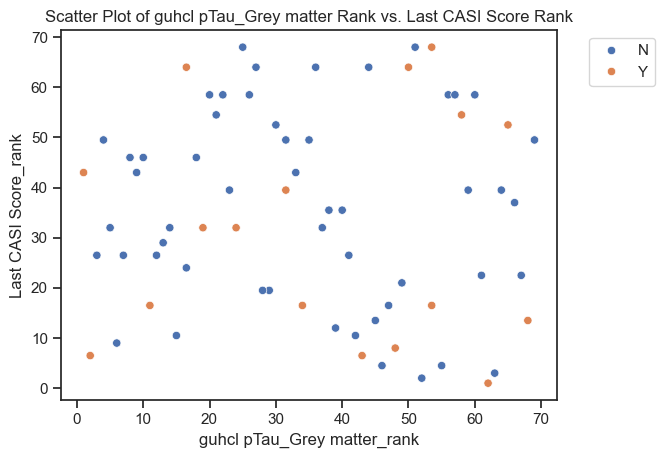

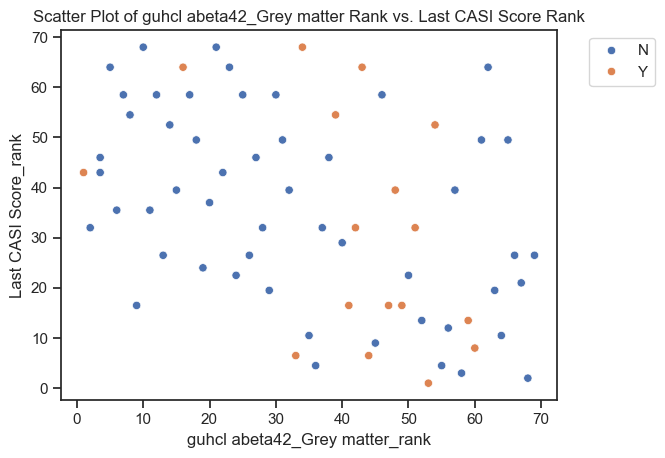

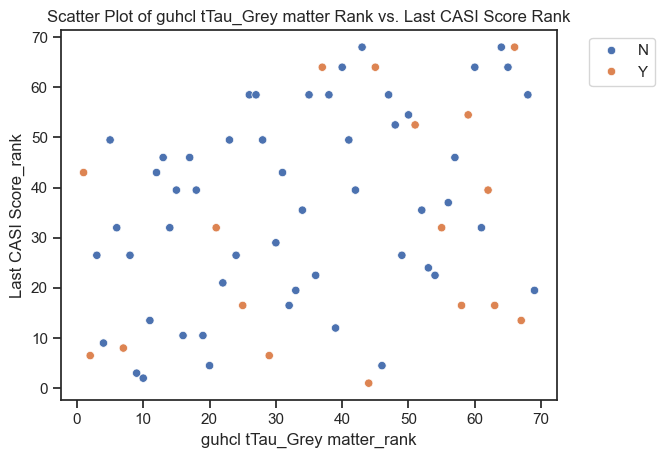

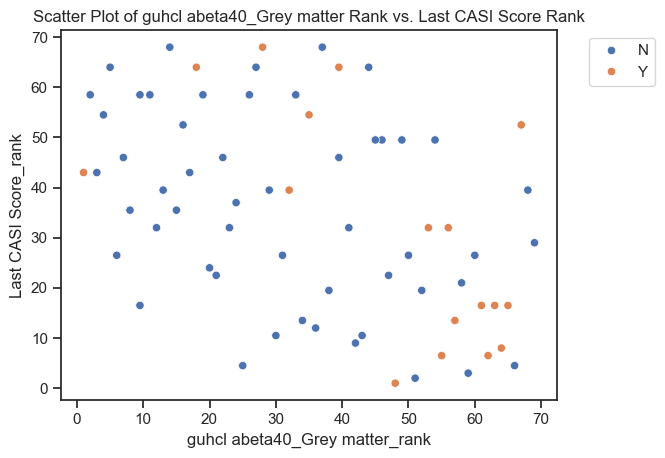

In [122]:
#Ranked correlation between CASI score and Individual Guhcl biomarker
casi['Last CASI Score_rank']= casi['Last CASI Score'].rank()

variables = ['guhcl pTau_Grey matter', 'guhcl abeta42_Grey matter', 'guhcl tTau_Grey matter', 'guhcl abeta40_Grey matter']

# Loop through each variable and create a scatter plot
for var in variables:
    # Rank-transform the current variable
    casi[f'{var}_rank'] = casi[var].rank()
    
    # Create the scatter plot
    sns.scatterplot(data=casi, x=f'{var}_rank', y='Last CASI Score_rank', hue='APOE4 Status')
    
    # Add a title to each plot
    plt.title(f'Scatter Plot of {var} Rank vs. Last CASI Score Rank')
    
    # Move the legend outside the plot
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    
    # Show the plot
    plt.show()

In [123]:
#Individual biomarker Guhcl-CASI spearman test
variables =['guhcl pTau_Grey matter', 'guhcl abeta42_Grey matter', 'guhcl tTau_Grey matter', 'guhcl abeta40_Grey matter']
results = {}

# Loop through each variable and calculate the Spearman's correlation with ptau
for var in variables:
    correlation, p_value = spearmanr(casi[var].rank(), casi['Last CASI Score'].rank())
    results[var] = {'Spearman r': correlation, 'p-value': p_value}

# Convert the results to a DataFrame for easier viewing
results_df = pd.DataFrame(results).T

# Display the results
print(results_df)

                           Spearman r   p-value
guhcl pTau_Grey matter      -0.052213  0.670050
guhcl abeta42_Grey matter   -0.443833  0.000134
guhcl tTau_Grey matter       0.325231  0.006396
guhcl abeta40_Grey matter   -0.453166  0.000092


In [124]:
#Heatmap of all biomarkers, pearson'r correlation and p_value is labeled

In [125]:
#specific dataset created for heatmap
heatmap_data= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\heatmap_dataset.xlsx')
heatmap_data

,number of AT8 positive cells_Grey matter,number of 6e10 positive objects_Grey matter,number of Iba1 positive cells_Grey matter,number of activated Iba1 positive cells_Grey matter,number of inactivated Iba1 positive cells_Grey matter,number of NeuN positive cells_Grey matter,number of NeuN weak positive cells_Grey matter,number of NeuN moderate positive cells_Grey matter,number of NeuN strong positive cells_Grey matter,number of Hematoxylin positive nuclei_Grey matter,total GFAP positive area_Grey matter,ripa abeta40_Grey matter,ripa abeta42_Grey matter,ripa tTau_Grey matter,ripa pTau_Grey matter,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,0,24,4669,2862,1807,18890,286,8270,10334,50839,1.092193e+06,0.019621,0.971579,1552.414737,1.901053,1.409474,9.487368,93.387368,1.493684
1,42,444,7727,6715,1012,31147,132,11979,19036,106782,1.393363e+06,0.215789,2.744211,756.090526,2.737895,1.015616,7.822105,76.413684,1.580000
2,1,16,3522,1621,1901,31548,192,9570,21786,75445,2.491895e+06,0.000598,0.147158,313.525263,2.615789,0.100708,0.610526,31.521053,1.068421
3,371,3257,9093,8907,186,30277,88,7819,22370,103328,6.546220e+06,60.766316,80.266316,318.528421,7.412632,91.172000,226.900000,44.423158,2.397895
4,1,421,4192,2449,1743,8444,7526,891,27,63669,1.384955e+06,5.136842,16.156842,107.348421,1.327368,28.778000,121.266000,10.516842,0.545263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,6,3229,3622,3302,320,41110,280,7123,33707,91856,1.649817e+06,1.593684,29.892632,611.000000,4.404211,3.465263,114.392632,48.078947,2.775789
80,199,3891,17977,17289,688,18727,13133,5423,171,106826,1.107429e+07,7.130526,33.637895,417.894737,3.662105,10.273684,111.835790,59.477895,1.818947
81,1561,14188,8824,1480,7344,20673,8132,8789,3752,117450,1.499963e+07,21.423158,53.878947,147.565263,11.489474,46.231579,954.656984,14.405263,1.678947
82,88,4359,3218,2780,438,15930,265,5317,10348,47147,7.858908e+06,2.421053,19.195789,1124.777383,3.129474,26.908000,1694.563486,262.382105,1.815789


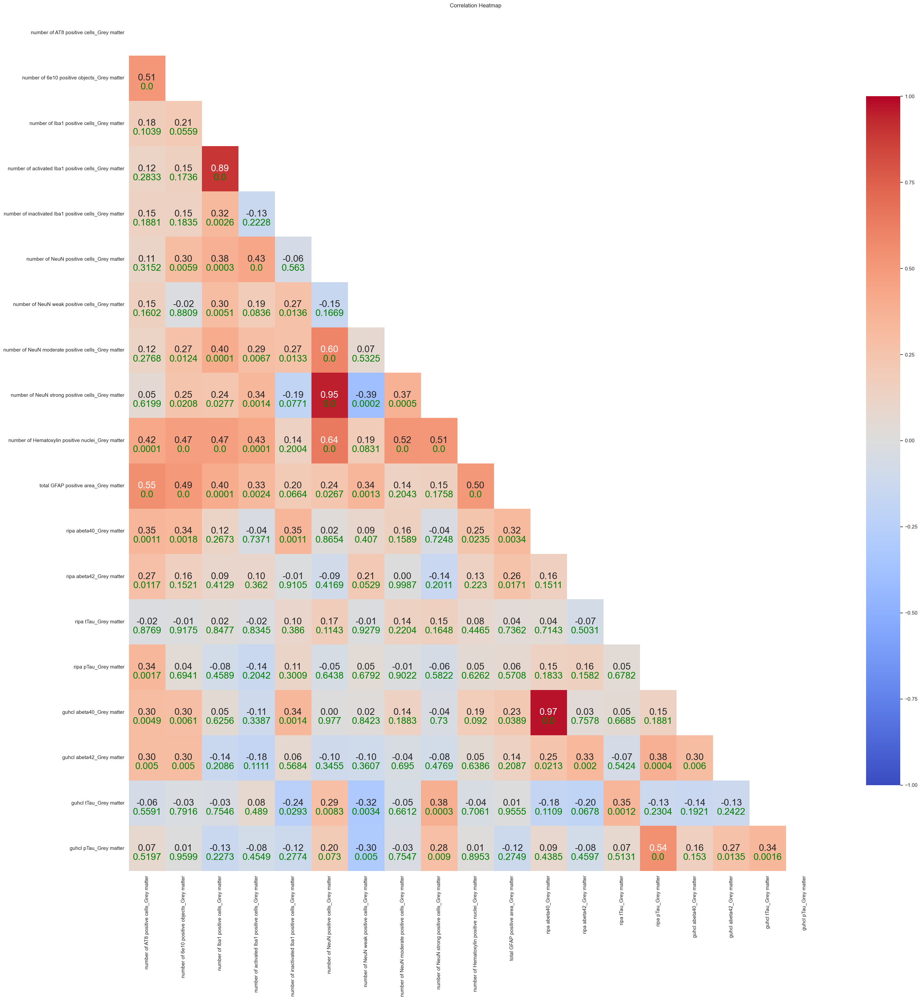

In [126]:
data = heatmap_data

# Calculate the correlation matrix using Pearson correlation coefficients
corr_matrix = data.corr(method='pearson')

# Calculate the p-values for the correlation coefficients
pvalues = round(data.corr(method=lambda x, y: pearsonr(x, y)[1]), 4)

# Generate the heatmap of the correlation matrix
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.set(style='white')
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', mask=mask,annot_kws={"size": 20}, cbar_kws={'shrink': 0.8},
            ax=ax, vmin=-1, vmax=1, center=0)

# Update the heatmap labels with correlation coefficients and p-values
for i in range(corr_matrix.shape[0]):
    for j in range(corr_matrix.shape[1]):
        if i >= j:
            continue
        corr = '{:f}'.format(corr_matrix.iloc[i, j]),
        pval = pvalues.iloc[i, j]
        ax.text(j+0.5, i+0.7, corr, ha='center', va='center', fontsize=20, color='white')
        ax.text(i+0.5, j+0.7, pval, ha='center', va='center', fontsize=20, color='green')

plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()
plt.close()

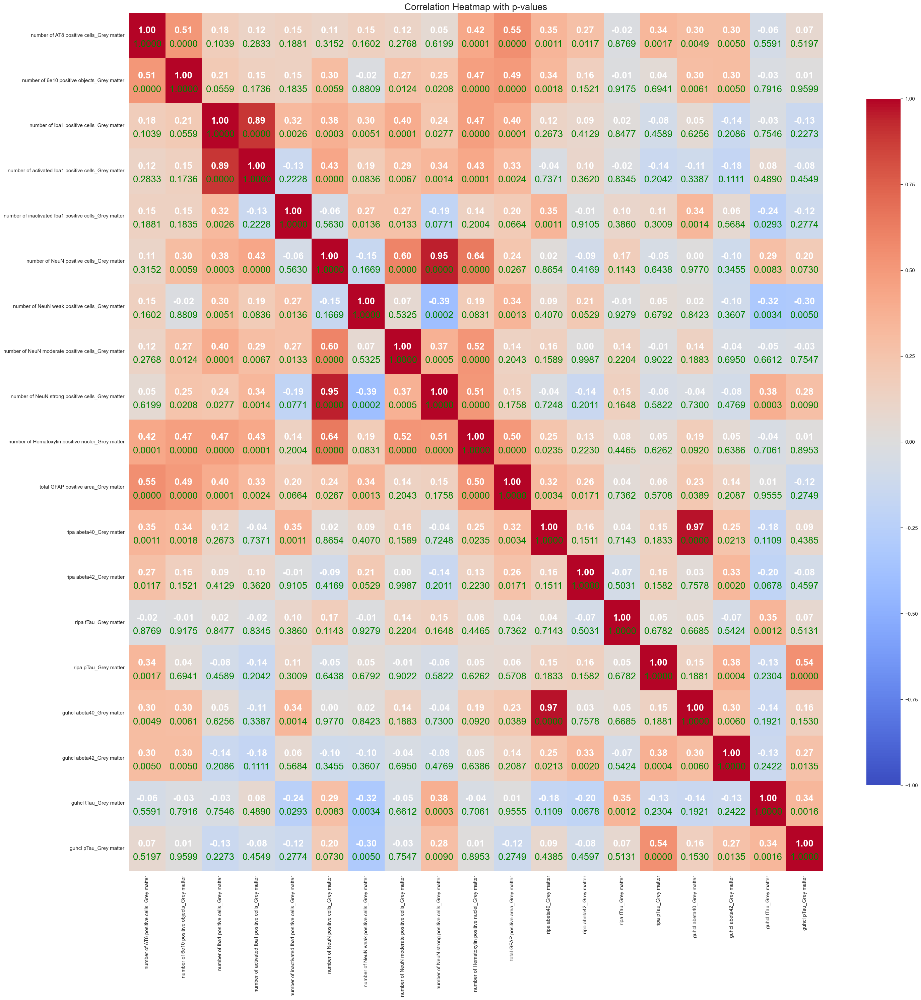

In [127]:
data = heatmap_data  # replace with your actual DataFrame

# Calculate the correlation matrix using Pearson correlation coefficients
corr_matrix = data.corr(method='pearson')

# Calculate the p-values for the correlation coefficients
pvalues = data.corr(method=lambda x, y: pearsonr(x, y)[1]).round(4)

# Generate the heatmap without annotations (we'll add them manually)
sns.set(style='white')
fig, ax = plt.subplots(figsize=(30,30))  # Adjust figsize as needed
sns.heatmap(corr_matrix, annot=False, fmt='', cmap='coolwarm', cbar_kws={'shrink': 0.8}, 
            ax=ax, vmin=-1, vmax=1, center=0)

# Manually add the correlation coefficients and p-values with different colors
for i in range(corr_matrix.shape[0]):
    for j in range(corr_matrix.shape[1]):
        corr = f'{corr_matrix.iloc[i, j]:.2f}'
        pval = f'{pvalues.iloc[i, j]:.4f}'
        
        # Set text color based on desired appearance
        ax.text(j + 0.5, i + 0.4, corr, 
                ha='center', va='center', fontsize=20, color='white', fontweight='bold')
        ax.text(j + 0.5, i + 0.7, pval, 
                ha='center', va='center', fontsize=20, color='green')

# Optional: Adjust the title and layout
plt.title('Correlation Heatmap with p-values', fontsize=20)
plt.tight_layout()
plt.show()

In [128]:
data = heatmap_data  

# Calculate the correlation matrix using Pearson correlation coefficients
corr_matrix = data.corr(method='pearson')

# Calculate the p-values for the correlation coefficients
pvalues = data.corr(method=lambda x, y: pearsonr(x, y)[1]).round(4)

# Combine the correlation matrix and p-values into a single DataFrame
corr_with_pvalues = corr_matrix.applymap(lambda x: f'{x:.2f}') + " (p=" + pvalues.applymap(lambda x: f'{x:.4f}') + ")"

# Display the combined DataFrame
print(corr_with_pvalues)
corr_with_pvalues.to_csv('correlation_with_pvalues.csv', index=True)

                                                   number of AT8 positive cells_Grey matter  \
number of AT8 positive cells_Grey matter                                    1.00 (p=1.0000)   
number of 6e10 positive objects_Grey matter                                 0.51 (p=0.0000)   
number of Iba1 positive cells_Grey matter                                   0.18 (p=0.1039)   
number of activated Iba1 positive cells_Grey ma...                          0.12 (p=0.2833)   
number of inactivated Iba1 positive cells_Grey ...                          0.15 (p=0.1881)   
number of NeuN positive cells_Grey matter                                   0.11 (p=0.3152)   
number of NeuN weak positive cells_Grey matter                              0.15 (p=0.1602)   
number of NeuN moderate positive cells_Grey matter                          0.12 (p=0.2768)   
number of NeuN strong positive cells_Grey matter                            0.05 (p=0.6199)   
number of Hematoxylin positive nuclei_Grey matter 

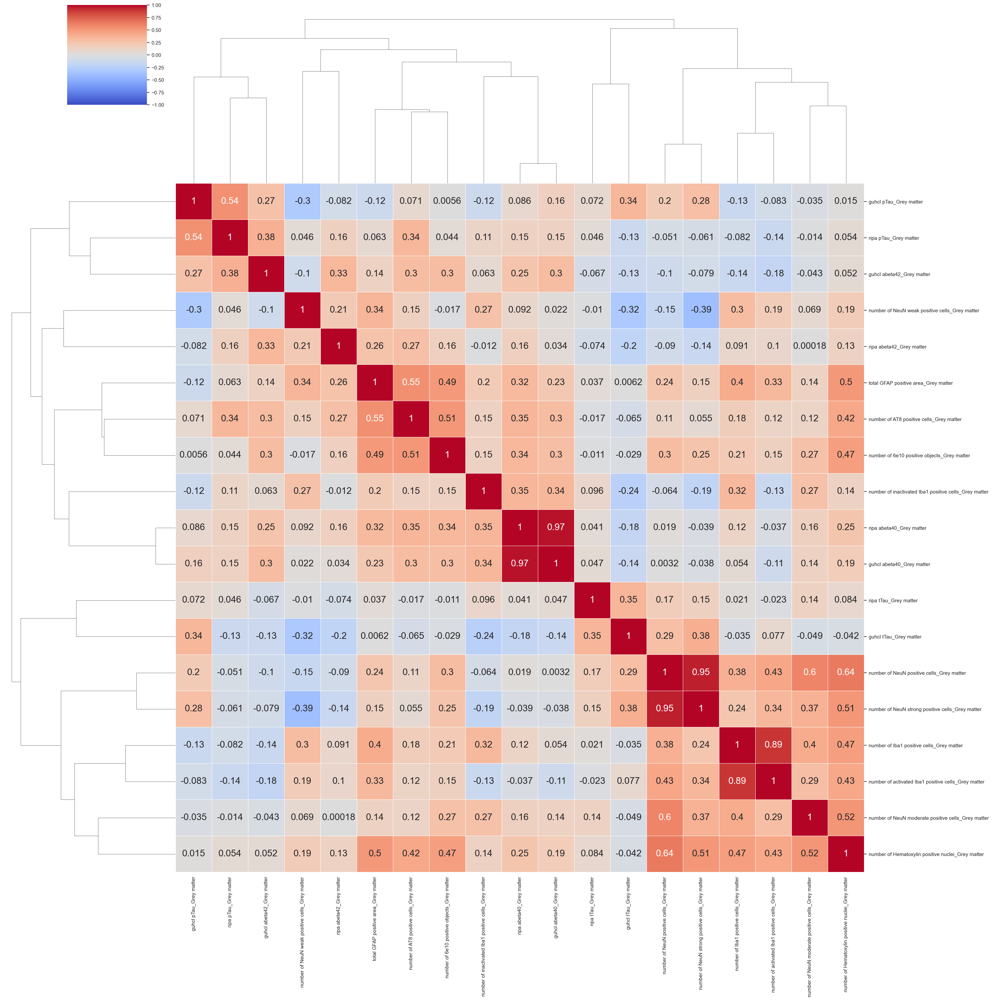

In [129]:
heatmap=sns.clustermap(data=heatmap_data.corr(),linewidth=.5, annot= True,annot_kws={"size": 20}, cmap="coolwarm",
                       vmin=-1, vmax=1,figsize=(30,30),
                      cbar_pos=(0.07,0.9, 0.08,0.1))

In [130]:
#Density of the biomarker dataset created for density heatmap
heatmap_den= pd.read_excel(r'C:\Users\GGTHELEGEND\Desktop\densityheatmap.xlsx')
heatmap_den

,number of AT8 positive cells per area_Grey matter,number of 6e10 positive objects per area_Grey matter,number of Iba1 positive cells per area_Grey matter,number of activated Iba1 positive cells per area_Grey matter,number of inactivated Iba1 positive cells per area_Grey matter,number of NeuN positive cells per area_Grey matter,number of NeuN weak positive cells per area_Grey matter,number of NeuN moderate positive cells per area_Grey matter,number of NeuN strong positive cells per area_Grey matter,number of Hematoxylin positive nuclei per area_Grey matter,total GFAP positive area_Grey matter,ripa abeta40_Grey matter,ripa abeta42_Grey matter,ripa tTau_Grey matter,ripa pTau_Grey matter,guhcl abeta40_Grey matter,guhcl abeta42_Grey matter,guhcl tTau_Grey matter,guhcl pTau_Grey matter
0,0.000000e+00,4.100000e-07,0.000080,0.000049,0.000031,0.000319,0.000005,0.000140,1.744320e-04,0.000874,1.092193e+06,0.019621,0.971579,1552.414737,1.901053,1.409474,9.487368,93.387368,1.493684
1,3.850000e-07,4.740000e-06,0.000082,0.000072,0.000011,0.000292,0.000001,0.000112,1.783670e-04,0.000996,1.393363e+06,0.215789,2.744211,756.090526,2.737895,1.015616,7.822105,76.413684,1.580000
2,1.360000e-08,2.210000e-07,0.000049,0.000022,0.000026,0.000413,0.000003,0.000125,2.853370e-04,0.001055,2.491895e+06,0.000598,0.147158,313.525263,2.615789,0.100708,0.610526,31.521053,1.068421
3,4.470000e-06,4.070000e-05,0.000114,0.000111,0.000002,0.000368,0.000001,0.000095,2.715700e-04,0.001258,6.546220e+06,60.766316,80.266316,318.528421,7.412632,91.172000,226.900000,44.423158,2.397895
4,1.330000e-08,5.390000e-06,0.000054,0.000031,0.000022,0.000105,0.000093,0.000011,3.350000e-07,0.000808,1.384955e+06,5.136842,16.156842,107.348421,1.327368,28.778000,121.266000,10.516842,0.545263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,6.240000e-08,3.260000e-05,0.000037,0.000033,0.000003,0.000421,0.000003,0.000073,3.455600e-04,0.000936,1.649817e+06,1.593684,29.892632,611.000000,4.404211,3.465263,114.392632,48.078947,2.775789
80,1.830000e-06,3.500000e-05,0.000161,0.000155,0.000006,0.000166,0.000117,0.000048,1.520000e-06,0.000957,1.107429e+07,7.130526,33.637895,417.894737,3.662105,10.273684,111.835790,59.477895,1.818947
81,1.710000e-05,1.532680e-04,0.000095,0.000016,0.000079,0.000224,0.000088,0.000095,4.070000e-05,0.001334,1.499963e+07,21.423158,53.878947,147.565263,11.489474,46.231579,954.656984,14.405263,1.678947
82,2.030000e-06,1.016320e-04,0.000075,0.000065,0.000010,0.000375,0.000006,0.000125,2.439130e-04,0.001137,7.858908e+06,2.421053,19.195789,1124.777383,3.129474,26.908000,1694.563486,262.382105,1.815789


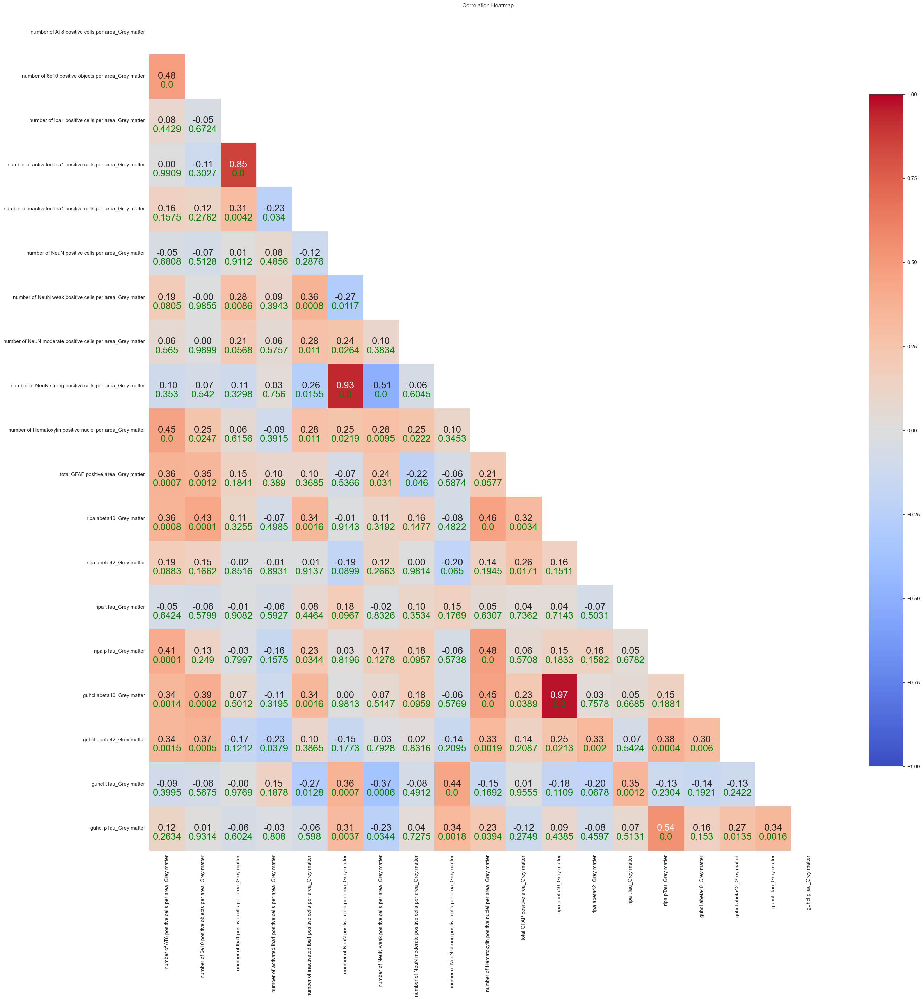

In [131]:
data = heatmap_den

# Calculate the correlation matrix using Pearson correlation coefficients
corr_matrix = data.corr(method='pearson')

# Calculate the p-values for the correlation coefficients
pvalues = round(data.corr(method=lambda x, y: pearsonr(x, y)[1]), 4)

# Generate the heatmap of the correlation matrix
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
sns.set(style='white')
fig, ax = plt.subplots(figsize=(30, 30))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', mask=mask,annot_kws={"size": 20}, cbar_kws={'shrink': 0.8},
            ax=ax, vmin=-1, vmax=1, center=0)

# Update the heatmap labels with correlation coefficients and p-values
for i in range(corr_matrix.shape[0]):
    for j in range(corr_matrix.shape[1]):
        if i >= j:
            continue
        corr = '{:f}'.format(corr_matrix.iloc[i, j]),
        pval = pvalues.iloc[i, j]
        ax.text(j+0.5, i+0.7, corr, ha='center', va='center', fontsize=20, color='white')
        ax.text(i+0.5, j+0.7, pval, ha='center', va='center', fontsize=20, color='green')

plt.title('Correlation Heatmap')
plt.tight_layout()
plt.show()
plt.close()

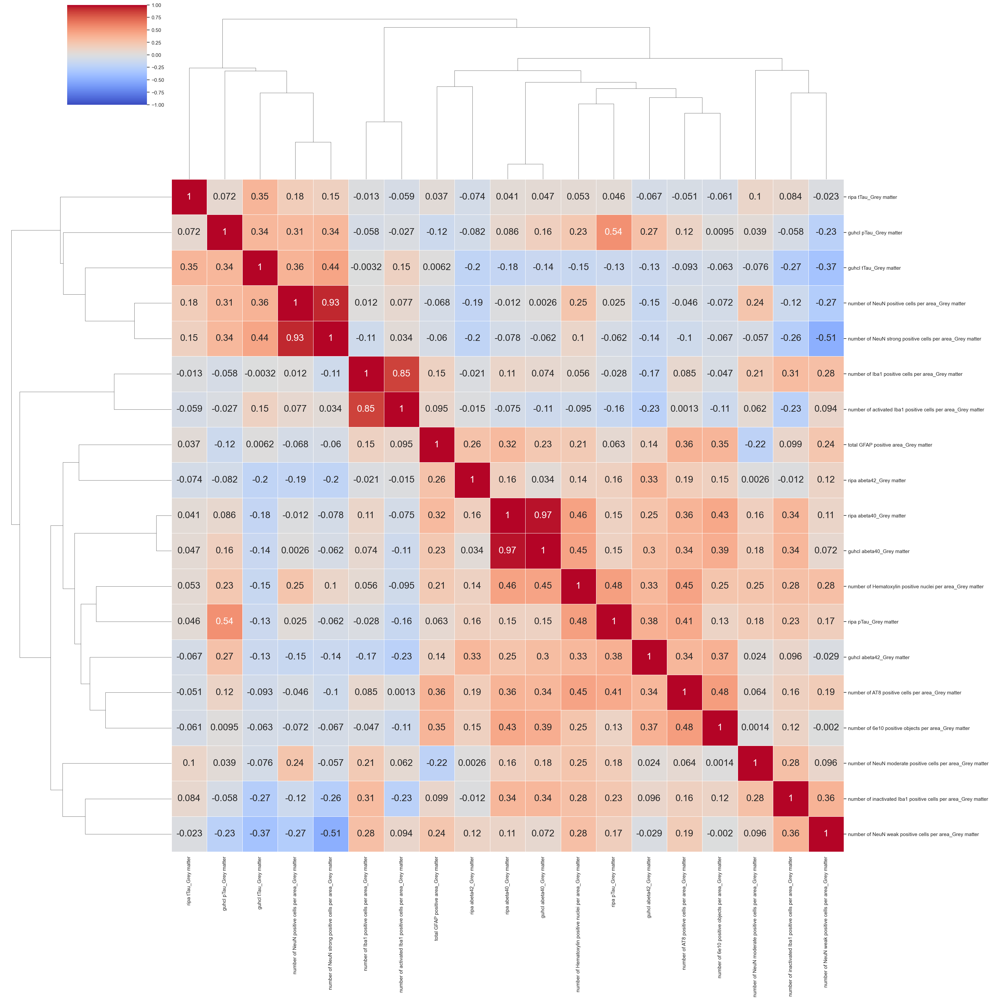

In [132]:
heatmap=sns.clustermap(data=heatmap_den.corr(),linewidth=.5, annot= True,annot_kws={"size": 20}, cmap="coolwarm",
                       vmin=-1, vmax=1,figsize=(30,30),
                      cbar_pos=(0.07,0.9, 0.08,0.1))

In [133]:
#Thank you, Thats the END! ANY INQUIES AND QUESTION EMAIL wanziyu666888@gmail.com